#Importing necessary Libraries:-


In [ ]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt
from scipy import stats
from sklearn.metrics import mean_absolute_error , mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential

from tensorflow.keras.layers import Conv1D, MaxPooling1D, LSTM, Dropout, Dense
from tensorflow.keras.models import Sequential

###Importing the dataset:-

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


###Reading the data:-

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/EXL_EQ_2023_Dataset.csv')


In [ ]:
df.head()

,PM2.5,NO,NO2,NOx,NH3,SO2,CO,Ozone,Benzene,Toluene,Temp,RH,WS,WD,SR,BP,AT,RF,TOT-RF,VWS,Eth-Benzene,Xylene,MP-Xylene,O Xylene,CH4,City,State,Population as of 2021 (Estimated),Latitude,Longitude,Total Length of Roads as of 2019(Km),Length of National Highways as of 2022(Km),Railway Route as of 2021(Km),Forest Cover as of 2021(sq Km),Number of Factories as of 2020 (Units),Installed Capacity of Power as of 2022(Megawatt),Death Rate as of 2020(Per 1000),CNG ONLY,DIESEL,DIESEL/HYBRID,ELECTRIC(BOV),PETROL,PETROL/CNG,PETROL/HYBRID,Time Periods
0,549.256878,181.010975,91.247522,188.364425,79.707417,10.175812,3.520142,23.411029,NaN,NaN,7.75,93.437813,0.253857,168.075862,9.051957,920.809192,6.750637,0.0,0.0,-0.009470,NaN,NaN,NaN,NaN,NaN,Delhi,Delhi,31181377,28.652,77.232,16170,157,184,195,3259,7617,3.6,"13,968","10,528",32,"12,379","3,60,440","21,424","5,313",2020-01-01 00:00
1,435.438303,194.247049,79.661701,203.481853,66.258913,11.615925,3.464807,29.331609,9.827428,NaN,7.49,95.270911,0.233245,191.715055,20.697426,931.952234,5.987430,0.0,0.0,-0.012548,NaN,NaN,NaN,NaN,NaN,Delhi,Delhi,31181377,28.652,77.232,16170,157,184,195,3259,7617,3.6,"13,968","10,528",32,"12,379","3,60,440","21,424","5,313",2020-01-01 04:00
2,453.312378,112.499494,121.740909,153.914993,74.356791,10.590183,2.460498,30.172308,9.085975,NaN,9.45,67.747391,0.805488,109.699775,258.230668,917.925289,11.305717,0.0,0.0,-0.004343,NaN,NaN,NaN,NaN,NaN,Delhi,Delhi,31181377,28.652,77.232,16170,157,184,195,3259,7617,3.6,"13,968","10,528",32,"12,379","3,60,440","21,424","5,313",2020-01-01 08:00
3,186.603123,56.922094,114.142207,91.504524,NaN,12.217971,1.405930,30.493537,3.884649,104.475114,11.32,51.006233,1.160145,96.542908,270.598584,903.761105,15.574849,0.0,0.0,0.054851,NaN,NaN,NaN,NaN,NaN,Delhi,Delhi,31181377,28.652,77.232,16170,157,184,195,3259,7617,3.6,"13,968","10,528",32,"12,379","3,60,440","21,424","5,313",2020-01-01 12:00
4,262.616309,77.363086,123.790340,117.065760,NaN,13.331616,2.692100,18.045684,5.605006,96.718827,10.22,69.689844,0.374948,156.633728,41.110706,915.620541,12.529418,0.0,0.0,0.054683,NaN,NaN,NaN,NaN,NaN,Delhi,Delhi,31181377,28.652,77.232,16170,157,184,195,3259,7617,3.6,"13,968","10,528",32,"12,379","3,60,440","21,424","5,313",2020-01-01 16:00


#Understanding the dataset:-

In [ ]:
df.shape

(223584, 45)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 223584 entries, 0 to 223583
Data columns (total 45 columns):
 #   Column                                            Non-Null Count   Dtype  
---  ------                                            --------------   -----  
 0   PM2.5                                             218044 non-null  float64
 1   NO                                                218735 non-null  float64
 2   NO2                                               218244 non-null  float64
 3   NOx                                               217612 non-null  float64
 4   NH3                                               217948 non-null  float64
 5   SO2                                               219700 non-null  float64
 6   CO                                                219762 non-null  float64
 7   Ozone                                             219154 non-null  float64
 8   Benzene                                           217487 non-null  float64
 9   Tolu

In [ ]:
df['City'].unique()

array(['Delhi', 'Ahmedabad', 'Gandhinagar', 'Lucknow', 'Varanasi',
       'Meerut', 'Prayagraj', 'Ghaziabad', 'Agra', 'Noida', 'Kanpur',
       'Moradabad', 'Guwahati', 'Faridabad', 'Gurugram', 'Jaipur', 'Kota',
       'Imphal', 'Thiruvananthapuram', 'Agartala', 'Gaya', 'Muzaffarpur',
       'Patna', 'Srinagar', 'Howrah', 'Kolkata', 'Bhopal', 'Gwalior',
       'Bengaluru', 'Raipur', 'Bhilai', 'Chandigarh', 'Chennai', 'Mumbai'],
      dtype=object)

In [ ]:
df['State'].unique()

array(['Delhi', 'Gujarat', 'Uttar Pradesh', 'Assam', 'Haryana',
       'Rajasthan', 'Manipur', 'Kerala', 'Tripura', 'Bihar',
       'Jammu and Kashmir', 'West Bengal', 'Madhya Pradesh', 'Karnataka',
       'Chhattisgarh', 'Chandigarh', 'Tamil Nadu', 'Maharashtra'],
      dtype=object)

In [ ]:
df['City'].value_counts()

Delhi                 6576
Kolkata               6576
Agartala              6576
Gaya                  6576
Muzaffarpur           6576
Patna                 6576
Srinagar              6576
Howrah                6576
Bhopal                6576
Ahmedabad             6576
Gwalior               6576
Bengaluru             6576
Raipur                6576
Bhilai                6576
Chandigarh            6576
Chennai               6576
Thiruvananthapuram    6576
Imphal                6576
Kota                  6576
Jaipur                6576
Gurugram              6576
Faridabad             6576
Guwahati              6576
Moradabad             6576
Kanpur                6576
Noida                 6576
Agra                  6576
Ghaziabad             6576
Prayagraj             6576
Meerut                6576
Varanasi              6576
Lucknow               6576
Gandhinagar           6576
Mumbai                6576
Name: City, dtype: int64

In [ ]:
df.isna().sum()

PM2.5                                                 5540
NO                                                    4849
NO2                                                   5340
NOx                                                   5972
NH3                                                   5636
SO2                                                   3884
CO                                                    3822
Ozone                                                 4430
Benzene                                               6097
Toluene                                              56554
Temp                                                172116
RH                                                   27211
WS                                                    7080
WD                                                    5809
SR                                                   16383
BP                                                   64451
AT                                                   215

In [ ]:
cities=df['City'].unique()

Text(0.5, 1.0, ' Total count of Null values of PM2.5 in different cities')

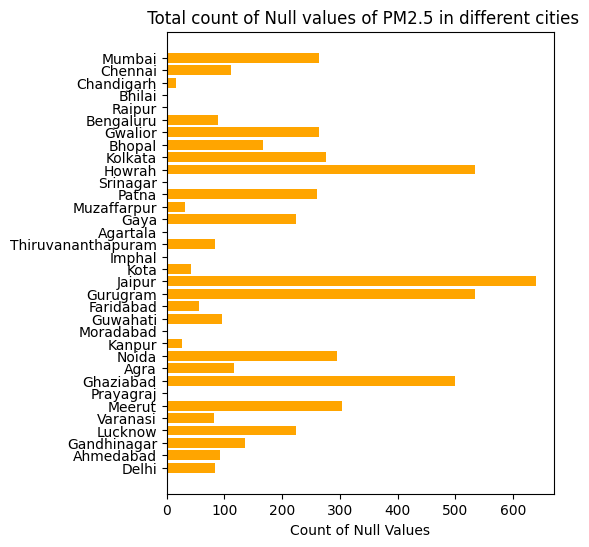

In [ ]:
#obtaining null values of pm2.5 city wise in a list
null_values_of_pm_of_all_cities=[]
for i in cities:
  dataframe=df[df['City']==i]
  x=dataframe['PM2.5'].isnull().sum()
  null_values_of_pm_of_all_cities.append(x)

#plotting a horizontal bar graph to visualise missing   
plt.barh(cities,null_values_of_pm_of_all_cities,color='orange')
plt.xlabel("Count of Null Values")
plt.rcParams['figure.figsize']=(5,6)
plt.title(" Total count of Null values of PM2.5 in different cities")

## Data Treatment

####Dropping rows with pm 2.5 as null

In [ ]:
df.dropna(subset=['PM2.5'], inplace=True)

#### Remove any columns with more than 75% missing values using the same method as before. Finally, we fill in the missing values with the mean or median of the column depending on the skewness of the data

In [ ]:

# Remove columns with more than 75% missing values
df = df.loc[:, df.isnull().mean() < 0.75]
#storing all the int and float datatype columns in num_cols variable.
num_cols = df.select_dtypes(include=['int', 'float']).columns

# Fill in missing values with mean or median depending on skewness
for col in num_cols:
    if df[col].isnull().sum() > 0:
        skewness = df[col].skew()
        if skewness < -1 or skewness > 1:
            # If the data is highly skewed, fill with median
            df[col] = df[col].fillna(df[col].median())
        else:
            # Otherwise, fill with mean
            df[col] = df[col].fillna(df[col].mean())

<ipython-input-48-a755ef2b652c>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].fillna(df[col].median())
<ipython-input-48-a755ef2b652c>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].fillna(df[col].median())
<ipython-input-48-a755ef2b652c>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/s

#### Converting the object datatype columns into Int, float or to datetime as per the Columns.

In [ ]:
df['Time Periods'] = pd.to_datetime(df['Time Periods'])
df['DIESEL'] = df['DIESEL'].str.replace(',', '').astype(int)
df['ELECTRIC(BOV)'] = df['ELECTRIC(BOV)'].str.replace(',', '').astype(int)
df['PETROL'] = df['PETROL'].str.replace(',', '').astype(int)
df['PETROL/CNG'] = df['PETROL/CNG'].str.replace(',', '').astype(int)
df['PETROL/HYBRID'] = df['PETROL/HYBRID'].str.replace(',', '').astype(int)

## Outlier removal

Box plot - used to identify outliers.
Z score method - used to remove the outliers.
-3 < z < 3

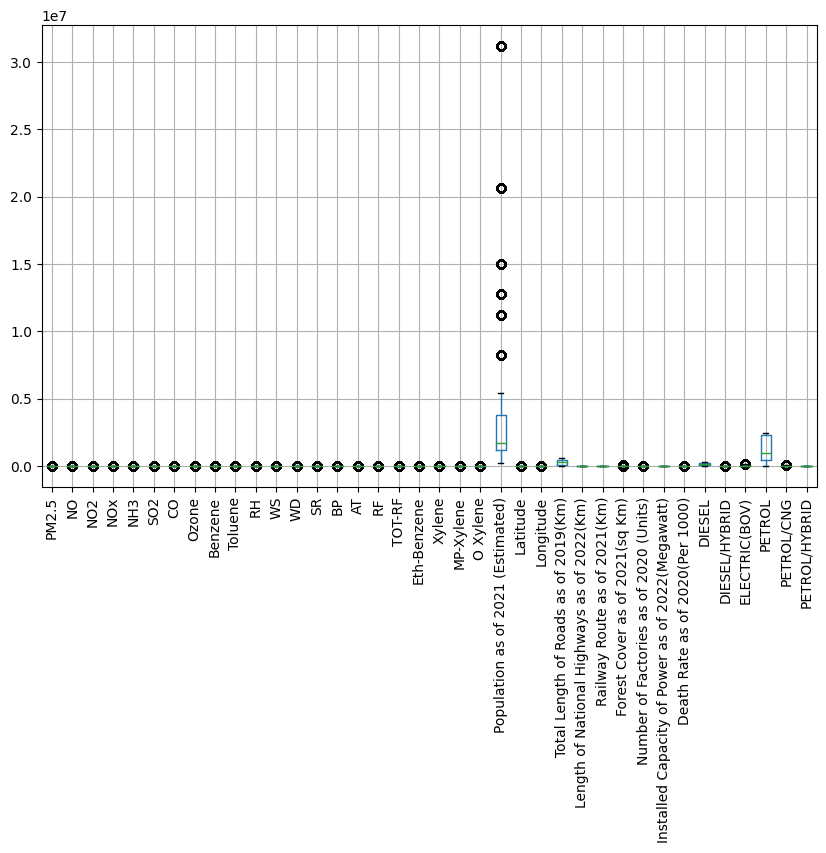

Rows with outliers after removal:
 [     0      0      0 ... 218041 218042 218042]


In [ ]:
num_cols = df.select_dtypes(include=['int', 'float']).columns

# Visualize the boxplots of the numerical columns
plt.figure(figsize=(10,6))
df[num_cols].boxplot()
plt.xticks(rotation=90)
plt.show()

# Calculate the z-scores of each value in the columns
z_scores = np.abs(stats.zscore(df[num_cols]))

# Find the rows with z-scores greater than 3 (i.e. outliers)
outlier_rows = np.where(z_scores > 3)[0]

# Remove the rows with outliers
df = df.drop(outlier_rows[0]).reset_index(drop=True)

# Verify that the outliers have been removed
z_scores = np.abs(stats.zscore(df[num_cols]))
outlier_rows = np.where(z_scores > 3)[0]
print("Rows with outliers after removal:\n", outlier_rows)

set "Time Period" as the index of the dataframe

In [ ]:
df.set_index('Time Periods', inplace=True)

In [ ]:
df

,PM2.5,NO,NO2,NOx,NH3,SO2,CO,Ozone,Benzene,Toluene,RH,WS,WD,SR,BP,AT,RF,TOT-RF,Eth-Benzene,Xylene,MP-Xylene,O Xylene,City,State,Population as of 2021 (Estimated),Latitude,Longitude,Total Length of Roads as of 2019(Km),Length of National Highways as of 2022(Km),Railway Route as of 2021(Km),Forest Cover as of 2021(sq Km),Number of Factories as of 2020 (Units),Installed Capacity of Power as of 2022(Megawatt),Death Rate as of 2020(Per 1000),CNG ONLY,DIESEL,DIESEL/HYBRID,ELECTRIC(BOV),PETROL,PETROL/CNG,PETROL/HYBRID
Time Periods,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01 04:00:00,435.438303,194.247049,79.661701,203.481853,66.258913,11.615925,3.464807,29.331609,9.827428,8.760000,95.270911,0.233245,191.715055,20.697426,931.952234,5.987430,0.0,0.0,3.320000,1.609331,2.276552,57.795295,Delhi,Delhi,31181377,28.652,77.232,16170,157,184,195,3259,7617,3.6,"13,968",10528,32,12379,360440,21424,5313
2020-01-01 08:00:00,453.312378,112.499494,121.740909,153.914993,74.356791,10.590183,2.460498,30.172308,9.085975,8.760000,67.747391,0.805488,109.699775,258.230668,917.925289,11.305717,0.0,0.0,3.320000,1.609331,2.276552,57.795295,Delhi,Delhi,31181377,28.652,77.232,16170,157,184,195,3259,7617,3.6,"13,968",10528,32,12379,360440,21424,5313
2020-01-01 12:00:00,186.603123,56.922094,114.142207,91.504524,20.911157,12.217971,1.405930,30.493537,3.884649,104.475114,51.006233,1.160145,96.542908,270.598584,903.761105,15.574849,0.0,0.0,3.320000,1.609331,2.276552,57.795295,Delhi,Delhi,31181377,28.652,77.232,16170,157,184,195,3259,7617,3.6,"13,968",10528,32,12379,360440,21424,5313
2020-01-01 16:00:00,262.616309,77.363086,123.790340,117.065760,20.911157,13.331616,2.692100,18.045684,5.605006,96.718827,69.689844,0.374948,156.633728,41.110706,915.620541,12.529418,0.0,0.0,3.320000,1.609331,2.276552,57.795295,Delhi,Delhi,31181377,28.652,77.232,16170,157,184,195,3259,7617,3.6,"13,968",10528,32,12379,360440,21424,5313
2020-01-01 20:00:00,725.493847,6.713976,19.115298,21.045806,20.911157,20.836571,3.120651,15.660919,2.187318,181.840455,89.073927,0.220029,185.221673,8.824925,926.206005,9.500768,0.0,0.0,3.320000,1.609331,2.276552,57.795295,Delhi,Delhi,31181377,28.652,77.232,16170,157,184,195,3259,7617,3.6,"13,968",10528,32,12379,360440,21424,5313
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 04:00:00,196.989121,60.688939,88.463906,104.906711,109.511292,53.108086,2.336561,55.699203,3.684526,7.927572,52.013116,0.377900,166.454792,2.340000,995.245259,24.010449,0.0,0.0,3.797530,1.671140,3.311368,80.770000,Mumbai,Maharashtra,20667655,19.073,72.883,636887,18317,5823,50798,25610,43446,5.5,"48,888",296334,155,136039,1741675,109369,22206
2022-12-31 08:00:00,187.428487,56.707438,93.311216,103.099160,106.682026,55.535340,2.235001,73.030945,3.388236,6.980251,44.785150,0.391317,160.467747,2.340000,999.299180,24.837833,0.0,0.0,3.472140,1.490215,2.900437,67.340000,Mumbai,Maharashtra,20667655,19.073,72.883,636887,18317,5823,50798,25610,43446,5.5,"48,888",296334,155,136039,1741675,109369,22206
2022-12-31 12:00:00,176.635690,28.382382,87.318776,80.058537,110.258415,53.701056,1.754315,93.830288,3.328736,6.993954,41.146981,0.452834,196.099311,2.340000,1007.410588,25.452565,0.0,0.0,3.552415,1.594616,2.774356,58.630000,Mumbai,Maharashtra,20667655,19.073,72.883,636887,18317,5823,50798,25610,43446,5.5,"48,888",296334,155,136039,1741675,109369,22206


In [ ]:
df.shape

(218043, 41)

In [ ]:
df.columns

Index(['PM2.5', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 'CO', 'Ozone', 'Benzene',
       'Toluene', 'RH', 'WS', 'WD', 'SR', 'BP', 'AT', 'RF', 'TOT-RF',
       'Eth-Benzene', 'Xylene', 'MP-Xylene', 'O Xylene', 'City', 'State',
       'Population as of 2021 (Estimated)', 'Latitude', 'Longitude',
       'Total Length of Roads as of 2019(Km)',
       'Length of National Highways as of 2022(Km)',
       'Railway Route as of 2021(Km)', 'Forest Cover as of 2021(sq Km)',
       'Number of Factories as of 2020 (Units)',
       'Installed Capacity of Power as of 2022(Megawatt)',
       'Death Rate as of 2020(Per 1000)', 'CNG ONLY', 'DIESEL',
       'DIESEL/HYBRID', 'ELECTRIC(BOV)', 'PETROL', 'PETROL/CNG',
       'PETROL/HYBRID'],
      dtype='object')

# EDA (Exploratory data analysis)


### Plotting charts to show the variation of PM2.5 with time for all cities

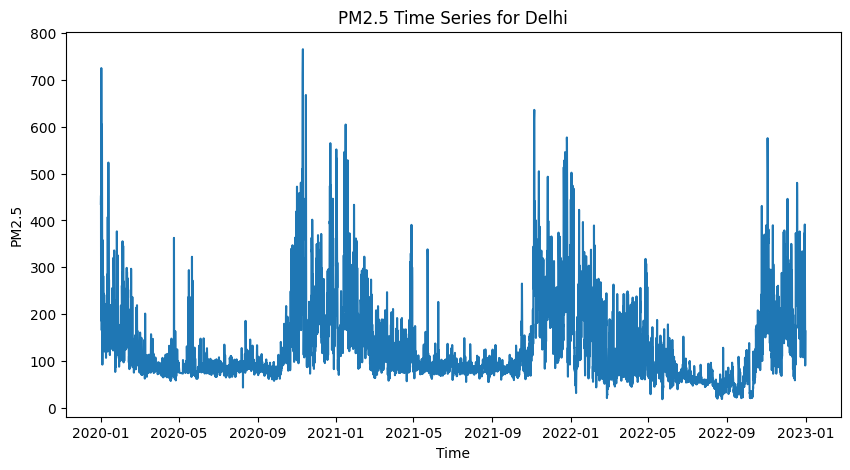

Descriptive Statistics for Delhi:
count    6491.000000
mean      133.540312
std        87.853150
min        18.281461
25%        79.043491
50%        97.954150
75%       164.189260
max       765.792213
Name: PM2.5, dtype: float64


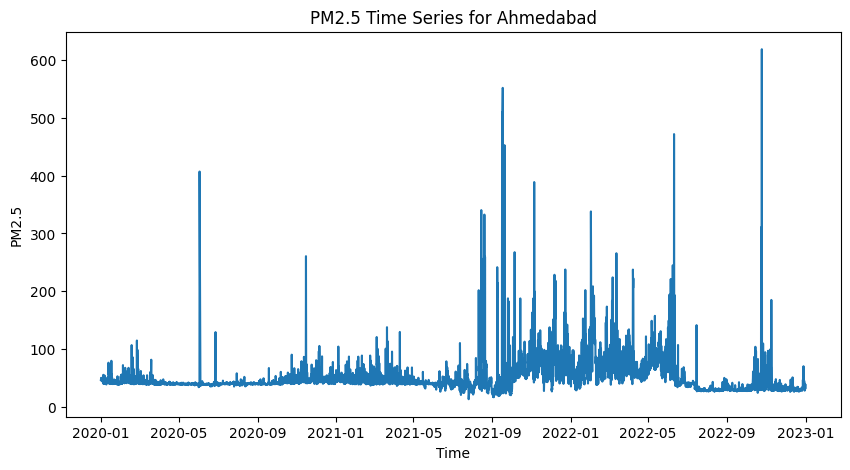

Descriptive Statistics for Ahmedabad:
count    6484.000000
mean       50.950747
std        33.574154
min        13.000788
25%        38.625755
50%        41.459890
75%        53.922683
max       618.847801
Name: PM2.5, dtype: float64


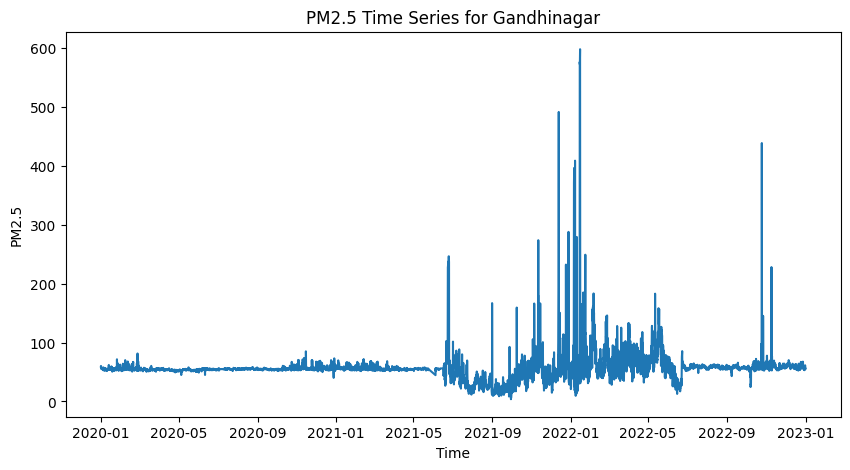

Descriptive Statistics for Gandhinagar:
count    6440.000000
mean       56.892138
std        26.776030
min         3.794726
25%        53.118737
50%        55.064512
75%        58.804027
max       597.709583
Name: PM2.5, dtype: float64


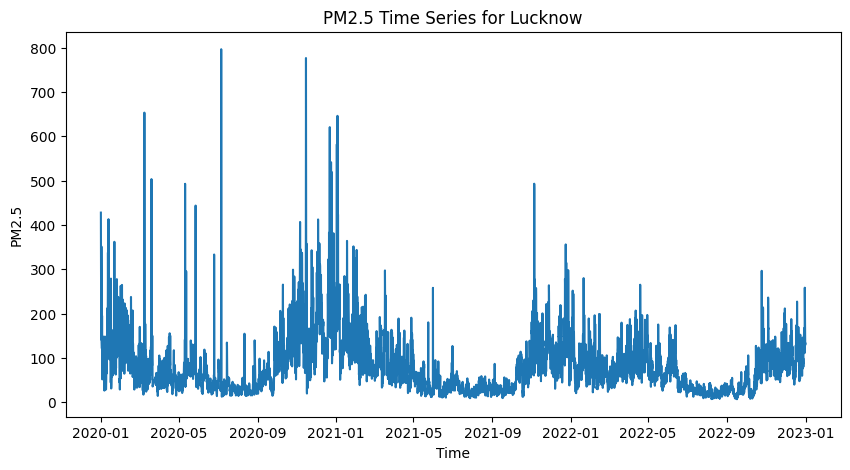

Descriptive Statistics for Lucknow:
count    6352.000000
mean       80.382903
std        64.537604
min         6.803124
25%        35.104387
50%        64.598298
75%       106.194780
max       796.391075
Name: PM2.5, dtype: float64


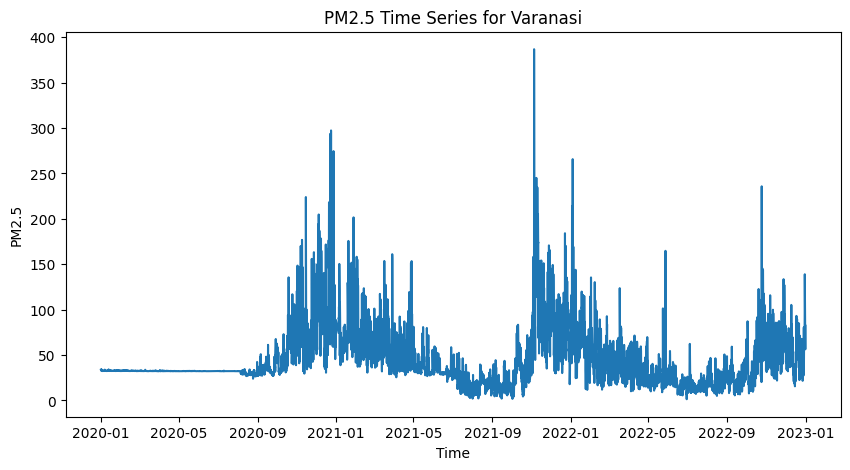

Descriptive Statistics for Varanasi:
count    6494.000000
mean       44.907032
std        31.955227
min         1.359607
25%        28.598723
50%        32.620393
75%        55.690744
max       386.844228
Name: PM2.5, dtype: float64


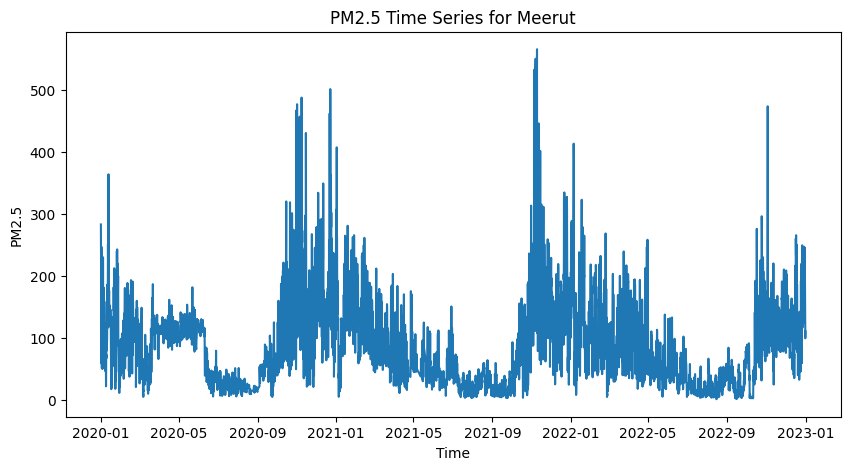

Descriptive Statistics for Meerut:
count    6273.000000
mean       89.192084
std        70.518141
min         1.104184
25%        35.130769
50%        73.594876
75%       123.267734
max       565.599240
Name: PM2.5, dtype: float64


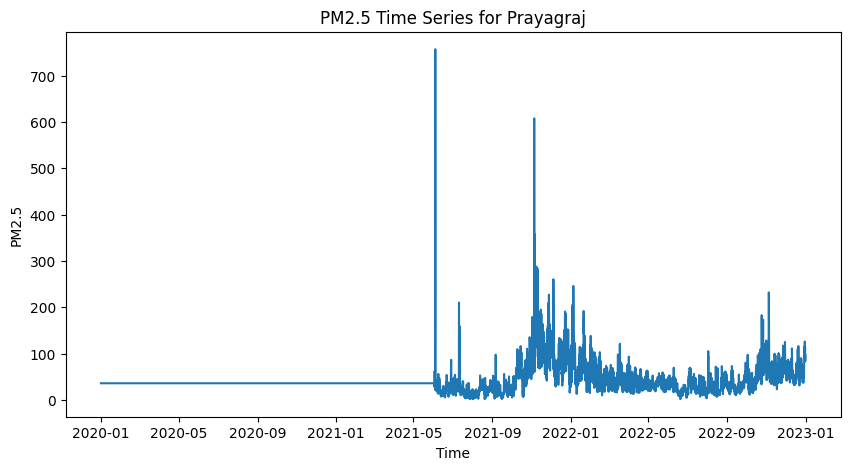

Descriptive Statistics for Prayagraj:
count    6576.000000
mean       42.982362
std        31.851070
min         1.452814
25%        35.915508
50%        35.915508
75%        40.139187
max       757.207885
Name: PM2.5, dtype: float64


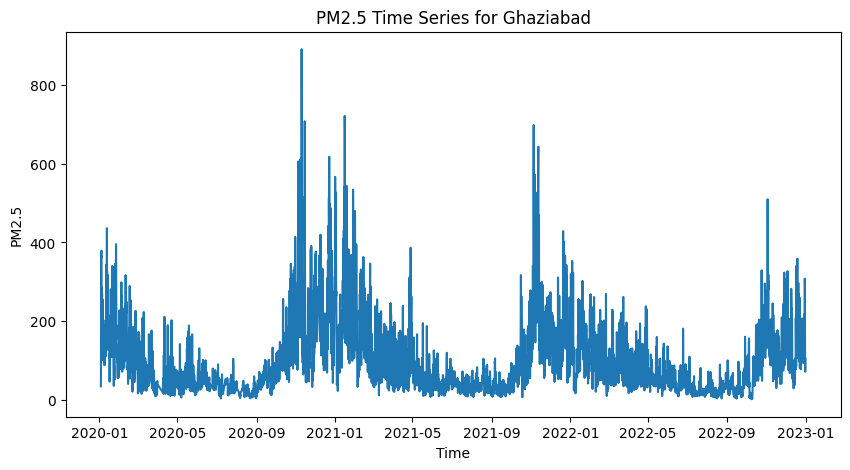

Descriptive Statistics for Ghaziabad:
count    6076.000000
mean      100.810089
std        91.992310
min         1.632668
25%        37.296578
50%        69.970131
75%       137.981944
max       890.873920
Name: PM2.5, dtype: float64


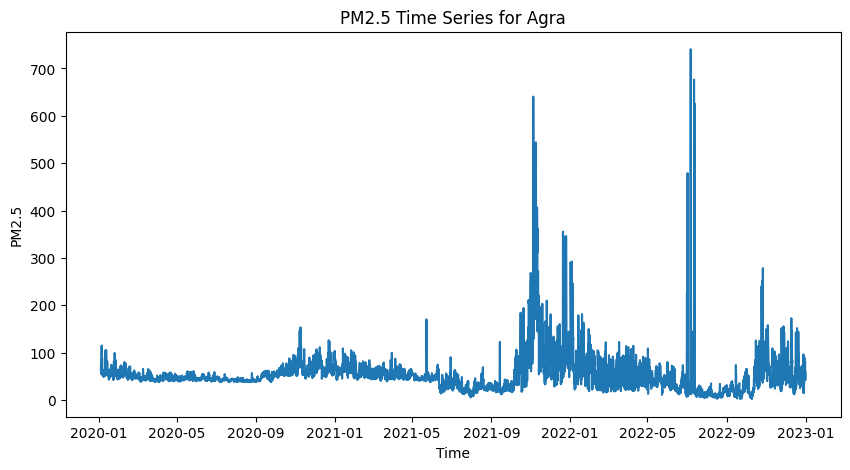

Descriptive Statistics for Agra:
count    6460.000000
mean       54.913229
std        43.278713
min         1.997156
25%        37.033110
50%        47.747245
75%        62.587774
max       740.475397
Name: PM2.5, dtype: float64


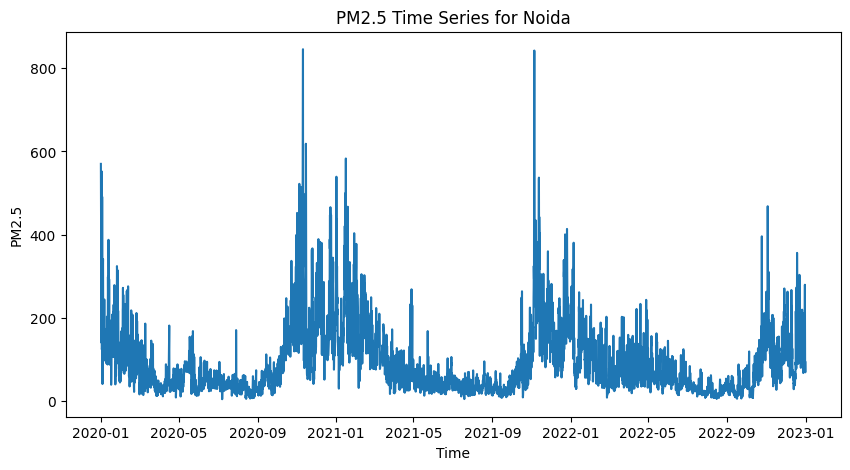

Descriptive Statistics for Noida:
count    6281.000000
mean       94.718856
std        83.013822
min         5.041650
25%        36.505739
50%        65.379540
75%       127.870331
max       845.356649
Name: PM2.5, dtype: float64


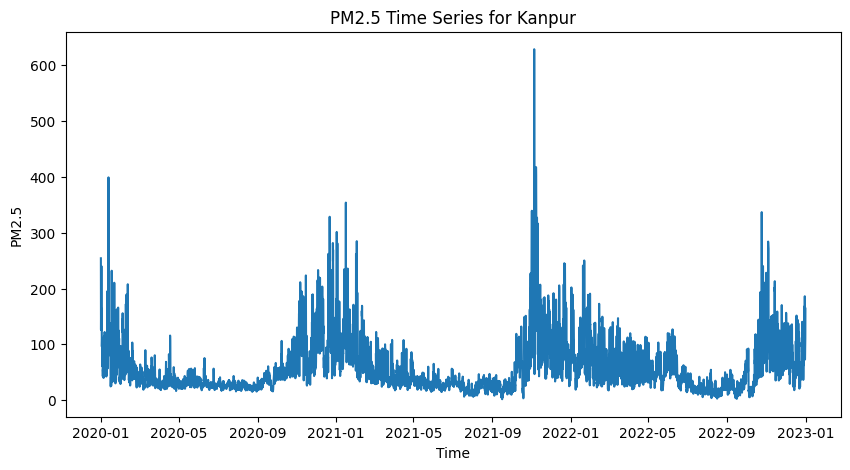

Descriptive Statistics for Kanpur:
count    6550.000000
mean       56.992883
std        44.857185
min         1.647976
25%        26.981138
50%        41.860126
75%        74.534881
max       628.765005
Name: PM2.5, dtype: float64


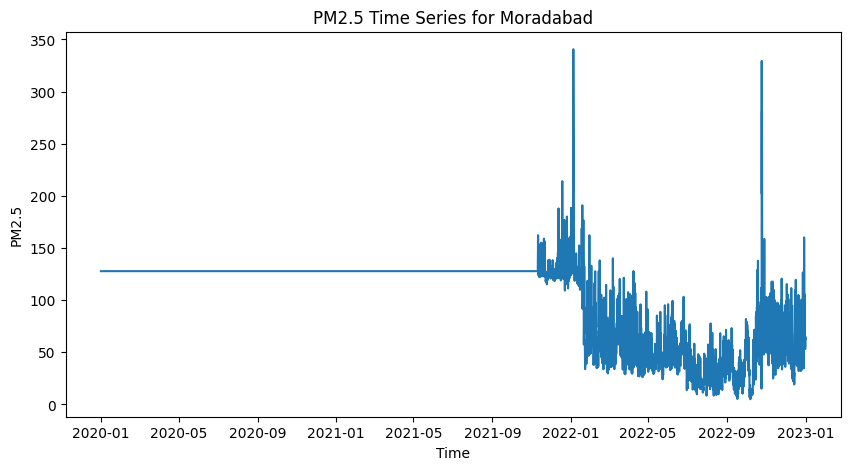

Descriptive Statistics for Moradabad:
count    6576.000000
mean      104.860328
std        38.478942
min         4.981499
25%        74.998285
50%       127.799380
75%       127.799380
max       340.618583
Name: PM2.5, dtype: float64


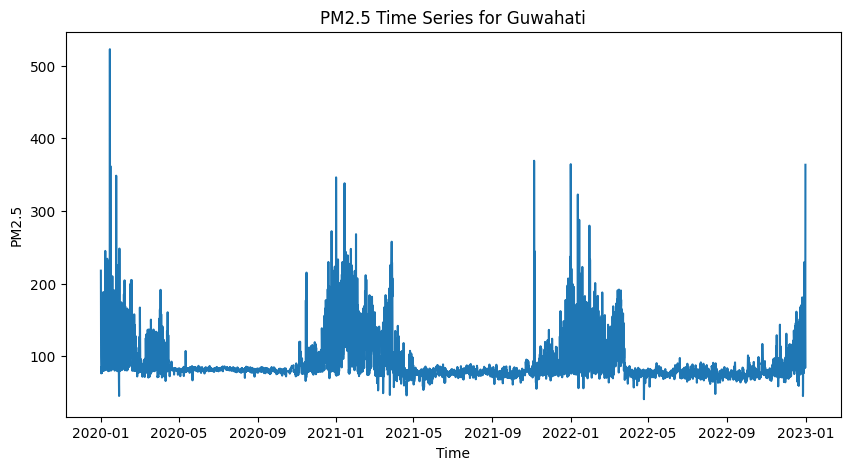

Descriptive Statistics for Guwahati:
count    6480.000000
mean       89.566093
std        28.117561
min        40.791454
25%        76.306417
50%        80.735260
75%        89.394969
max       522.403895
Name: PM2.5, dtype: float64


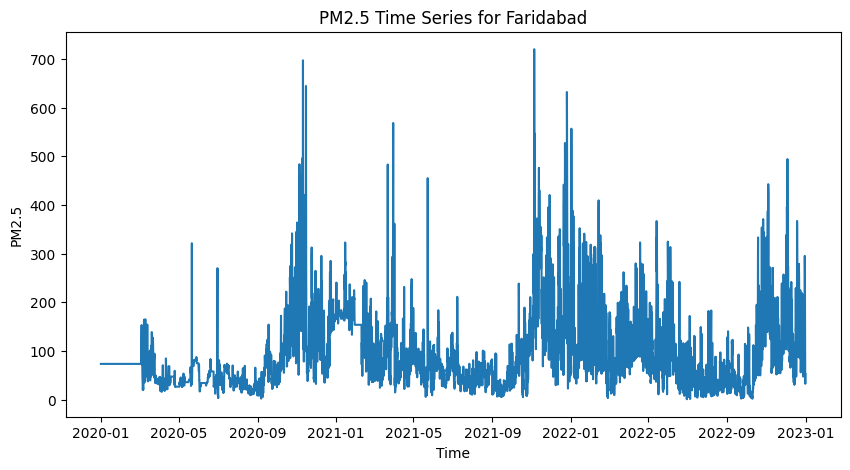

Descriptive Statistics for Faridabad:
count    6520.000000
mean       94.969349
std        76.918005
min         0.620706
25%        41.478265
50%        73.248124
75%       127.096215
max       720.328811
Name: PM2.5, dtype: float64


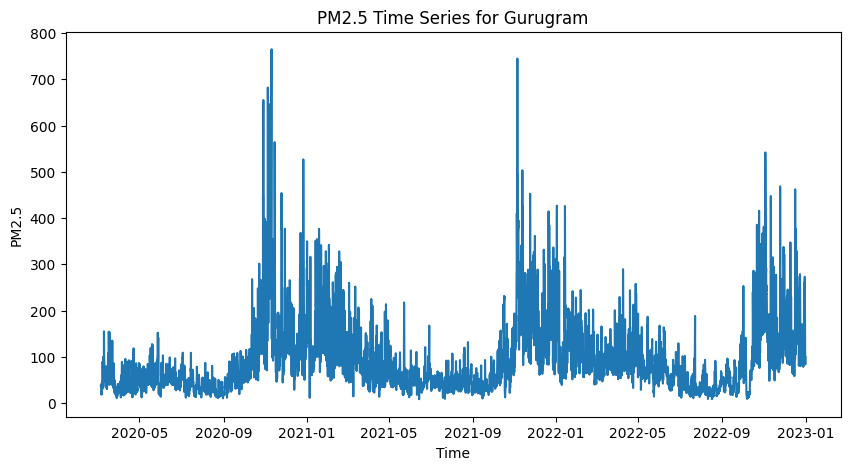

Descriptive Statistics for Gurugram:
count    6043.000000
mean       95.294532
std        77.017585
min         8.456606
25%        43.878266
50%        73.144586
75%       121.812786
max       765.048055
Name: PM2.5, dtype: float64


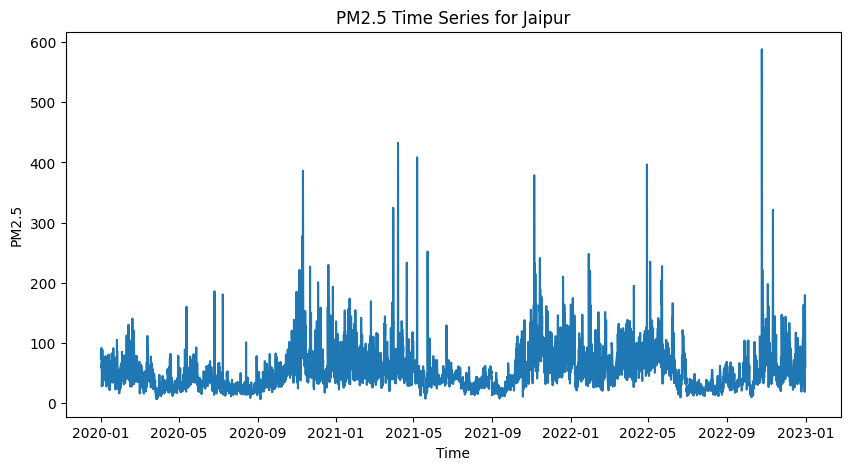

Descriptive Statistics for Jaipur:
count    5937.000000
mean       55.671256
std        35.427194
min         6.776293
25%        32.447082
50%        47.261143
75%        69.557271
max       587.995849
Name: PM2.5, dtype: float64


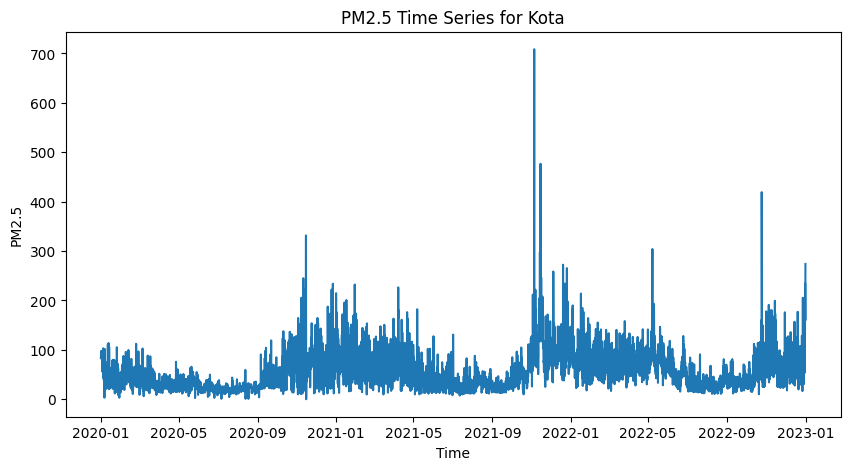

Descriptive Statistics for Kota:
count    6534.000000
mean       54.173329
std        37.848206
min         0.100000
25%        27.902500
50%        44.760000
75%        70.107500
max       708.620000
Name: PM2.5, dtype: float64


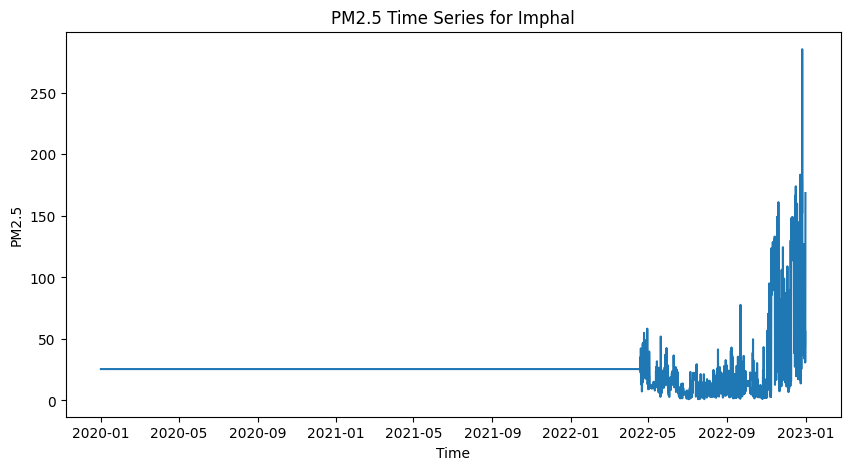

Descriptive Statistics for Imphal:
count    6576.000000
mean       25.444491
std        15.760766
min         1.019572
25%        25.516342
50%        25.516342
75%        25.516342
max       285.421167
Name: PM2.5, dtype: float64


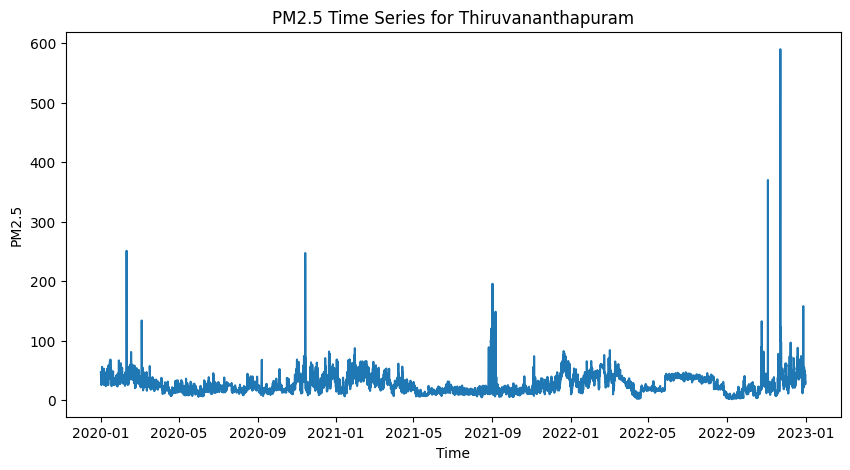

Descriptive Statistics for Thiruvananthapuram:
count    6493.000000
mean       26.583589
std        17.682892
min         1.339310
25%        15.856141
50%        22.794632
75%        35.171224
max       589.707969
Name: PM2.5, dtype: float64


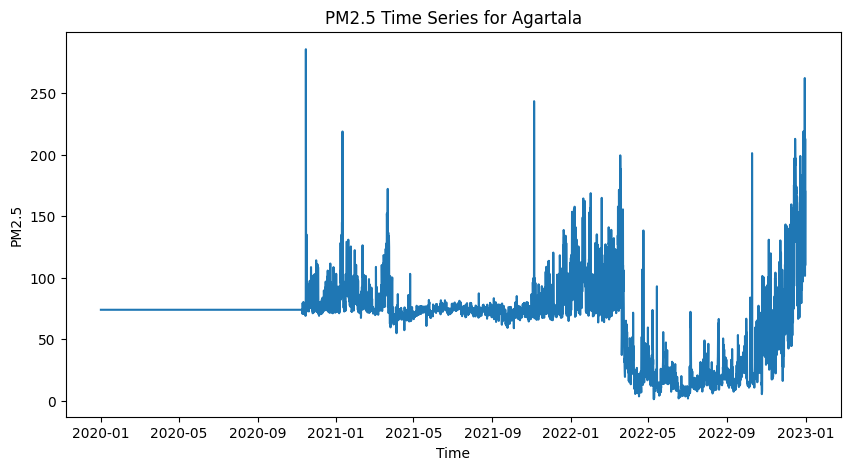

Descriptive Statistics for Agartala:
count    6576.000000
mean       68.547517
std        29.232734
min         1.276668
25%        68.450571
50%        73.946201
75%        76.158885
max       285.614324
Name: PM2.5, dtype: float64


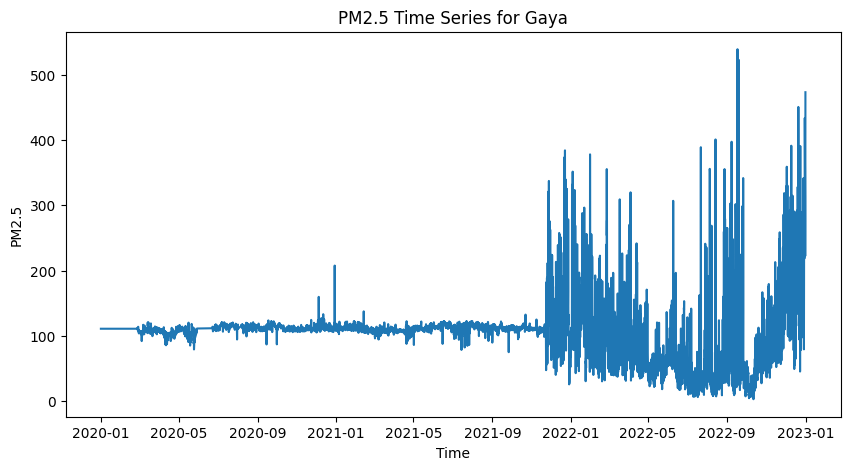

Descriptive Statistics for Gaya:
count    6353.000000
mean      105.901121
std        45.270864
min         3.226756
25%        98.484494
50%       110.718527
75%       114.862172
max       539.067977
Name: PM2.5, dtype: float64


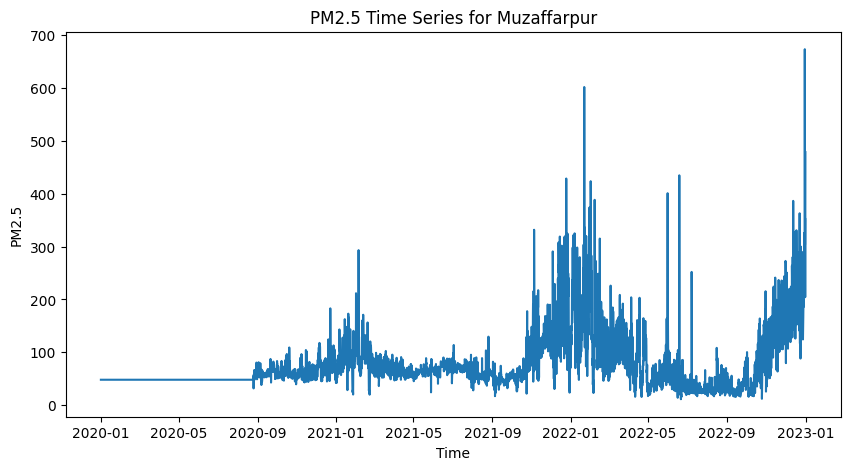

Descriptive Statistics for Muzaffarpur:
count    6545.000000
mean       77.537779
std        53.738399
min        11.167568
25%        48.035101
50%        59.289459
75%        85.905678
max       673.431348
Name: PM2.5, dtype: float64


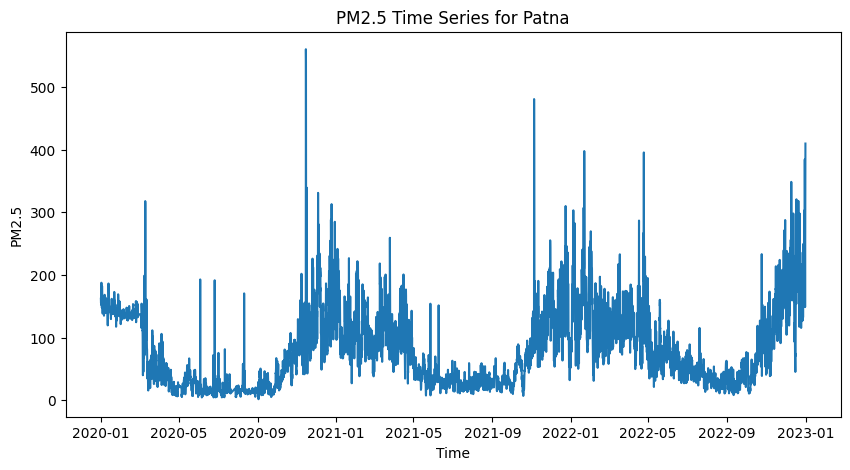

Descriptive Statistics for Patna:
count    6316.000000
mean       80.899882
std        59.857046
min         1.671872
25%        31.368337
50%        66.433665
75%       121.390829
max       560.420753
Name: PM2.5, dtype: float64


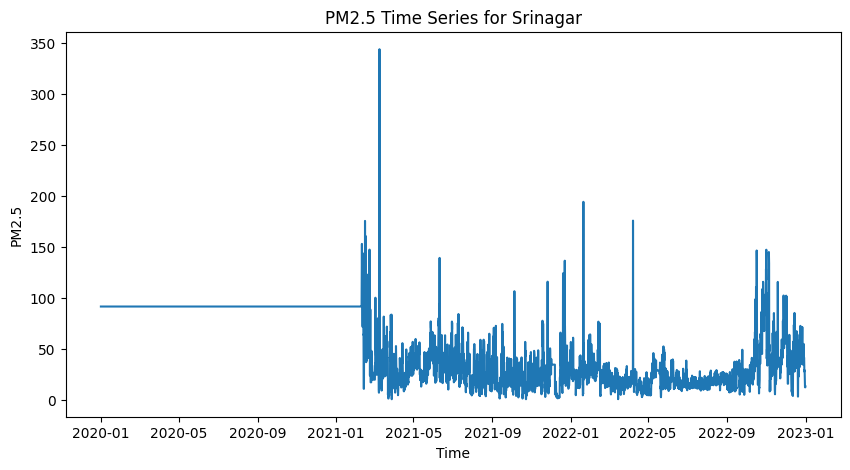

Descriptive Statistics for Srinagar:
count    6576.000000
mean       52.025332
std        34.503988
min         0.400000
25%        19.770000
50%        39.425000
75%        91.310000
max       343.650000
Name: PM2.5, dtype: float64


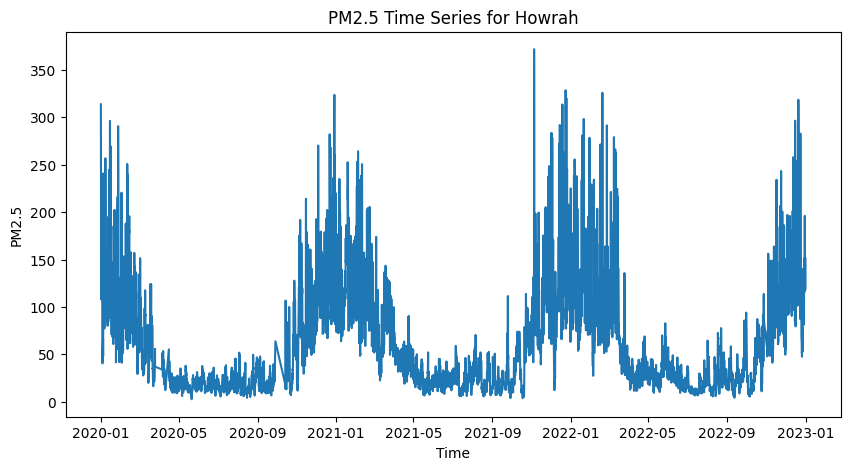

Descriptive Statistics for Howrah:
count    6043.000000
mean       62.825136
std        56.270709
min         2.666298
25%        19.776658
50%        39.986375
75%        93.775980
max       371.870542
Name: PM2.5, dtype: float64


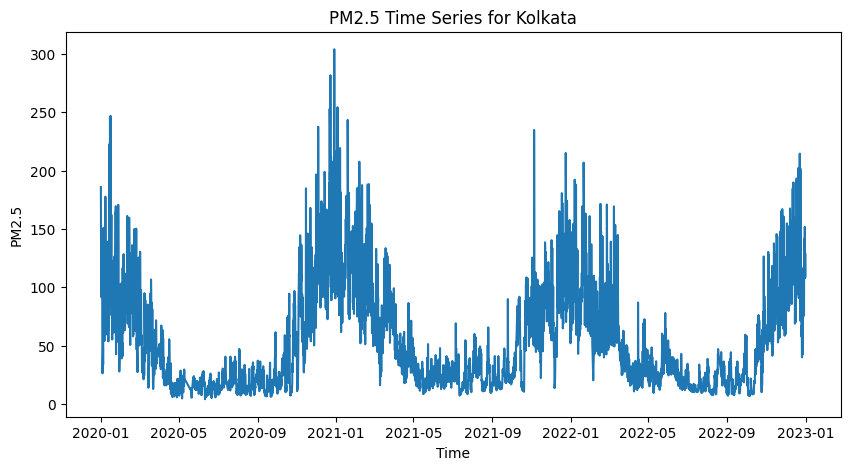

Descriptive Statistics for Kolkata:
count    6300.000000
mean       54.250265
std        44.567390
min         4.066592
25%        18.836861
50%        37.062162
75%        82.229683
max       304.091723
Name: PM2.5, dtype: float64


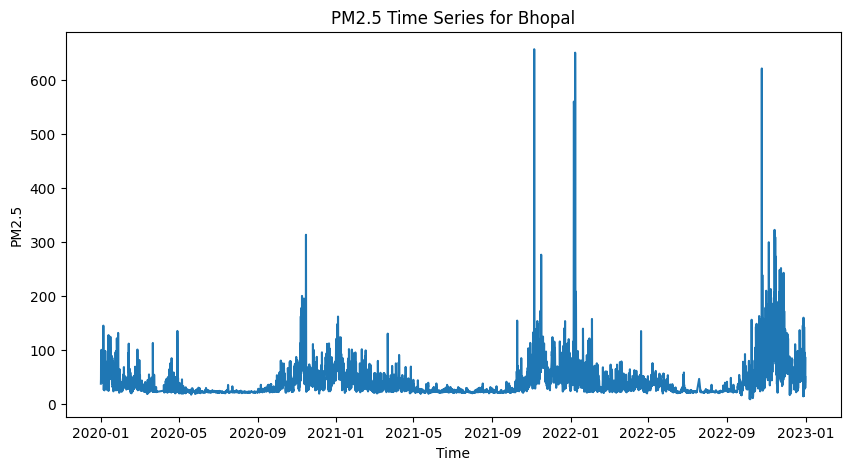

Descriptive Statistics for Bhopal:
count    6410.000000
mean       40.247970
std        33.473586
min         8.463277
25%        22.880204
50%        29.206544
75%        44.480121
max       656.360149
Name: PM2.5, dtype: float64


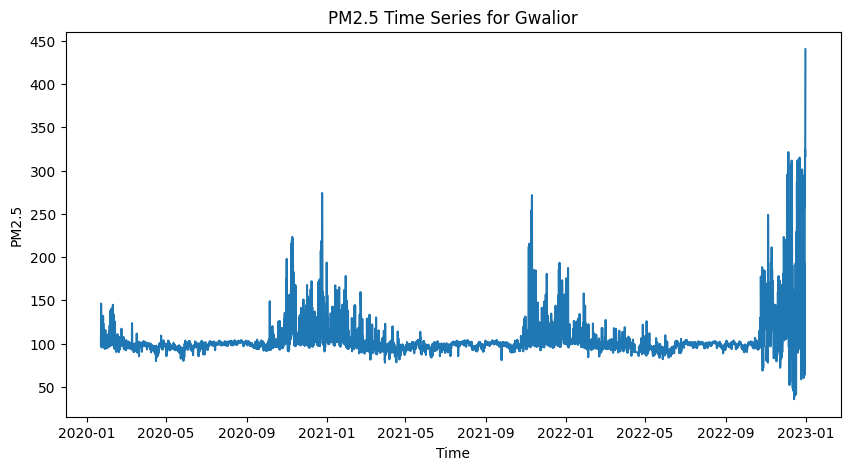

Descriptive Statistics for Gwalior:
count    6312.000000
mean      104.618723
std        22.907182
min        35.594431
25%        95.852098
50%        99.210921
75%       102.712001
max       440.291955
Name: PM2.5, dtype: float64


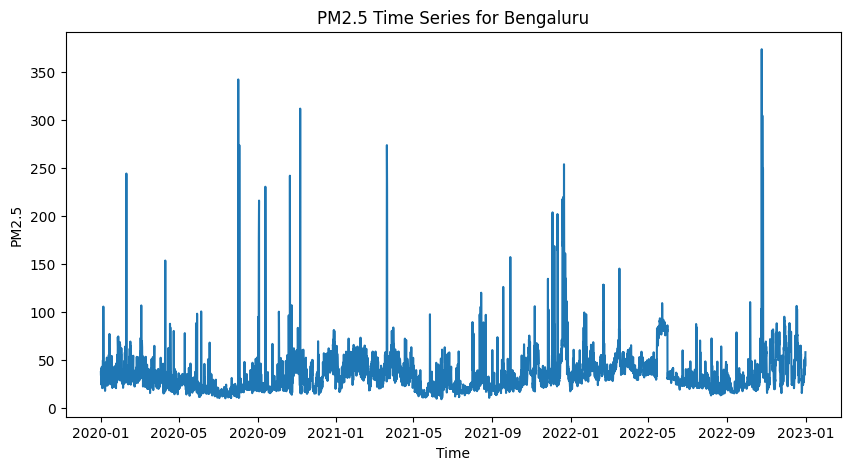

Descriptive Statistics for Bengaluru:
count    6487.000000
mean       35.577320
std        22.492235
min         9.428501
25%        22.460519
50%        30.346108
75%        42.500943
max       373.478393
Name: PM2.5, dtype: float64


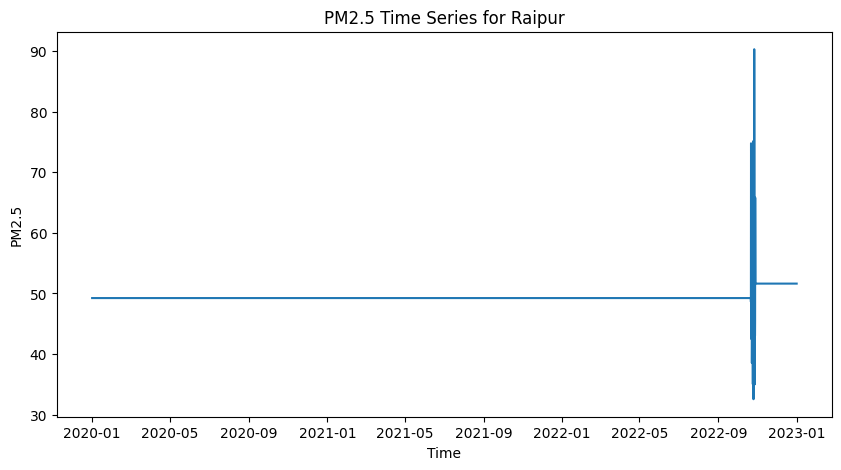

Descriptive Statistics for Raipur:
count    6576.000000
mean       49.403964
std         1.175428
min        32.546319
25%        49.243875
50%        49.243875
75%        49.243875
max        90.320124
Name: PM2.5, dtype: float64


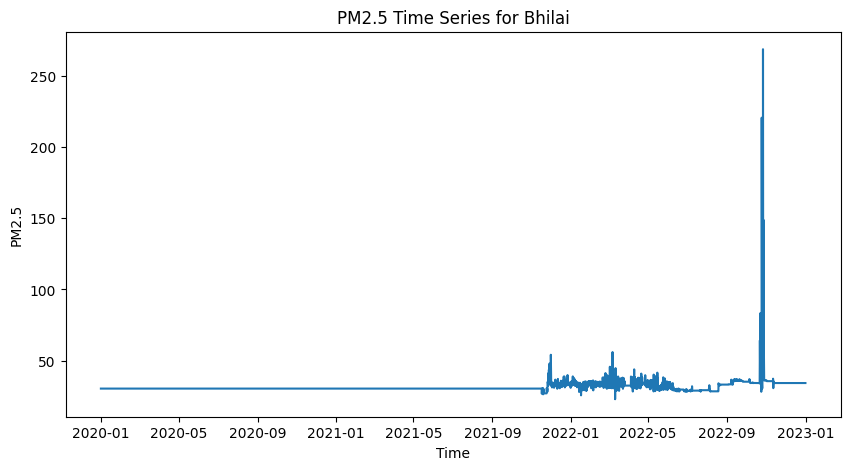

Descriptive Statistics for Bhilai:
count    6576.000000
mean       31.629150
std         6.222670
min        22.863958
25%        30.340937
50%        30.340937
75%        32.436896
max       268.854588
Name: PM2.5, dtype: float64


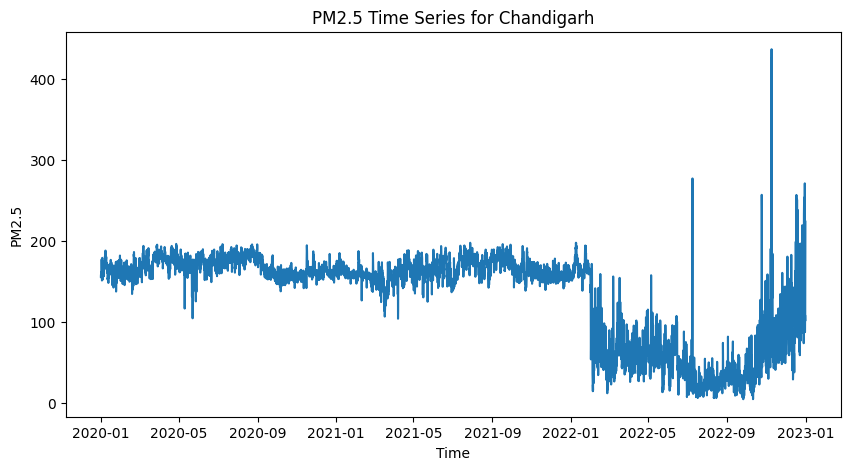

Descriptive Statistics for Chandigarh:
count    6560.000000
mean      133.247278
std        54.999253
min         4.329561
25%        83.009153
50%       158.308502
75%       170.541890
max       436.587846
Name: PM2.5, dtype: float64


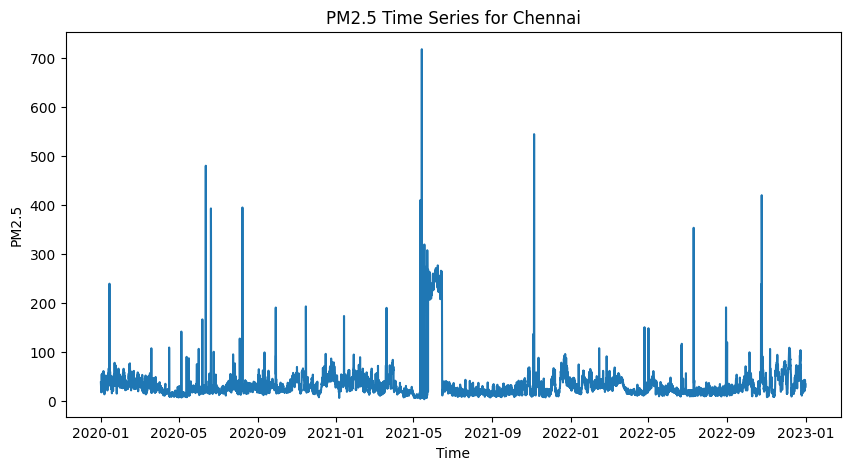

Descriptive Statistics for Chennai:
count    6465.000000
mean       34.881099
std        39.998184
min         4.003758
25%        18.198695
50%        25.535033
75%        37.173933
max       717.207122
Name: PM2.5, dtype: float64


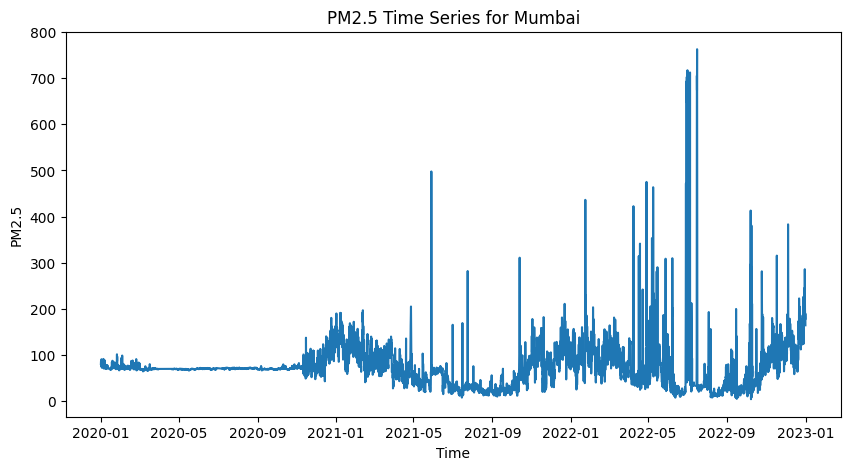

Descriptive Statistics for Mumbai:
count    6312.000000
mean       74.637034
std        55.633923
min         4.182054
25%        44.081060
50%        69.927306
75%        87.947648
max       762.628046
Name: PM2.5, dtype: float64


In [ ]:
# Get list of unique cities
cities = df['City'].unique()

# Loop over cities and plot PM2.5 time series
for city in cities:
    # Subset the data for the current city
    city_df = df[df['City'] == city]
    
    # Plot the PM2.5 time series for the city
    plt.figure(figsize=(10, 5))
    plt.plot(city_df['PM2.5'])
    plt.title(f'PM2.5 Time Series for {city}')
    plt.xlabel('Time')
    plt.ylabel('PM2.5')
    plt.show()
    
    # Calculate descriptive statistics for PM2.5 in the city
    print(f'Descriptive Statistics for {city}:')
    print(city_df['PM2.5'].describe())

### plotting pie chart to see how the total data is distributed among different cities

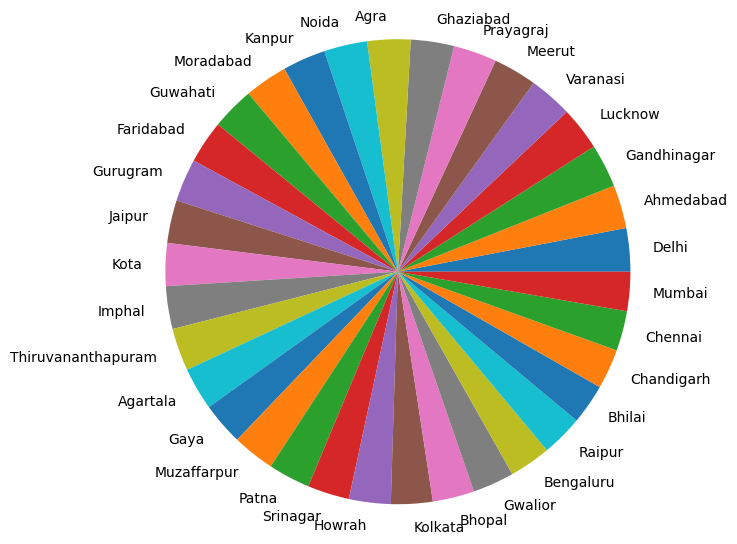

In [ ]:
no_of_data_per_city=df['City'].value_counts()
plt.pie(no_of_data_per_city,labels=cities,radius=1.5)
plt.show()

#Feature Engineering & Feature Selection

### Dropping columns which are not neccessary

In [ ]:
cols_to_drop =['State','Population as of 2021 (Estimated)', 'Latitude', 'Longitude',
       'Total Length of Roads as of 2019(Km)',
       'Length of National Highways as of 2022(Km)',
       'Railway Route as of 2021(Km)', 'Forest Cover as of 2021(sq Km)','Death Rate as of 2020(Per 1000)']
df.drop(columns = cols_to_drop,axis =1,inplace =True) 

In [ ]:
df.columns

Index(['PM2.5', 'NO', 'NO2', 'NOx', 'NH3', 'SO2', 'CO', 'Ozone', 'Benzene',
       'Toluene', 'RH', 'WS', 'WD', 'SR', 'BP', 'AT', 'RF', 'TOT-RF',
       'Eth-Benzene', 'Xylene', 'MP-Xylene', 'O Xylene', 'City',
       'Number of Factories as of 2020 (Units)',
       'Installed Capacity of Power as of 2022(Megawatt)', 'CNG ONLY',
       'DIESEL', 'DIESEL/HYBRID', 'ELECTRIC(BOV)', 'PETROL', 'PETROL/CNG',
       'PETROL/HYBRID'],
      dtype='object')

###Finding the correlation of other features with PM2.5

In [ ]:
df.corr()

<ipython-input-59-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,PM2.5,NO,NO2,NOx,NH3,SO2,CO,Ozone,Benzene,Toluene,RH,WS,WD,SR,BP,AT,RF,TOT-RF,Eth-Benzene,Xylene,MP-Xylene,O Xylene,Number of Factories as of 2020 (Units),Installed Capacity of Power as of 2022(Megawatt),DIESEL,DIESEL/HYBRID,ELECTRIC(BOV),PETROL,PETROL/CNG,PETROL/HYBRID
PM2.5,1.000000,0.399749,0.409296,0.425186,0.296991,0.104115,0.496589,-0.029884,0.157629,0.196376,0.034857,-0.163044,0.028572,-0.134424,0.017019,-0.477065,0.078070,-0.059319,0.010467,0.100847,0.015211,-0.072066,-0.102777,-0.098925,-0.004554,-0.068556,0.007839,0.008444,0.070746,-0.046439
NO,0.399749,1.000000,0.606729,0.849465,0.342640,0.097540,0.549358,-0.200647,0.177206,0.189456,0.038817,-0.171889,0.002049,-0.170004,0.080966,-0.212477,-0.022884,-0.018359,0.011511,0.073333,-0.004049,0.115689,-0.050833,-0.057161,-0.032987,-0.049206,0.028657,-0.019726,0.057902,0.035398
NO2,0.409296,0.606729,1.000000,0.830763,0.337997,0.191820,0.713127,-0.065945,0.097722,0.259781,-0.066980,-0.210538,-0.001892,-0.218948,0.017326,-0.194850,-0.098964,-0.035084,0.026341,0.027575,-0.032096,0.069592,-0.165876,-0.097250,-0.031080,-0.092148,0.029847,-0.001061,-0.025186,-0.057409
NOx,0.425186,0.849465,0.830763,1.000000,0.355288,0.177642,0.693586,-0.175839,0.199626,0.233983,-0.005152,-0.204763,0.022593,-0.229445,0.097808,-0.228478,-0.077091,-0.031508,0.027338,0.048378,-0.013417,0.107612,-0.092858,-0.058821,-0.034267,-0.054219,0.014027,-0.024205,-0.005016,-0.017366
NH3,0.296991,0.342640,0.337997,0.355288,1.000000,0.014753,0.182509,-0.064381,0.179644,0.030172,-0.023453,-0.090727,0.073176,-0.059910,-0.027829,-0.135352,-0.048172,-0.026584,0.181632,0.081126,0.208093,0.136007,0.032465,0.099322,0.176622,0.081326,0.125695,0.158316,0.195839,0.124977
SO2,0.104115,0.097540,0.191820,0.177642,0.014753,1.000000,0.139998,-0.020677,-0.006303,-0.012707,-0.133506,-0.081563,-0.026962,-0.150788,-0.070868,-0.136959,0.002346,-0.032223,0.016203,0.000761,-0.020157,-0.016129,-0.252796,-0.278357,-0.242868,-0.202372,-0.000398,-0.198267,-0.115817,-0.170022
CO,0.496589,0.549358,0.713127,0.693586,0.182509,0.139998,1.000000,-0.103306,0.110422,0.307239,0.047883,-0.196245,0.013289,-0.212665,0.006424,-0.263021,0.012977,-0.036571,0.038286,0.104337,-0.037661,-0.015127,-0.067682,-0.065467,0.002030,-0.080436,0.016969,0.007389,0.012734,-0.053391
Ozone,-0.029884,-0.200647,-0.065945,-0.175839,-0.064381,-0.020677,-0.103306,1.000000,-0.114840,0.171939,-0.406881,0.156937,0.045751,0.317956,-0.005386,0.293882,0.162596,-0.012138,-0.115366,-0.062816,-0.067654,-0.218220,-0.069855,0.073109,0.093801,0.018053,-0.007830,0.067579,-0.034257,-0.096300
Benzene,0.157629,0.177206,0.097722,0.199626,0.179644,-0.006303,0.110422,-0.114840,1.000000,0.107559,-0.021082,-0.065185,-0.010548,-0.033908,0.191009,-0.046216,-0.059497,-0.026773,0.350371,0.126621,0.324243,0.096363,0.004694,-0.011405,0.039770,0.063849,-0.046524,0.069774,0.036218,-0.026424
Toluene,0.196376,0.189456,0.259781,0.233983,0.030172,-0.012707,0.307239,0.171939,0.107559,1.000000,-0.107841,-0.146368,0.008435,-0.035493,-0.084904,-0.097290,-0.029058,-0.036224,-0.013183,0.100808,-0.025430,-0.089723,-0.120440,0.050878,0.035472,-0.065612,-0.146942,-0.041317,-0.008988,-0.203327


###Dropping the columns that had no correlation with PM2.5 

In [ ]:
cols_with_no_correlation =['DIESEL/HYBRID', 'BP','Eth-Benzene','MP-Xylene','O Xylene','RF','TOT-RF','WD','RH','Ozone','DIESEL','CNG ONLY','ELECTRIC(BOV)','PETROL','PETROL/CNG','PETROL/HYBRID','Number of Factories as of 2020 (Units)','Installed Capacity of Power as of 2022(Megawatt)']
df.drop(columns = cols_with_no_correlation,axis =1,inplace =True) 
df.shape

(218043, 14)

###Creation of new features

In [ ]:
#Clubbing all the given oxide of nitrogen i.e NO, NO2 AND NOx
df['Nitric']=df['NO'] + df['NO2']+ df['NOx']

#clubbing Benzene, toluene and Xylene together
df['BTX']=df['Benzene'] + df['Toluene']+ df['Xylene']
df.drop(columns=['NO','NO2','NOx','Benzene','Toluene','Xylene','SR','WS'],inplace =True)

###final modified dataframe

In [ ]:
df

,PM2.5,NH3,SO2,CO,AT,City,Nitric,BTX
Time Periods,,,,,,,,
2020-01-01 04:00:00,435.438303,66.258913,11.615925,3.464807,5.987430,Delhi,477.390603,20.196760
2020-01-01 08:00:00,453.312378,74.356791,10.590183,2.460498,11.305717,Delhi,388.155396,19.455307
2020-01-01 12:00:00,186.603123,20.911157,12.217971,1.405930,15.574849,Delhi,262.568825,109.969094
2020-01-01 16:00:00,262.616309,20.911157,13.331616,2.692100,12.529418,Delhi,318.219185,103.933164
2020-01-01 20:00:00,725.493847,20.911157,20.836571,3.120651,9.500768,Delhi,46.875080,185.637104
...,...,...,...,...,...,...,...,...
2022-12-31 04:00:00,196.989121,109.511292,53.108086,2.336561,24.010449,Mumbai,254.059556,13.283238
2022-12-31 08:00:00,187.428487,106.682026,55.535340,2.235001,24.837833,Mumbai,253.117814,11.858702
2022-12-31 12:00:00,176.635690,110.258415,53.701056,1.754315,25.452565,Mumbai,195.759695,11.917306


In [ ]:
df.corr()

<ipython-input-63-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,PM2.5,NH3,SO2,CO,AT,Nitric,BTX
PM2.5,1.000000,0.296991,0.104115,0.496589,-0.477065,0.447873,0.230146
NH3,0.296991,1.000000,0.014753,0.182509,-0.135352,0.375043,0.099180
SO2,0.104115,0.014753,1.000000,0.139998,-0.136959,0.176009,-0.010416
CO,0.496589,0.182509,0.139998,1.000000,-0.263021,0.720079,0.306225
AT,-0.477065,-0.135352,-0.136959,-0.263021,1.000000,-0.229901,-0.077258
Nitric,0.447873,0.375043,0.176009,0.720079,-0.229901,1.000000,0.248832
BTX,0.230146,0.099180,-0.010416,0.306225,-0.077258,0.248832,1.000000


#Model Building and training


### Model codes:-

#### PM2.5(t-1)	NH3(t-1)	SO2(t-1)	CO(t-1)	AT(t-1)	Nitric(t-1)	BTX(t-1) PM2.5(t)

In [ ]:

def series_to_supervised(data, n_in = 1, n_out = 1, dropnan = True):
    n_vars = 1 if type(data) is list else data.shape[1]
    
    df = pd.DataFrame(data)
    cols, names = list(), list()
    
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
        cols.append(df.shift(i))
        names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
        
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df.shift(-i))
        if i == 0:
            names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
        else:
            names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
            
    # put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
        
    return agg


In [ ]:
# Creating a dataframe to store the predicted values
df1=pd.DataFrame()

In [ ]:
Cities = ['Delhi', 'Ahmedabad', 'Gandhinagar', 'Lucknow', 'Varanasi',
       'Meerut', 'Prayagraj', 'Ghaziabad', 'Agra', 'Noida', 'Kanpur',
       'Moradabad', 'Guwahati', 'Faridabad', 'Gurugram', 'Jaipur', 'Kota',
       'Imphal', 'Thiruvananthapuram', 'Agartala', 'Gaya', 'Muzaffarpur',
       'Patna', 'Srinagar', 'Howrah', 'Kolkata', 'Bhopal', 'Gwalior',
       'Bengaluru', 'Raipur', 'Bhilai', 'Chandigarh', 'Chennai', 'Mumbai']

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_15 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_15 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_45 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_45 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_46 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_46 (Dropout)        (None, 5, 64)             0         
                                                     

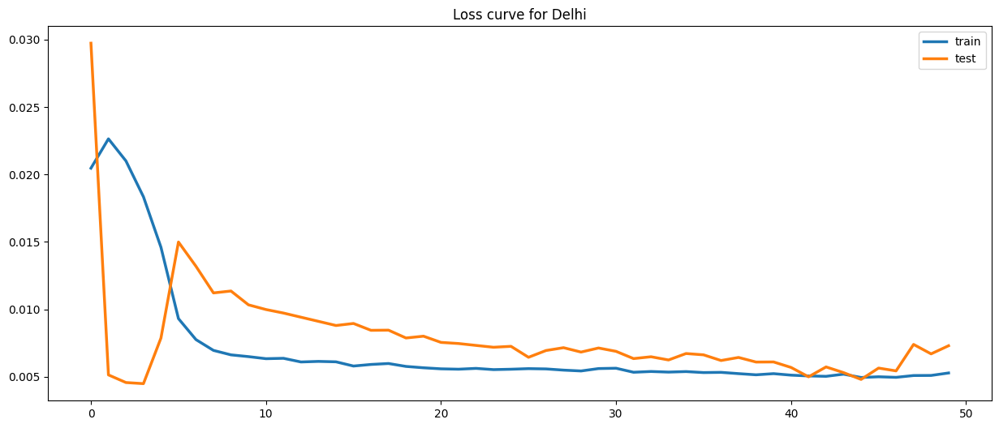

103/103 [==============================] - 2s 7ms/step
(3290, 1)
(3290,)


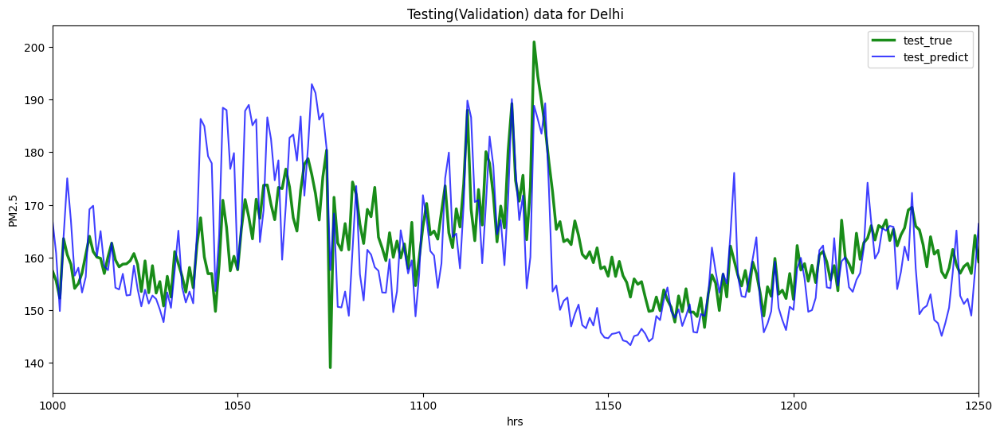

203/203 [==============================] - 1s 7ms/step


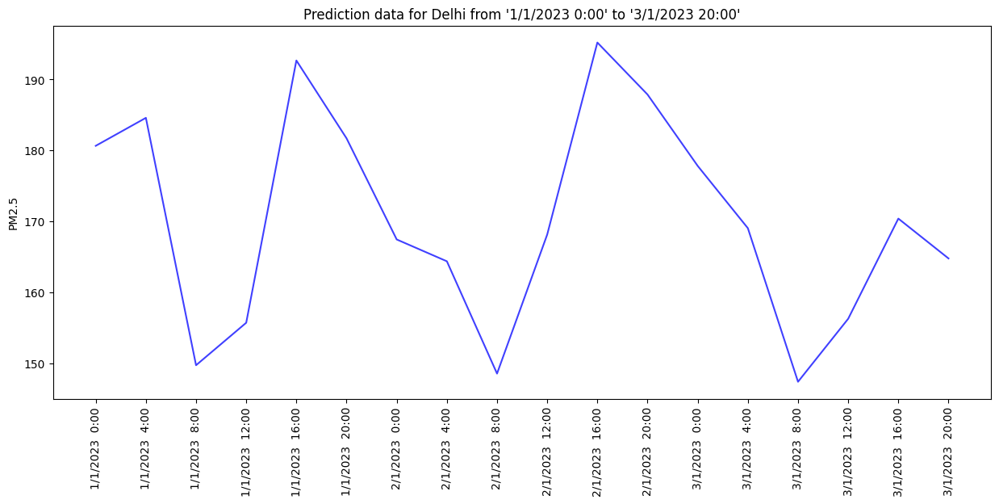

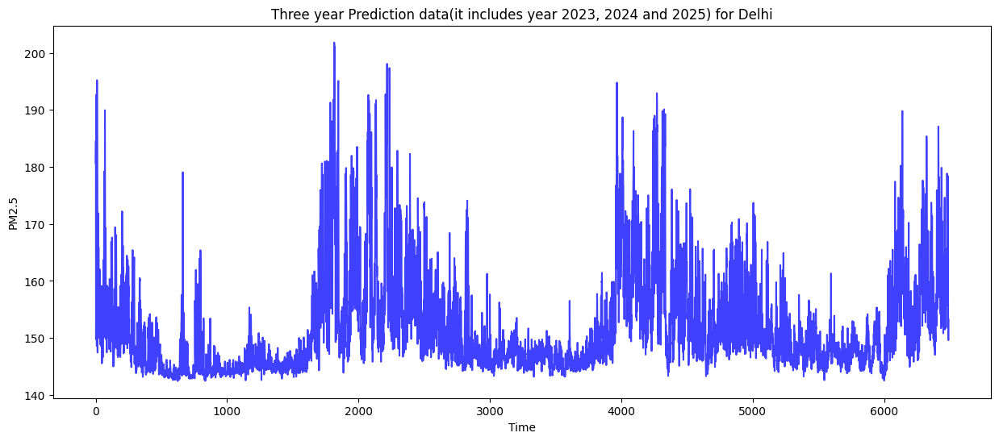

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_16 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_16 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_48 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_48 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_49 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_49 (Dropout)        (None, 5, 64)             0         
                                                     

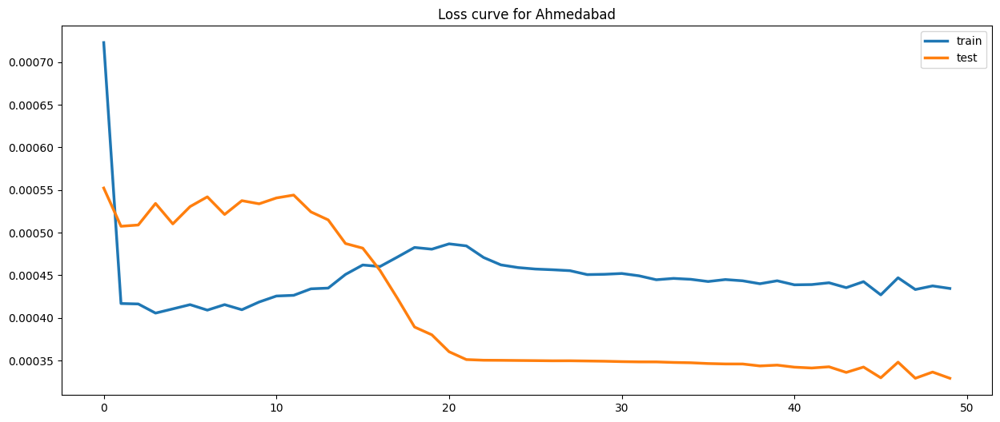

103/103 [==============================] - 2s 8ms/step
(3283, 1)
(3283,)


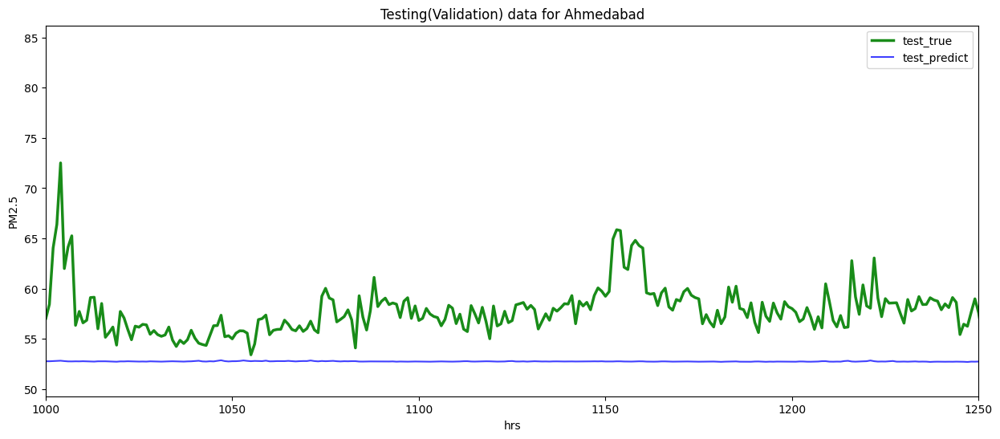

203/203 [==============================] - 2s 10ms/step


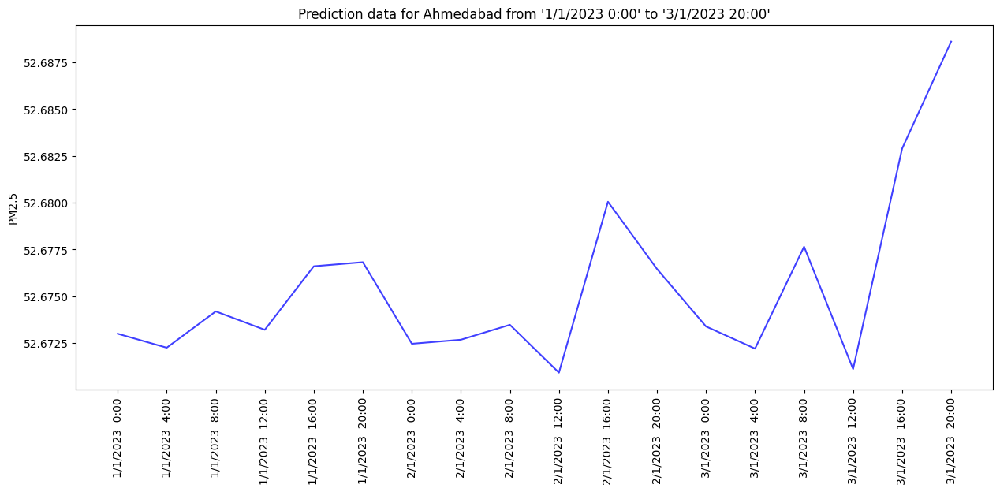

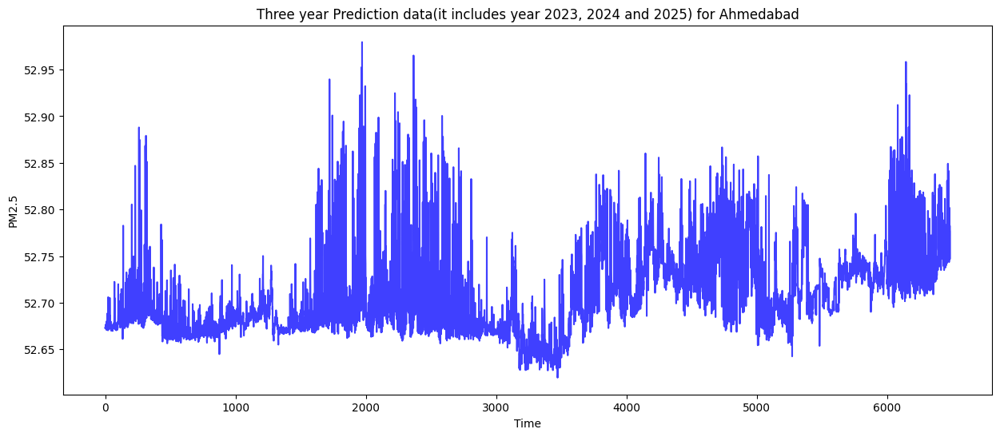

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_17 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_17 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_51 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_51 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_52 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_52 (Dropout)        (None, 5, 64)             0         
                                                     

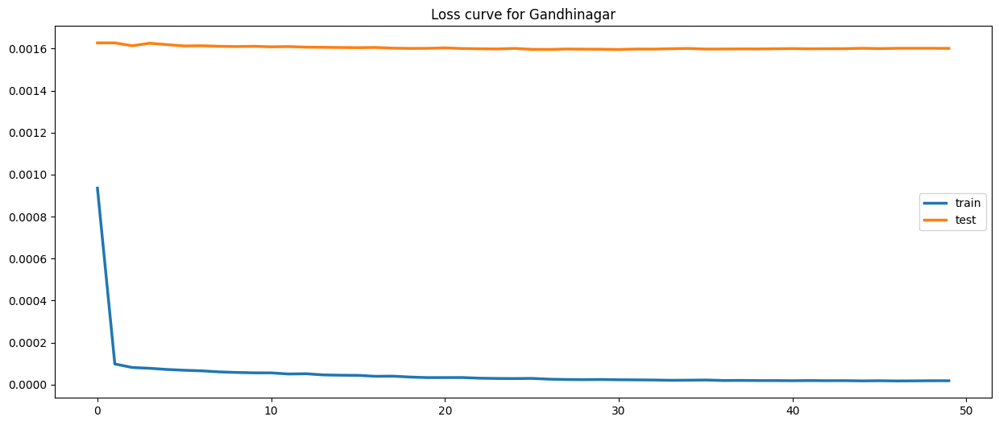

102/102 [==============================] - 2s 8ms/step
(3239, 1)
(3239,)


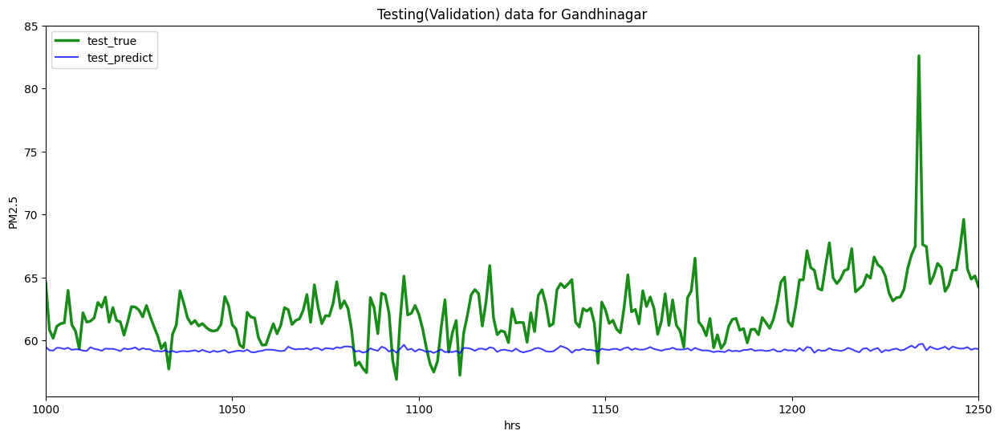

202/202 [==============================] - 2s 8ms/step


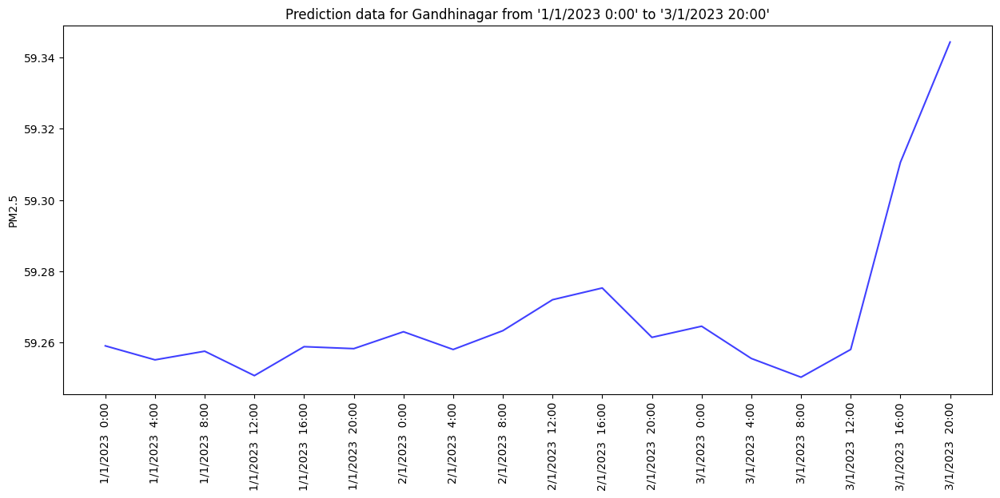

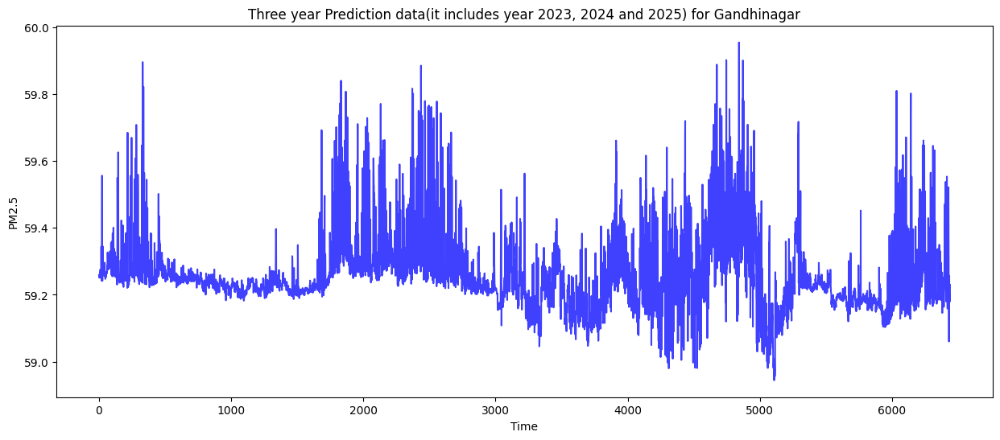

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_18 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_18 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_54 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_54 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_55 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_55 (Dropout)        (None, 5, 64)             0         
                                                     

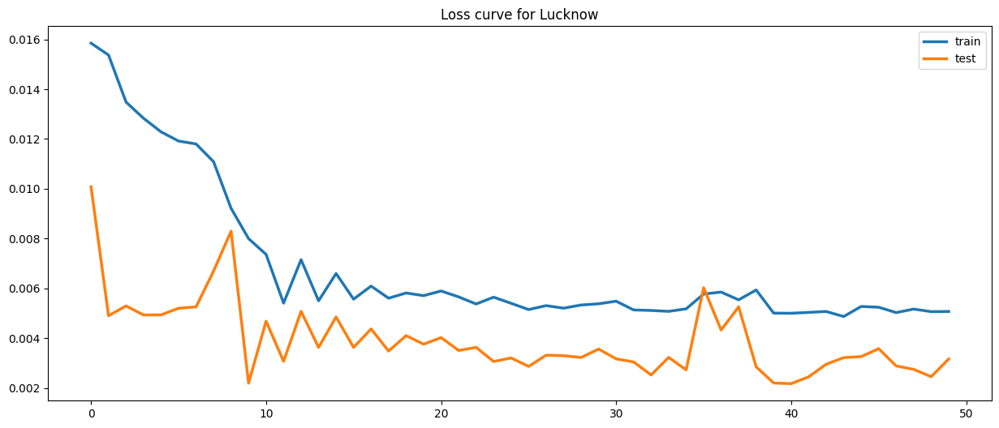

99/99 [==============================] - 2s 7ms/step
(3151, 1)
(3151,)


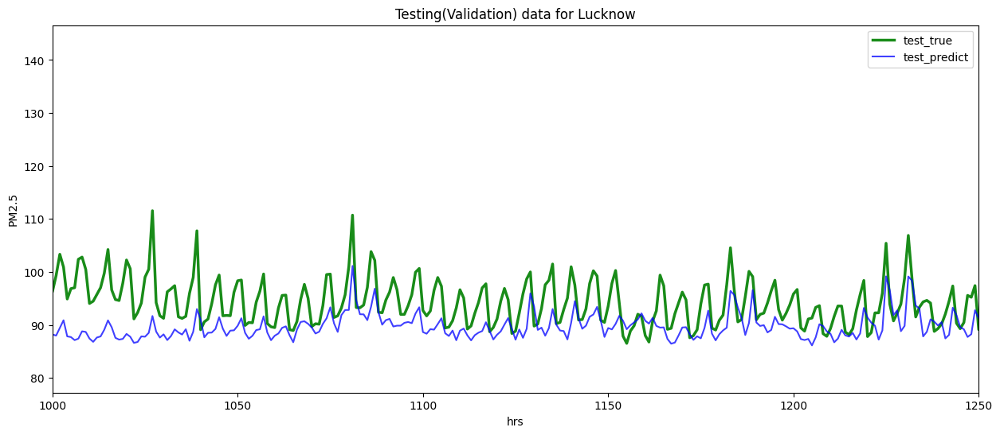

199/199 [==============================] - 2s 8ms/step


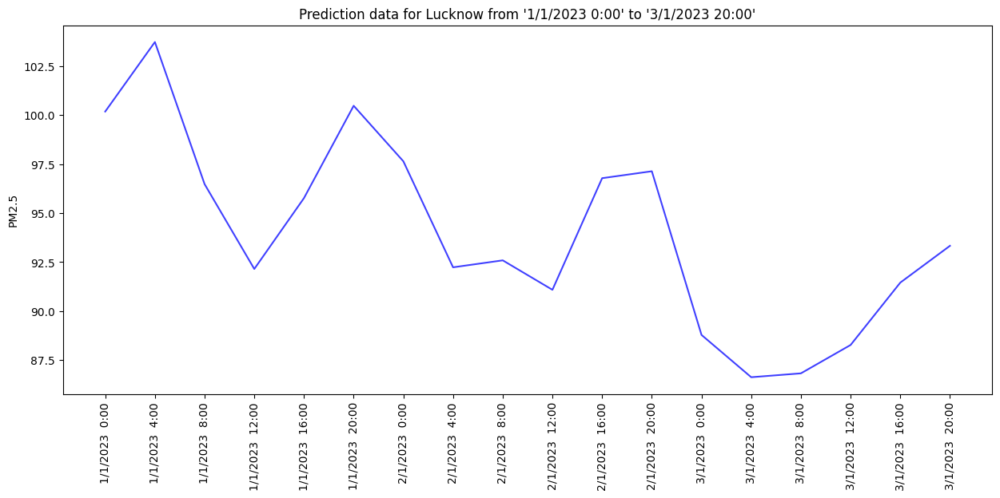

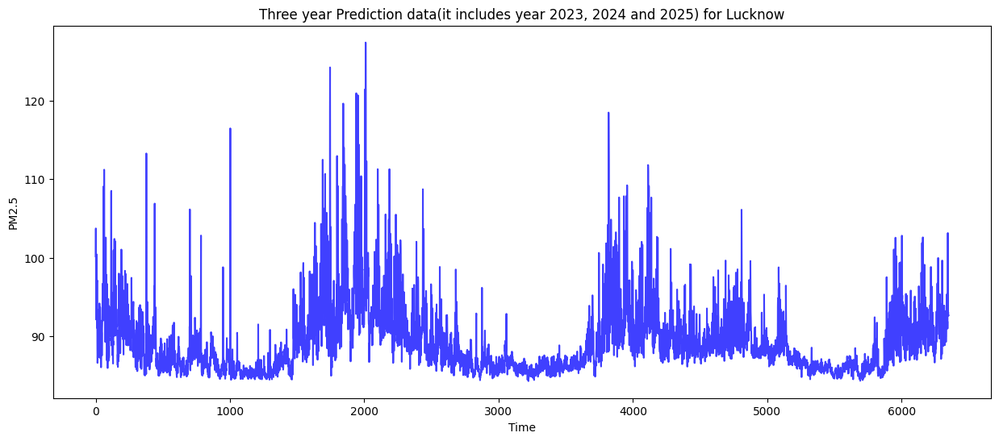

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_19 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_19 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_57 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_57 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_58 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_58 (Dropout)        (None, 5, 64)             0         
                                                     

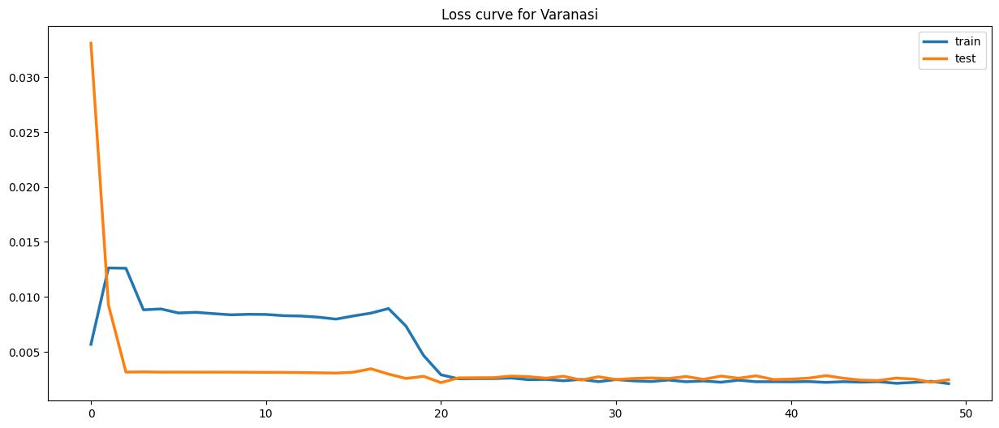

103/103 [==============================] - 2s 8ms/step
(3293, 1)
(3293,)


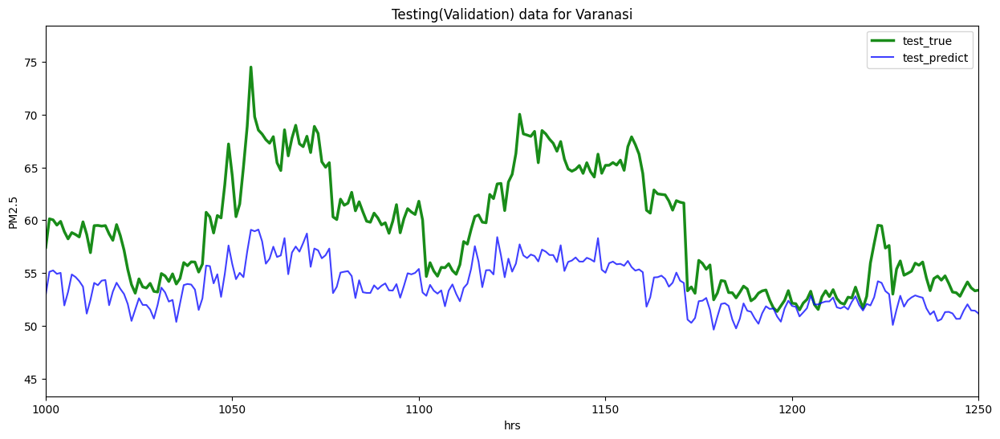

203/203 [==============================] - 2s 9ms/step


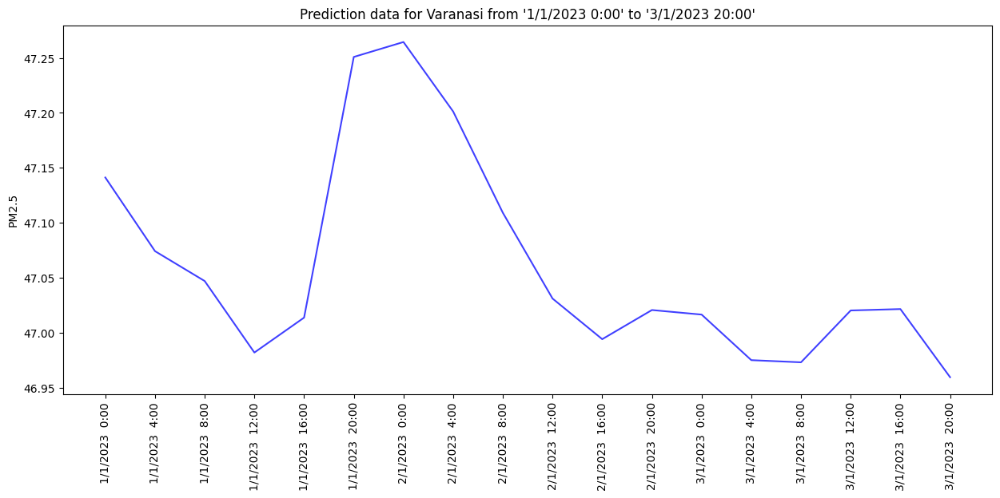

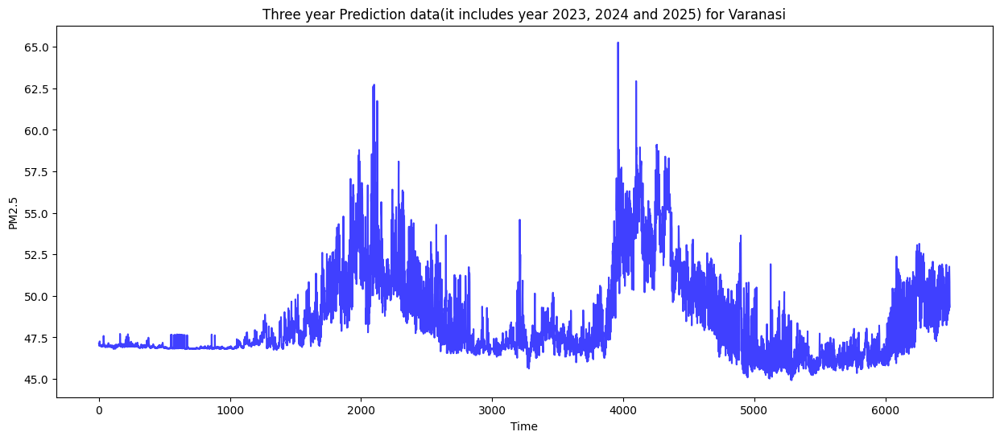

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_20 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_20 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_60 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_60 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_61 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_61 (Dropout)        (None, 5, 64)             0         
                                                     

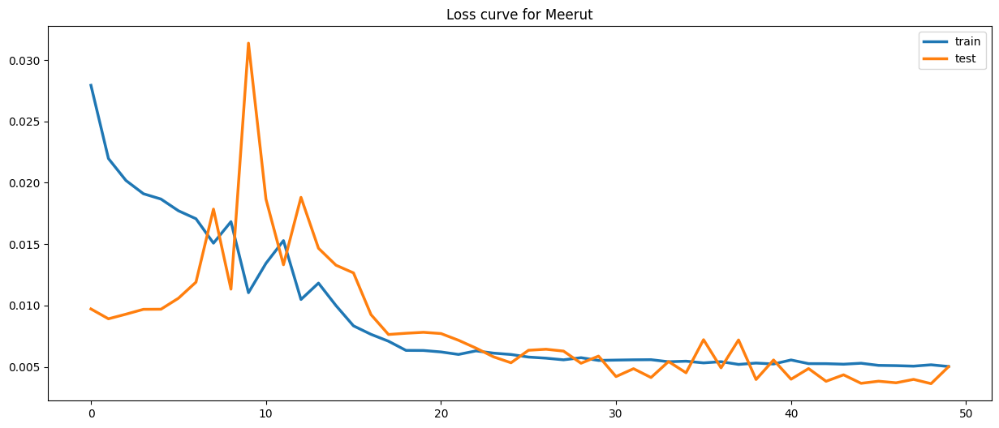

96/96 [==============================] - 2s 8ms/step
(3072, 1)
(3072,)


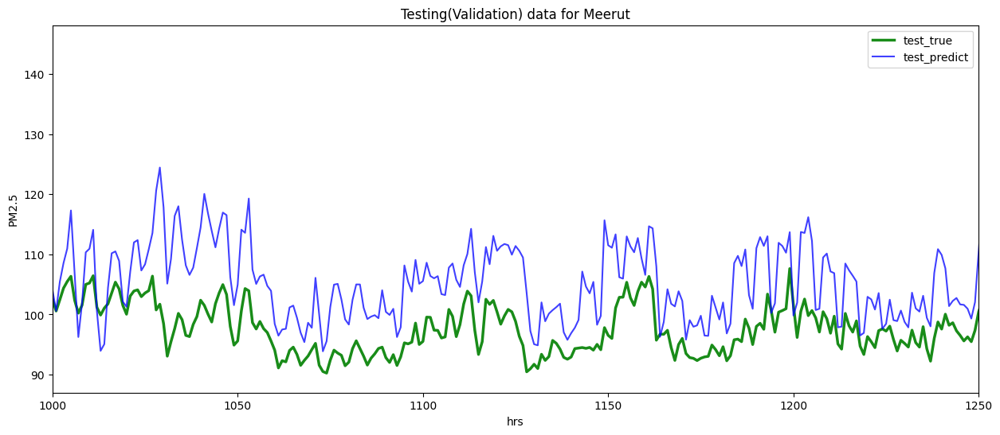

196/196 [==============================] - 2s 9ms/step


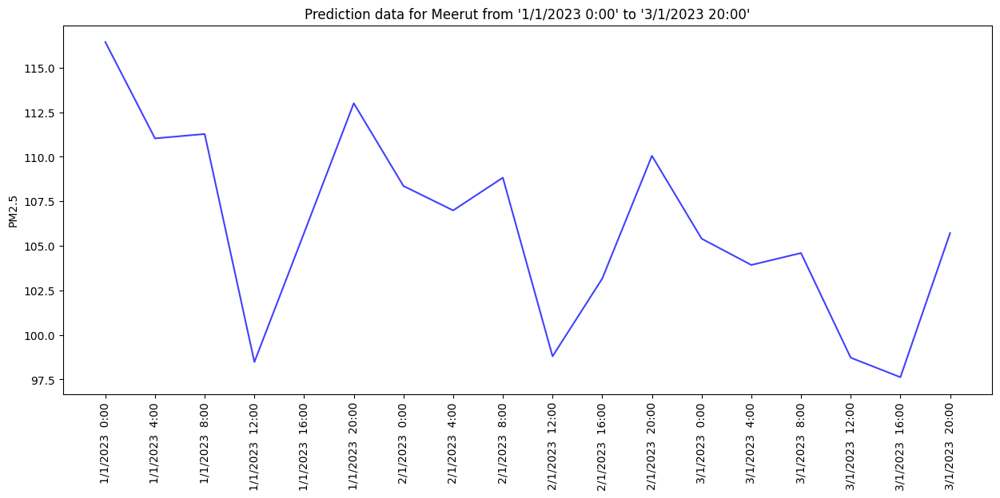

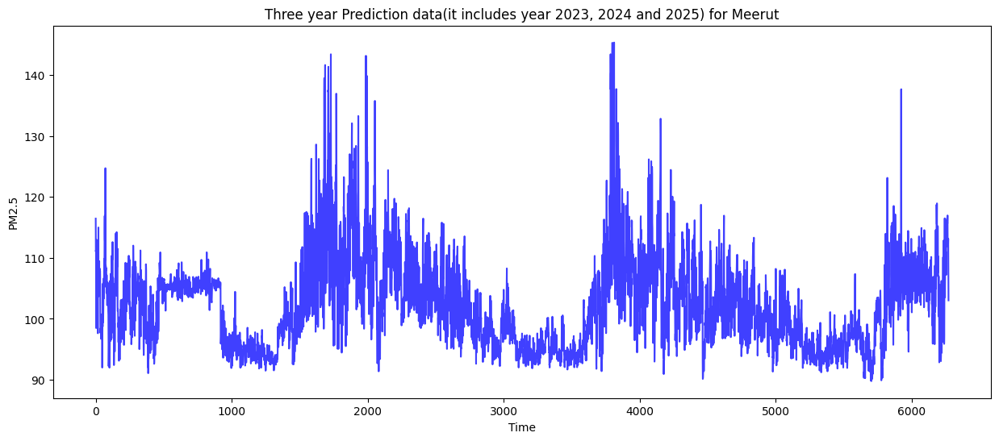

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_21 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_21 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_63 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_63 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_64 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_64 (Dropout)        (None, 5, 64)             0         
                                                     

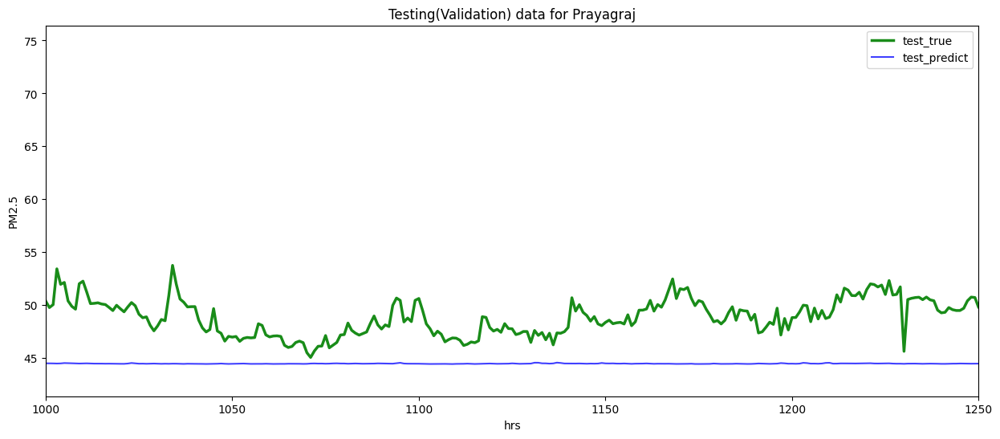

206/206 [==============================] - 2s 9ms/step


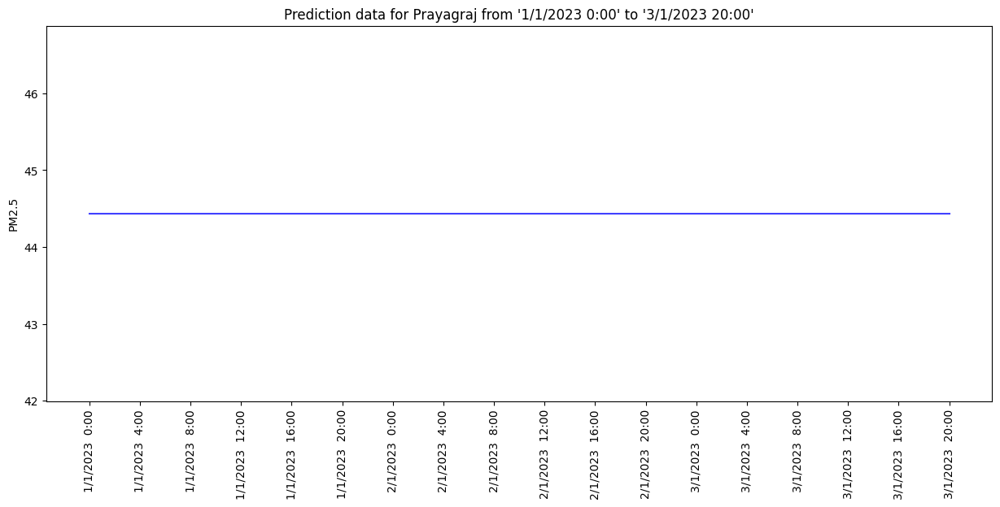

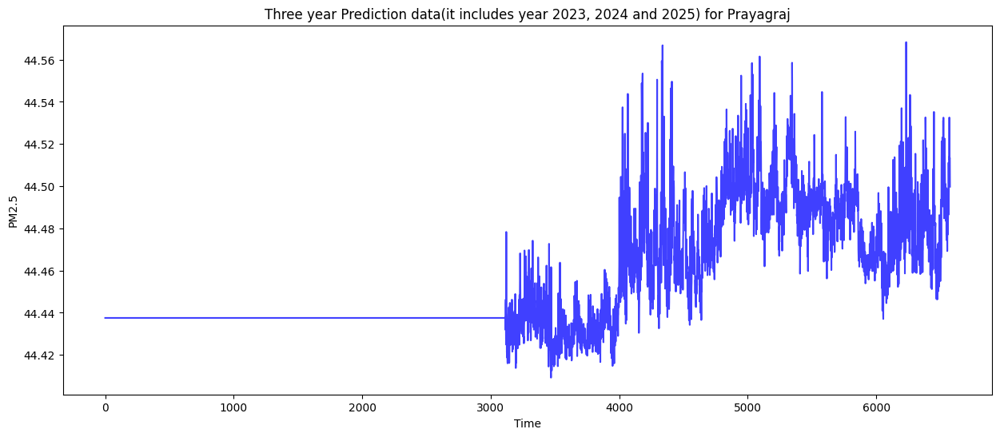

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_22 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_22 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_66 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_66 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_67 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_67 (Dropout)        (None, 5, 64)             0         
                                                     

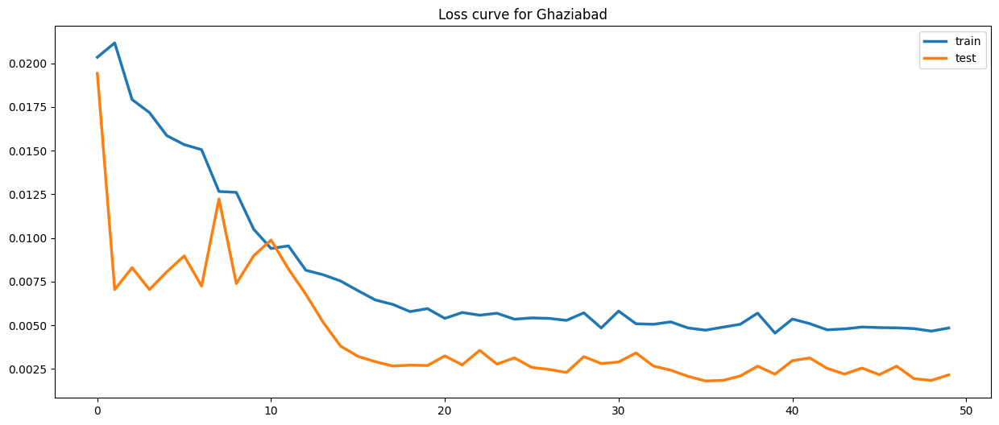

90/90 [==============================] - 2s 9ms/step
(2875, 1)
(2875,)


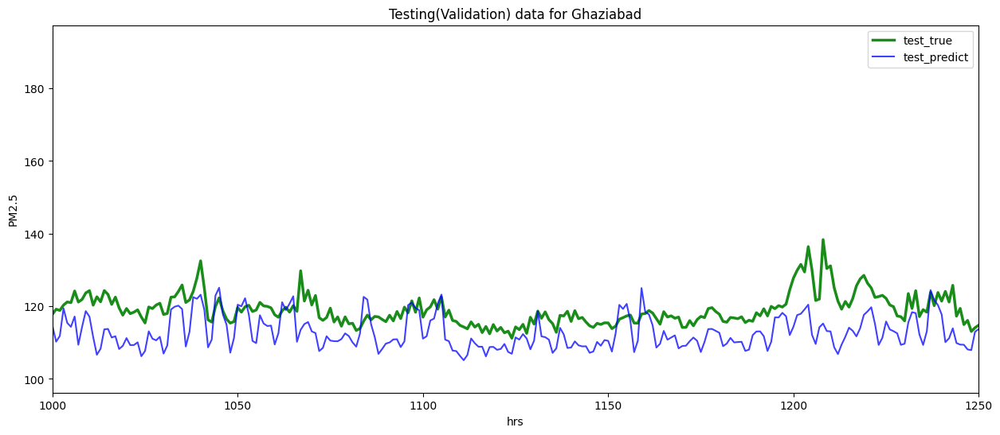

190/190 [==============================] - 2s 10ms/step


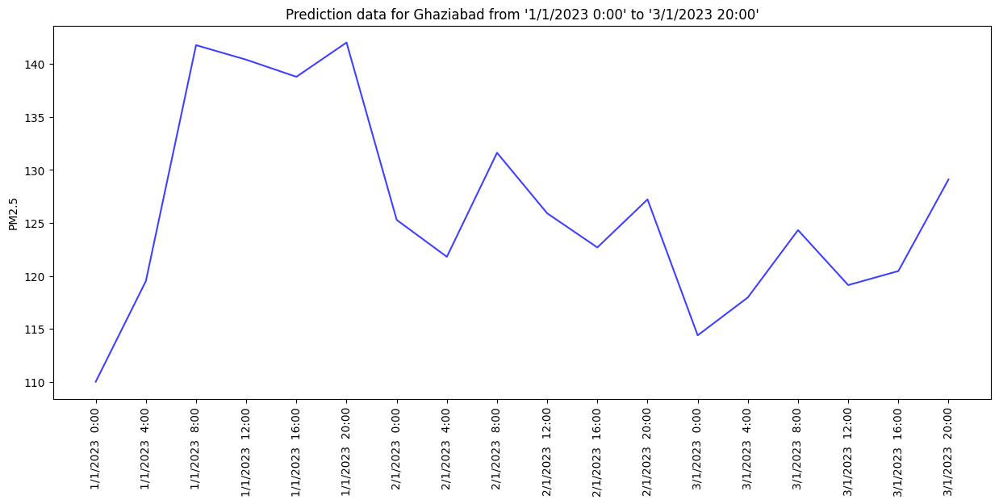

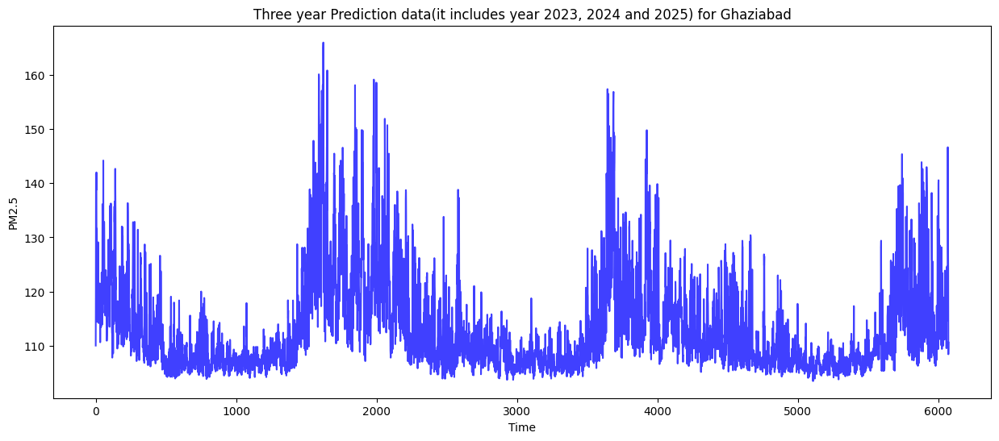

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_23 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_23 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_69 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_69 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_70 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_70 (Dropout)        (None, 5, 64)             0         
                                                     

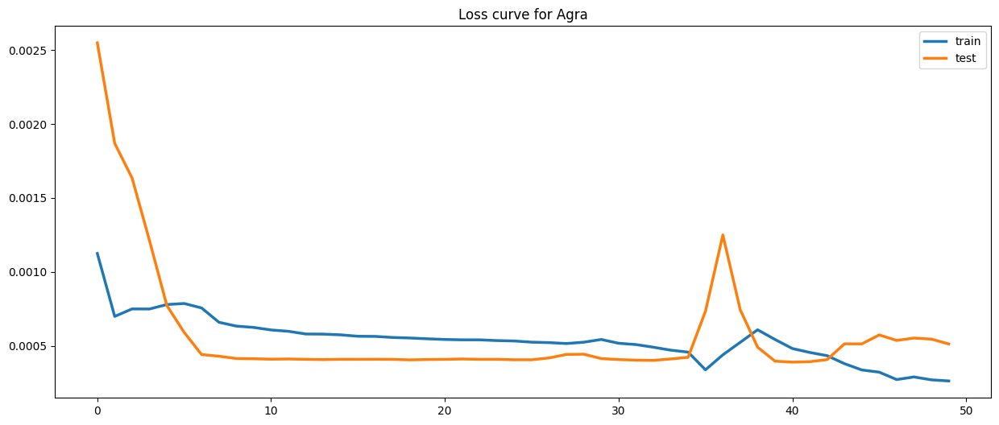

102/102 [==============================] - 2s 10ms/step
(3259, 1)
(3259,)


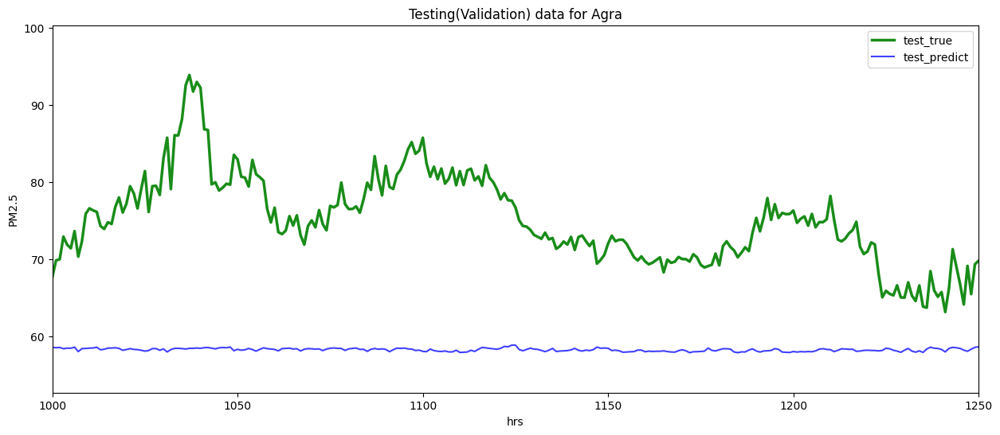

202/202 [==============================] - 2s 10ms/step


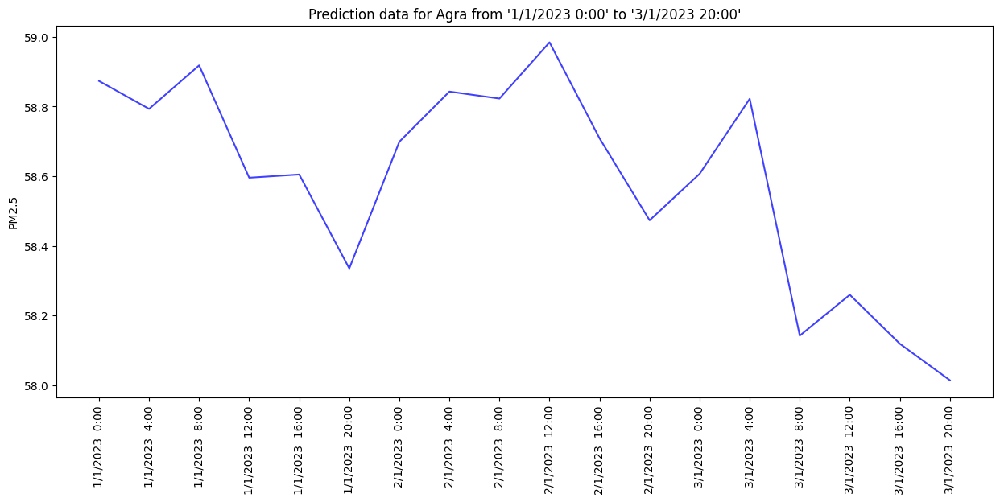

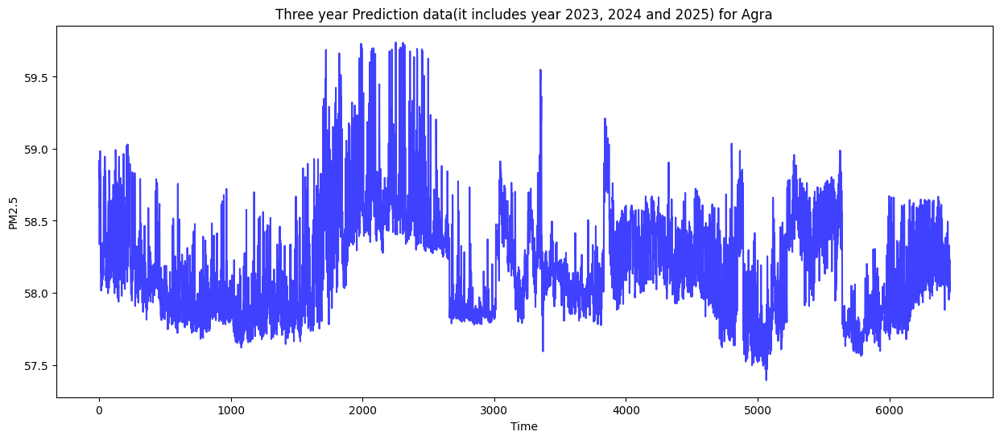

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_24 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_24 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_72 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_72 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_73 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_73 (Dropout)        (None, 5, 64)             0         
                                                     

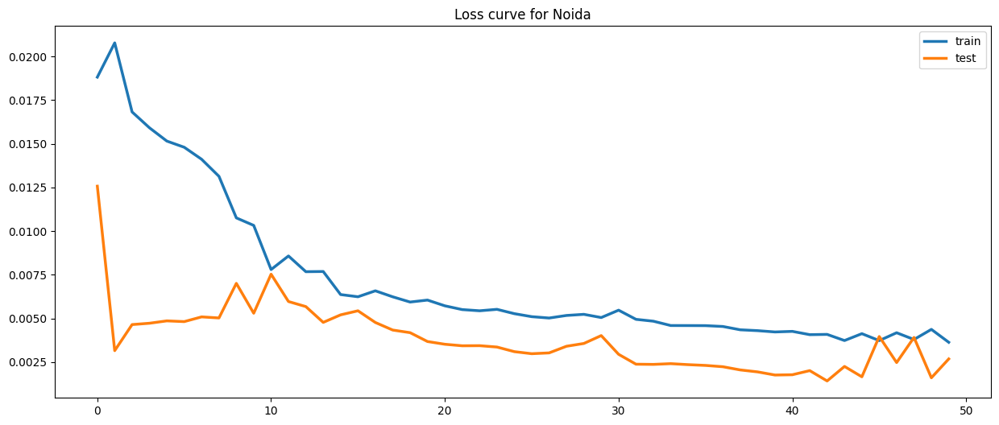

97/97 [==============================] - 2s 9ms/step
(3080, 1)
(3080,)


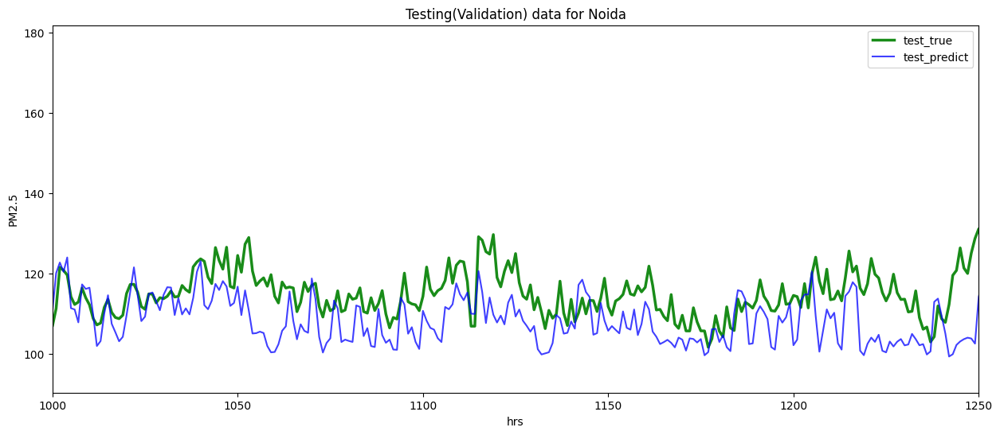

197/197 [==============================] - 2s 10ms/step


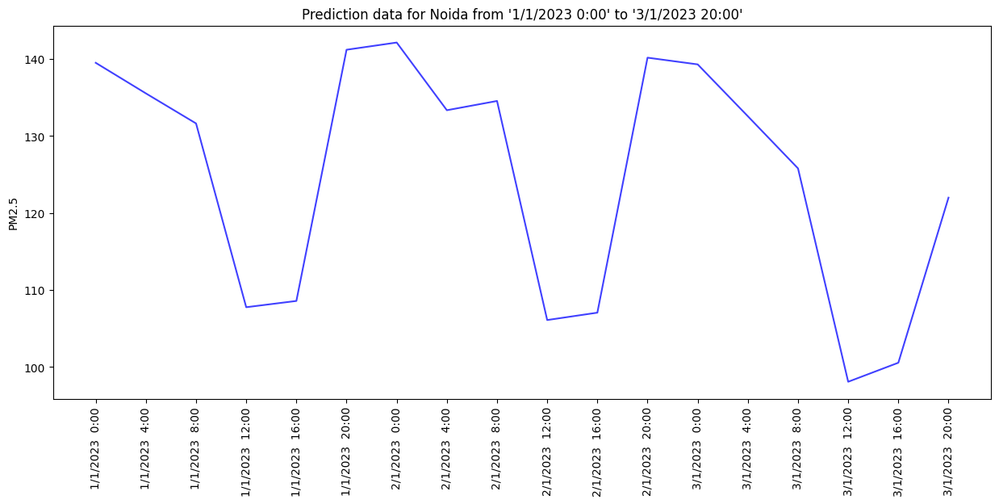

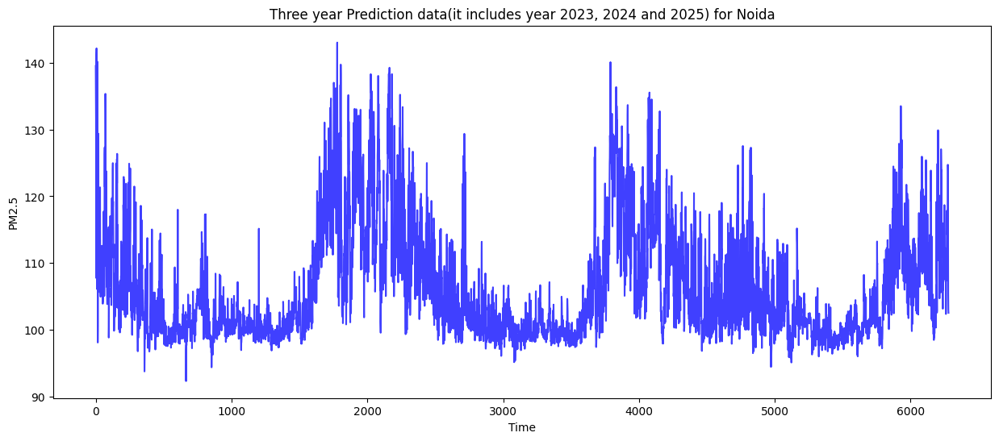

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_25 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_25 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_75 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_75 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_76 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_76 (Dropout)        (None, 5, 64)             0         
                                                     

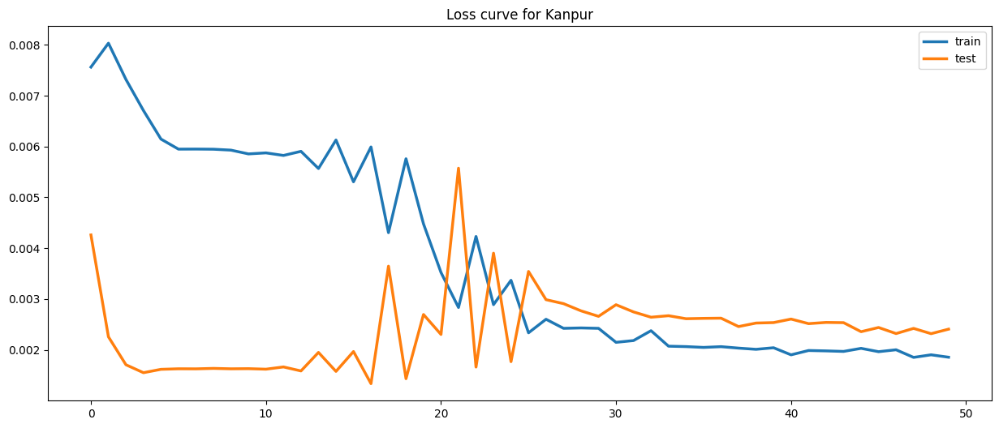

105/105 [==============================] - 2s 10ms/step
(3349, 1)
(3349,)


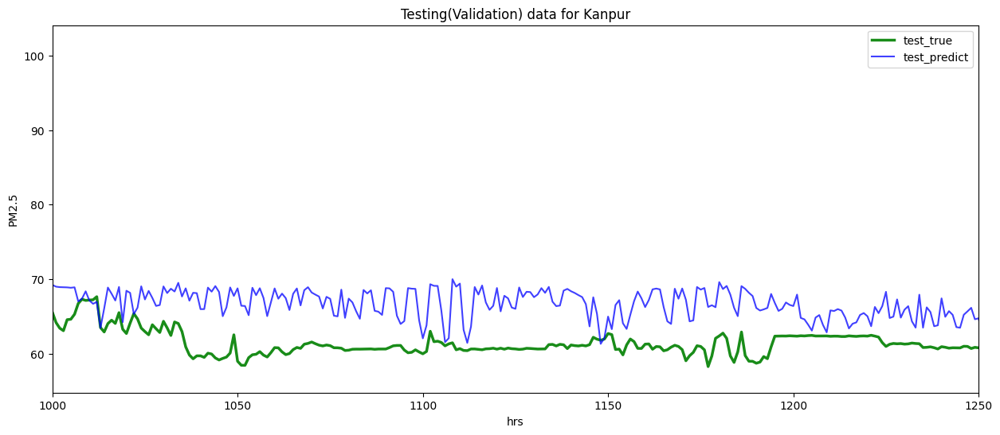

205/205 [==============================] - 2s 10ms/step


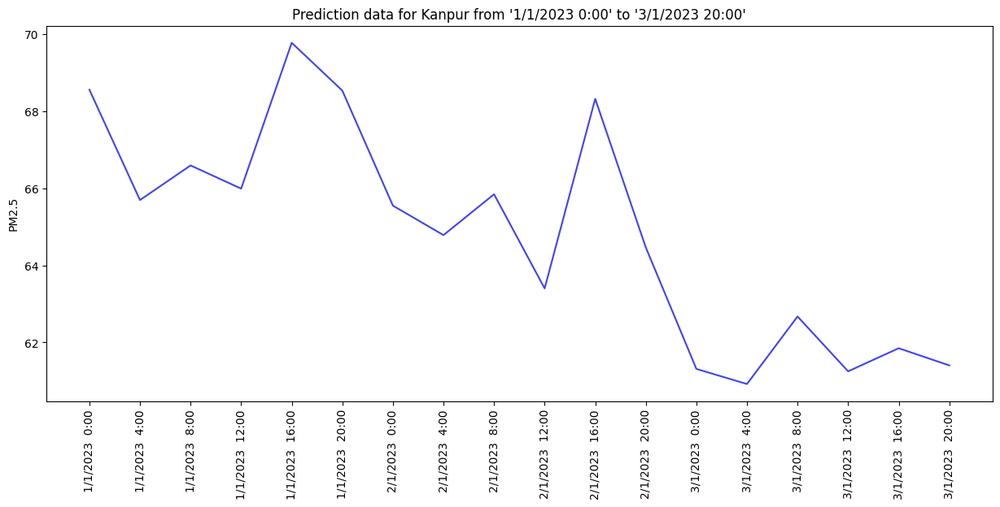

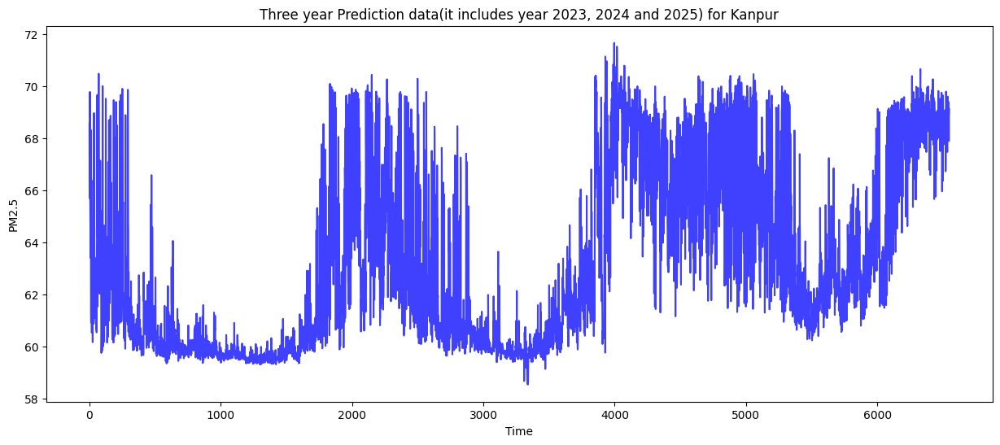

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_26 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_26 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_78 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_78 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_79 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_79 (Dropout)        (None, 5, 64)             0         
                                                     

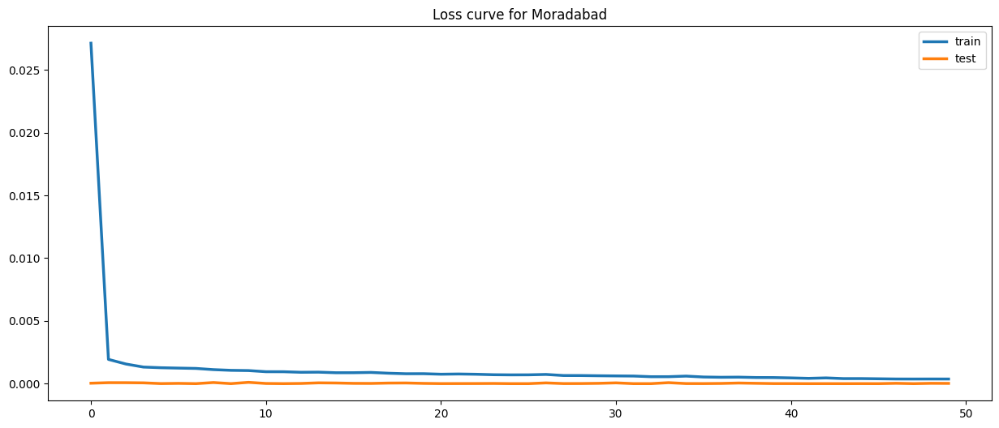

106/106 [==============================] - 3s 10ms/step
(3375, 1)
(3375,)


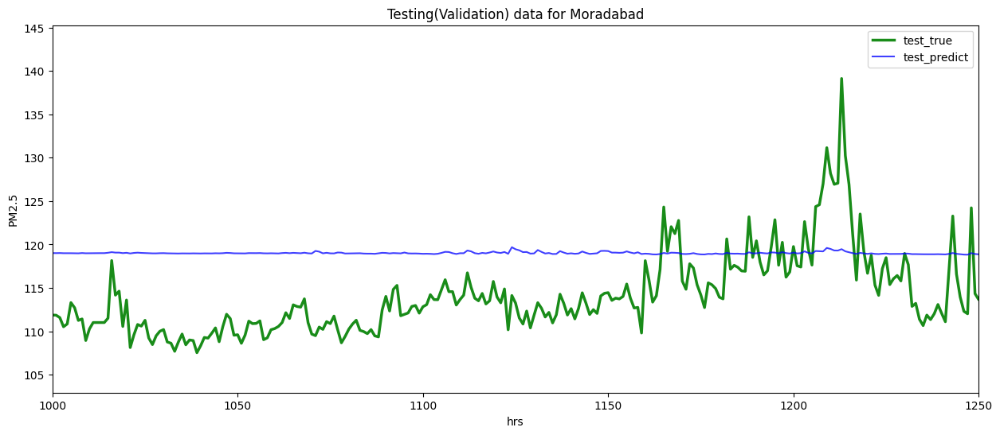

206/206 [==============================] - 2s 9ms/step


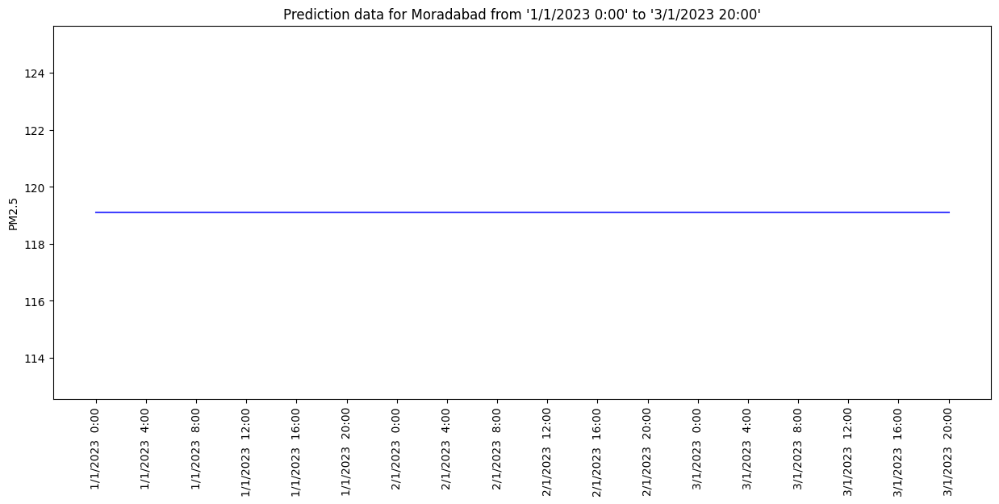

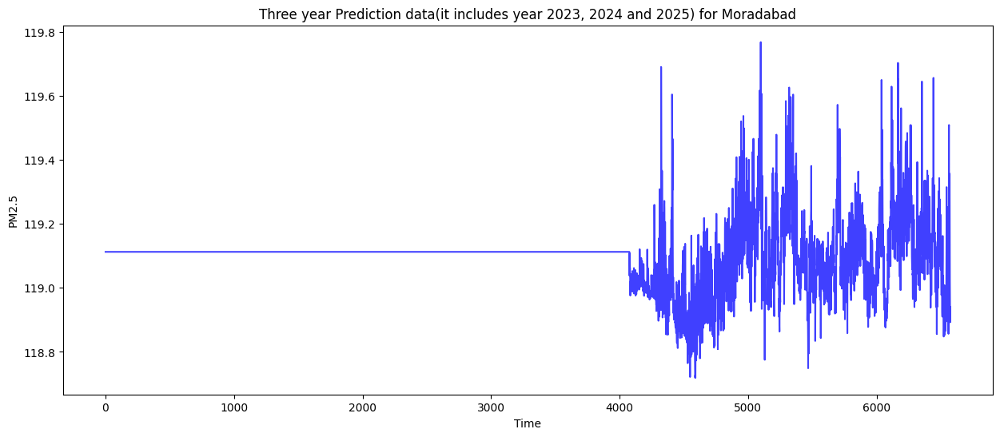

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_27 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_27 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_81 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_81 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_82 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_82 (Dropout)        (None, 5, 64)             0         
                                                     

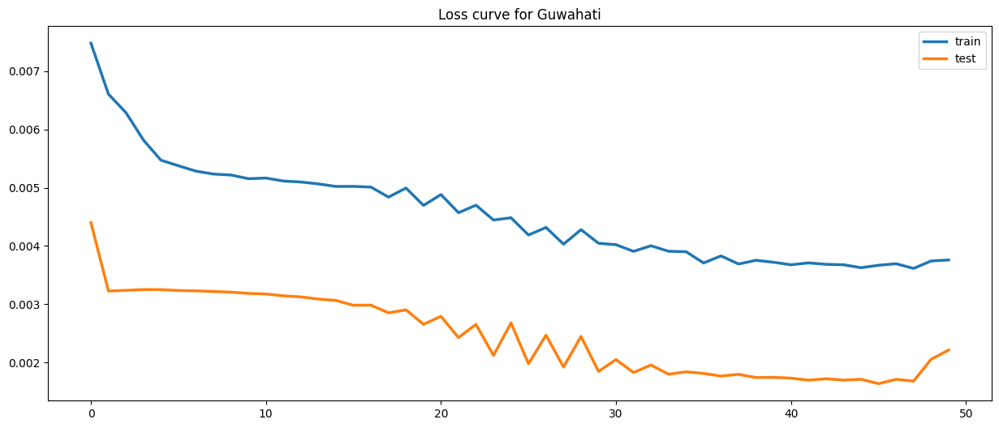

103/103 [==============================] - 2s 10ms/step
(3279, 1)
(3279,)


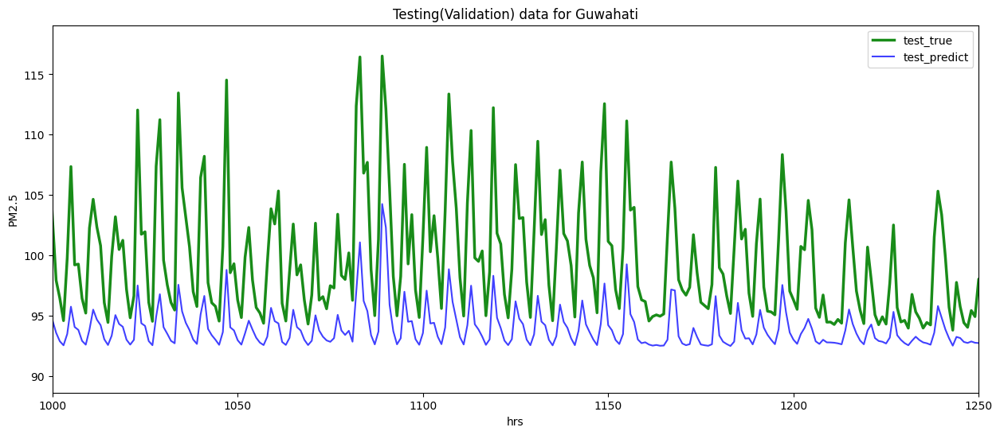

203/203 [==============================] - 2s 10ms/step


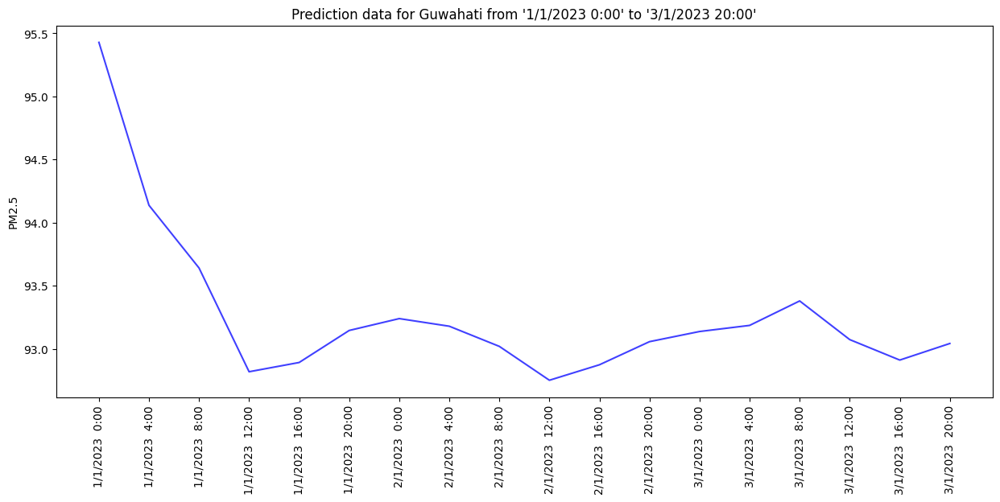

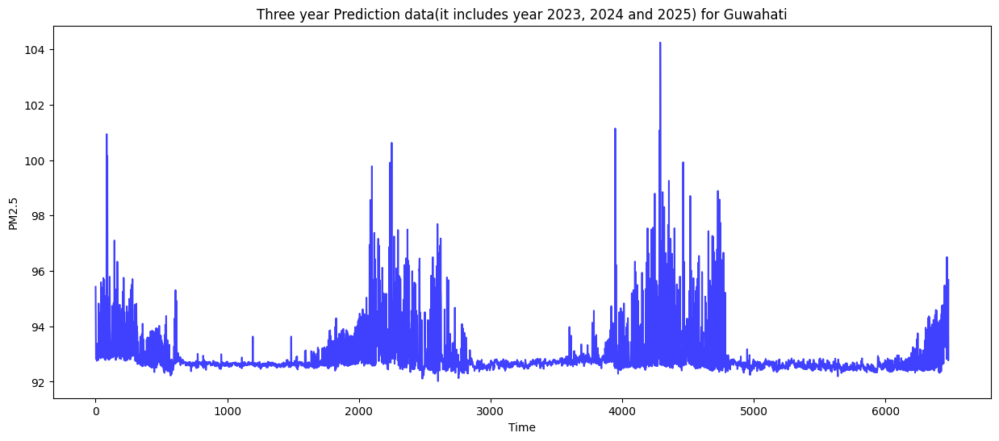

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_28 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_28 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_84 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_84 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_85 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_85 (Dropout)        (None, 5, 64)             0         
                                                     

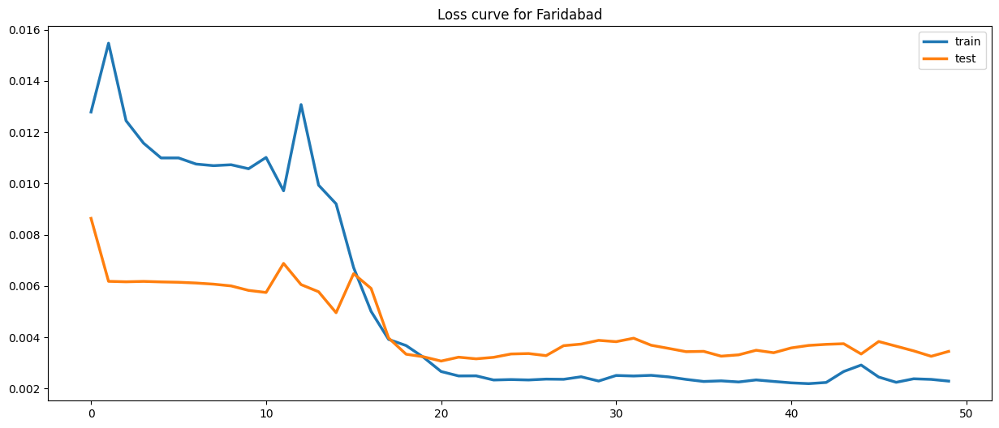

104/104 [==============================] - 2s 9ms/step
(3319, 1)
(3319,)


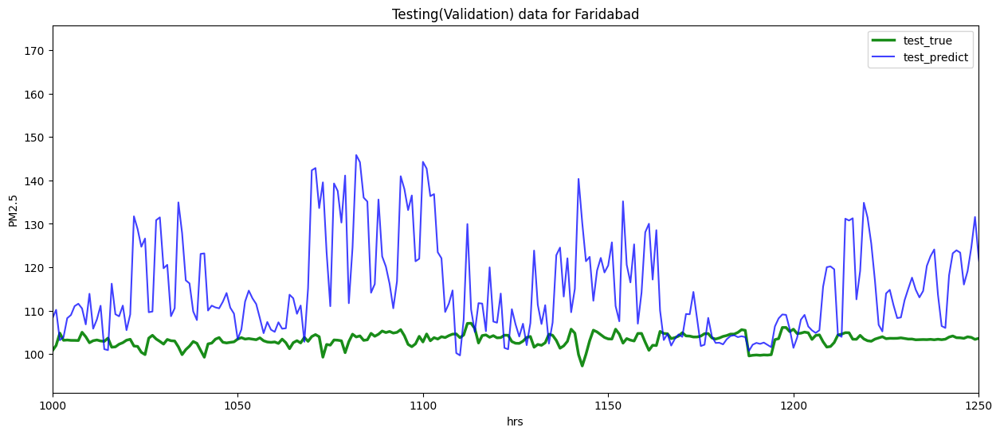

204/204 [==============================] - 2s 9ms/step


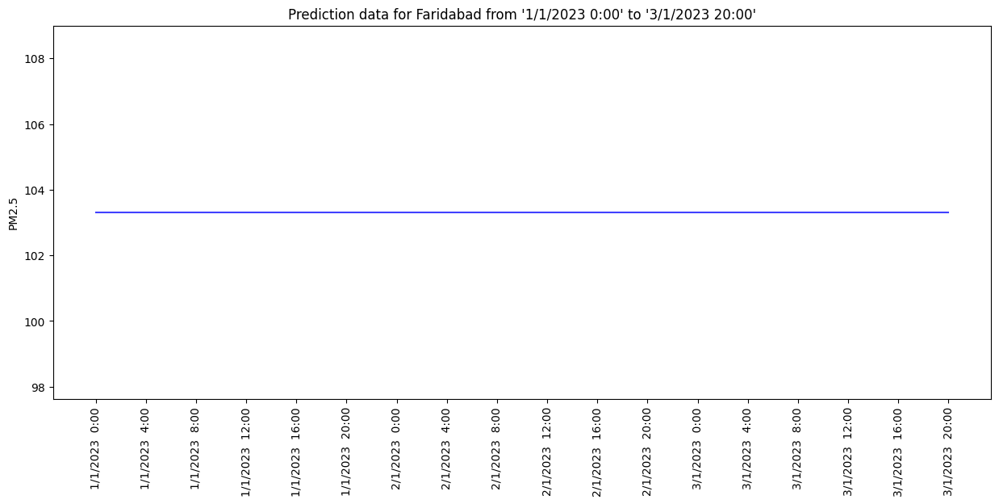

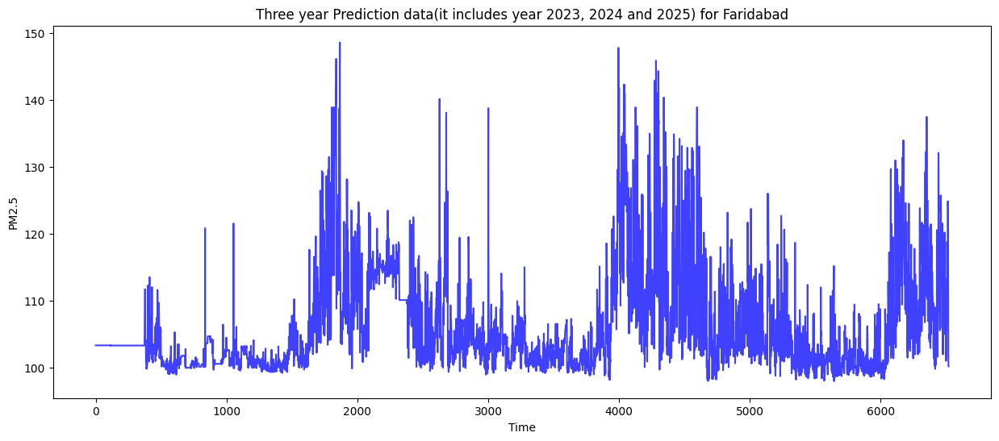

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_29 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_29 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_87 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_87 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_88 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_88 (Dropout)        (None, 5, 64)             0         
                                                     

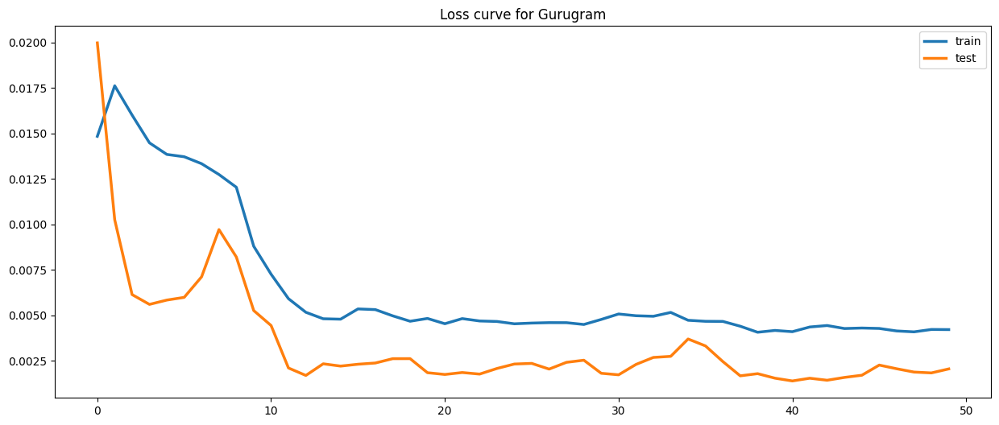

89/89 [==============================] - 3s 9ms/step
(2842, 1)
(2842,)


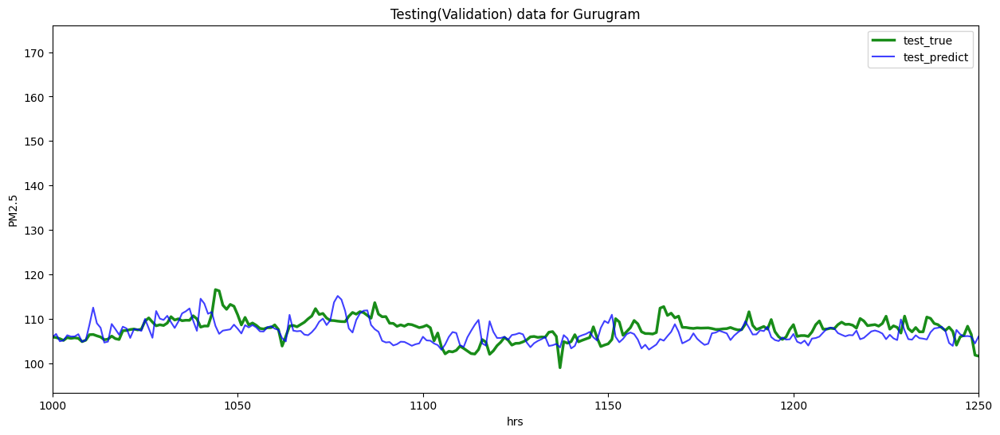

189/189 [==============================] - 2s 9ms/step


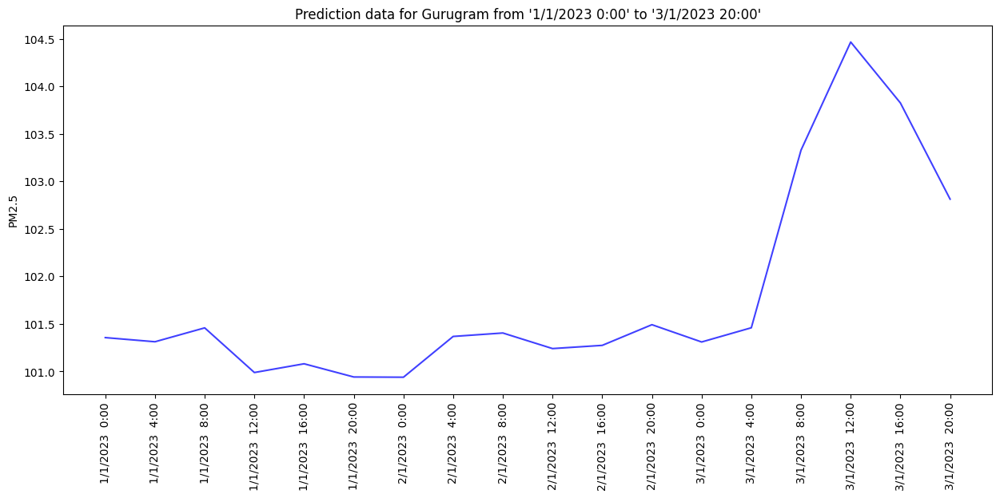

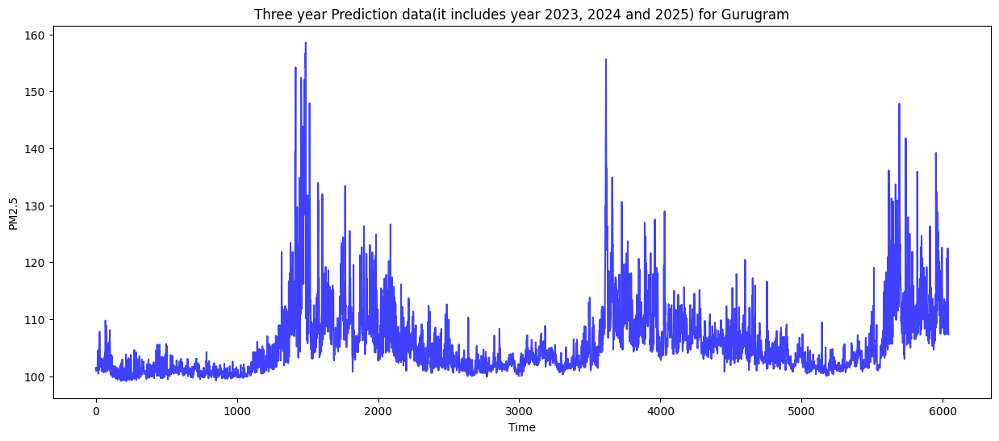

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_30 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_30 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_90 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_90 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_91 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_91 (Dropout)        (None, 5, 64)             0         
                                                     

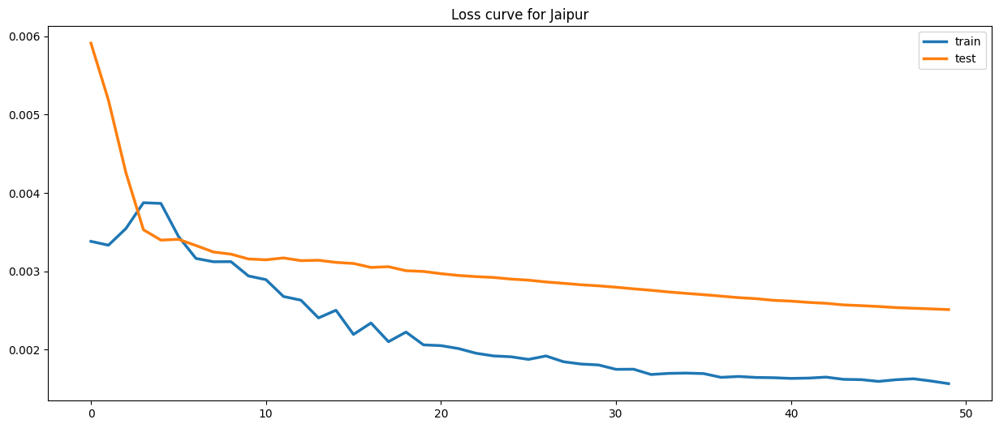

86/86 [==============================] - 2s 9ms/step
(2736, 1)
(2736,)


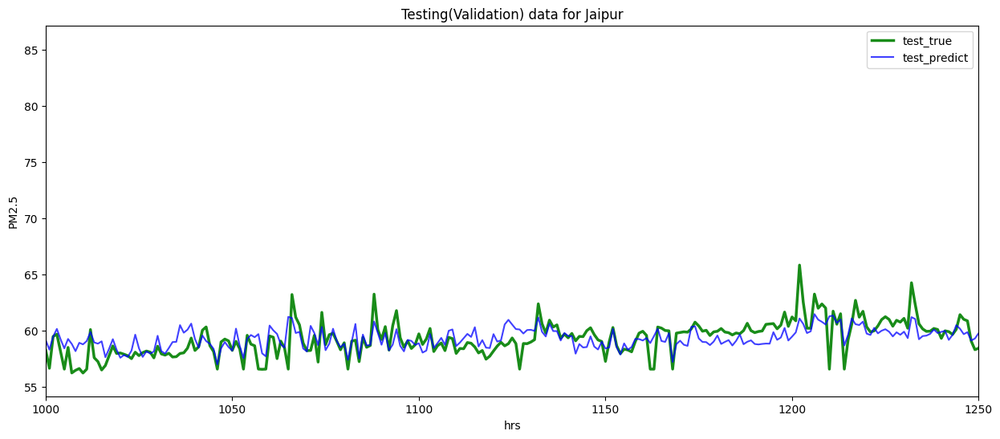

186/186 [==============================] - 2s 9ms/step


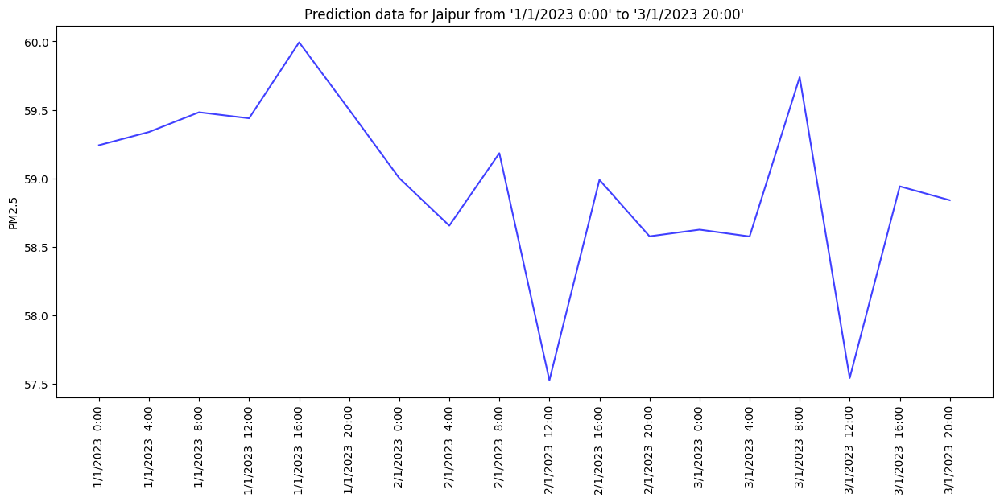

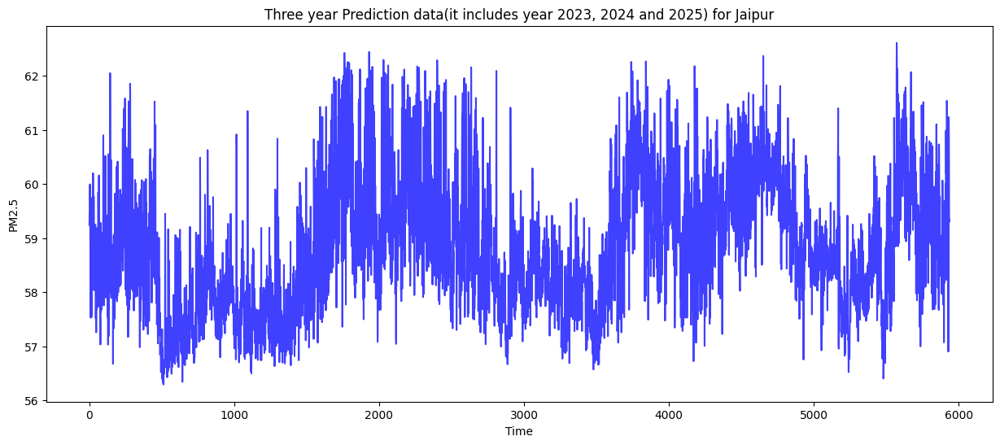

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_31 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_31 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_93 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_93 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_94 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_94 (Dropout)        (None, 5, 64)             0         
                                                     

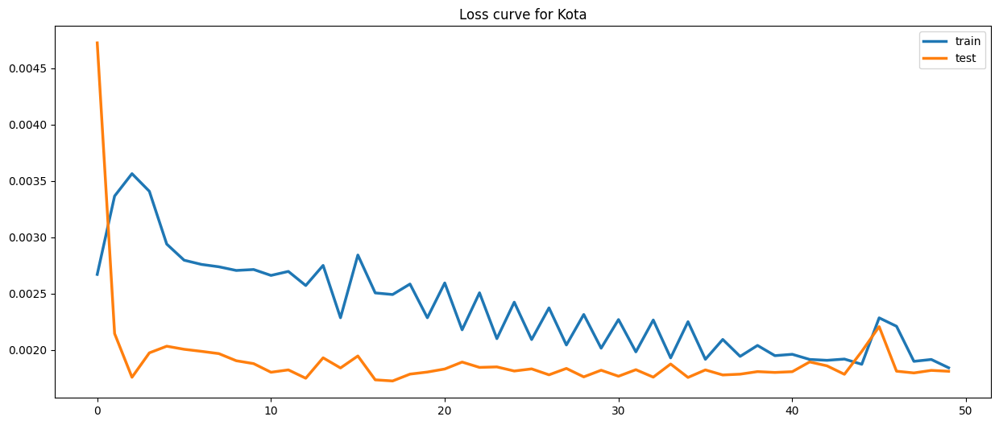

105/105 [==============================] - 3s 12ms/step
(3333, 1)
(3333,)


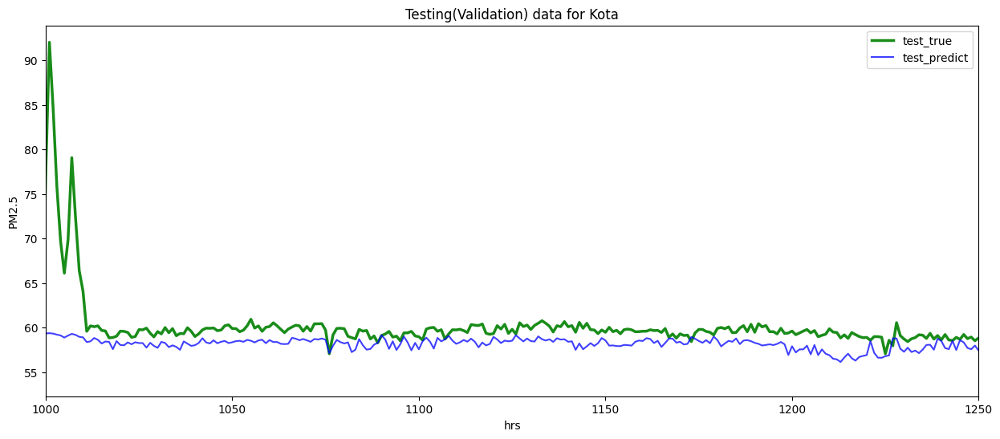

205/205 [==============================] - 2s 9ms/step


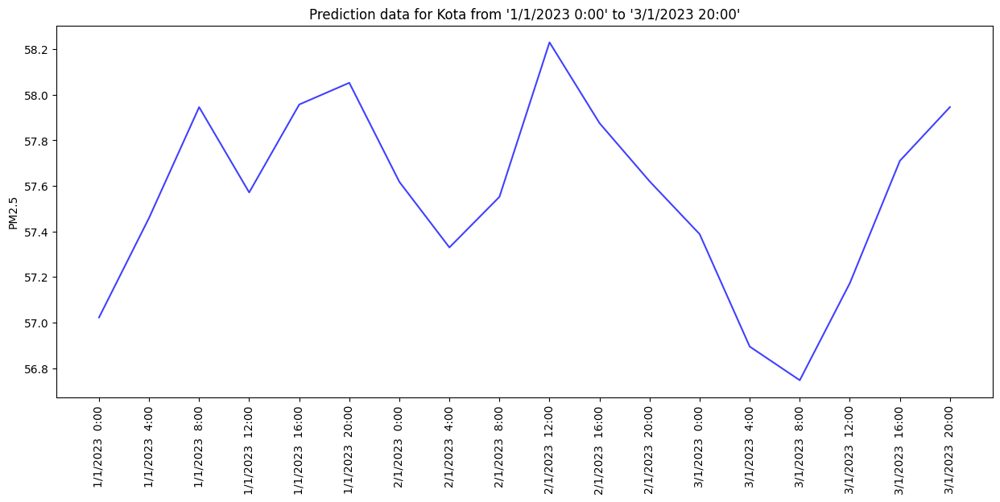

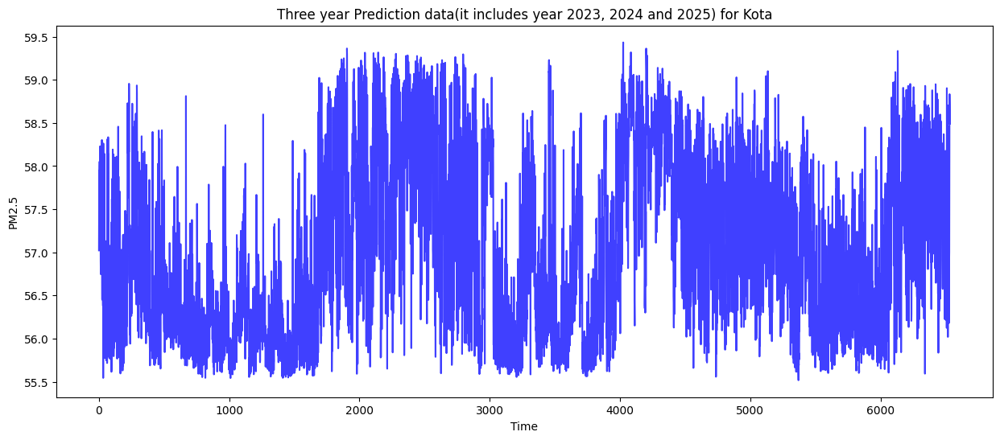

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_32"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_32 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_32 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_96 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_96 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_97 (LSTM)              (None, 5, 64)             49408     
                                                                 
 dropout_97 (Dropout)        (None, 5, 64)             0         
                                                     

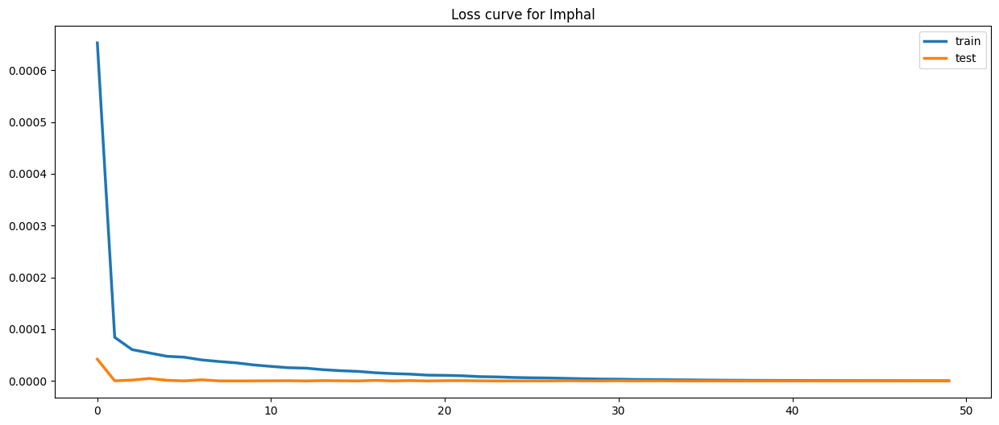

106/106 [==============================] - 2s 9ms/step
(3375, 1)
(3375,)


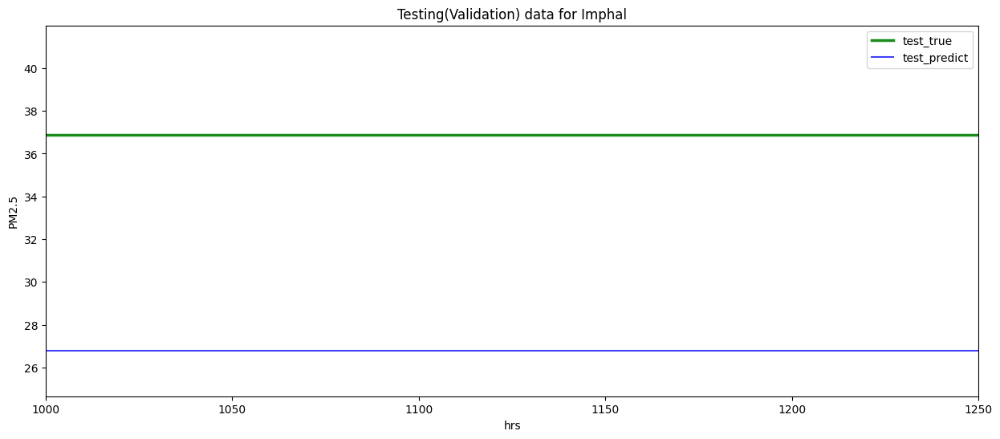

206/206 [==============================] - 2s 10ms/step


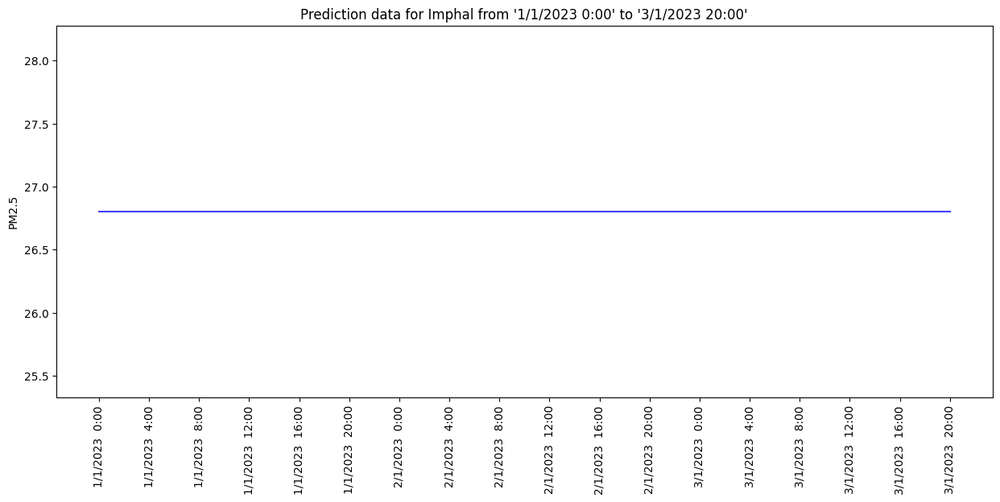

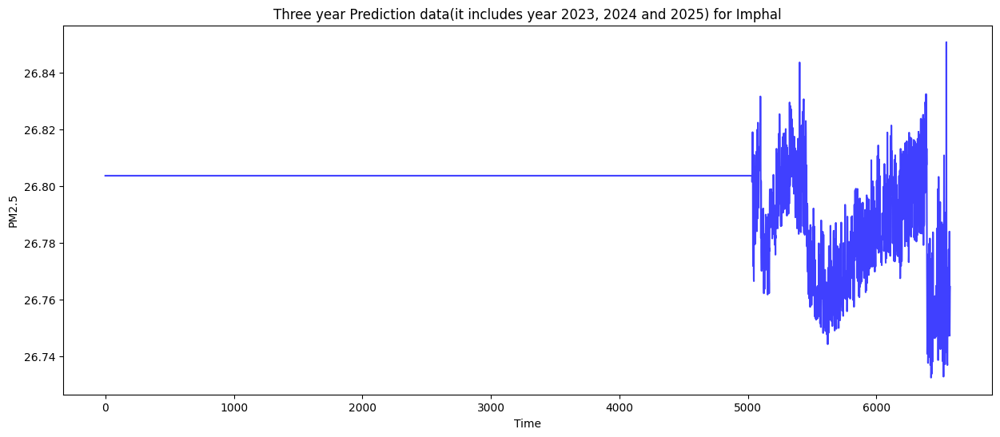

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_33"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_33 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_33 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_99 (LSTM)              (None, 5, 128)            82432     
                                                                 
 dropout_99 (Dropout)        (None, 5, 128)            0         
                                                                 
 lstm_100 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_100 (Dropout)       (None, 5, 64)             0         
                                                     

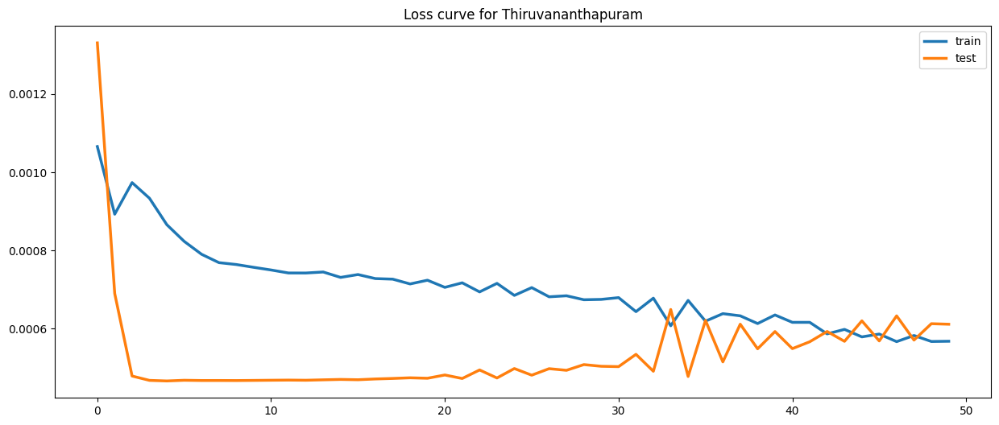

103/103 [==============================] - 2s 9ms/step
(3292, 1)
(3292,)


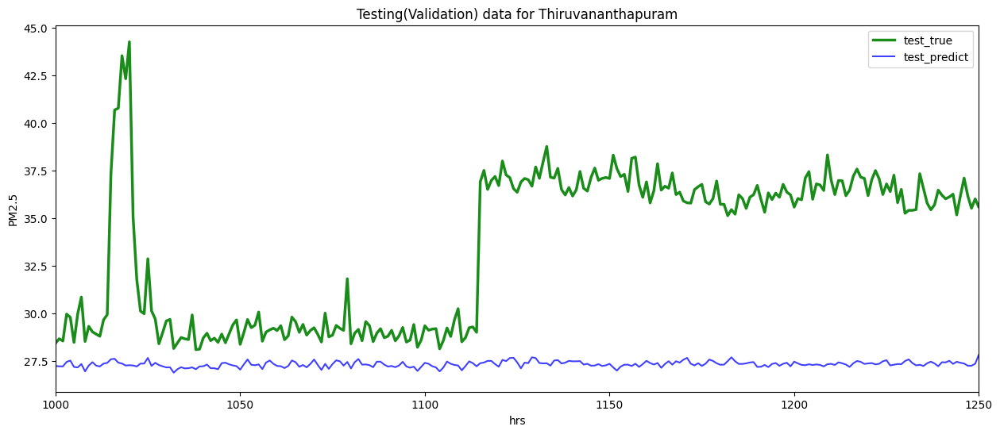

203/203 [==============================] - 2s 9ms/step


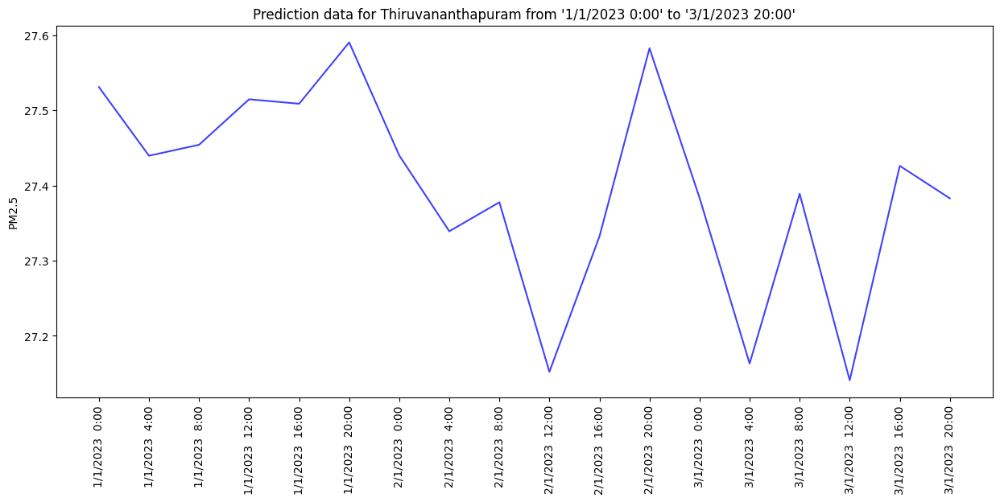

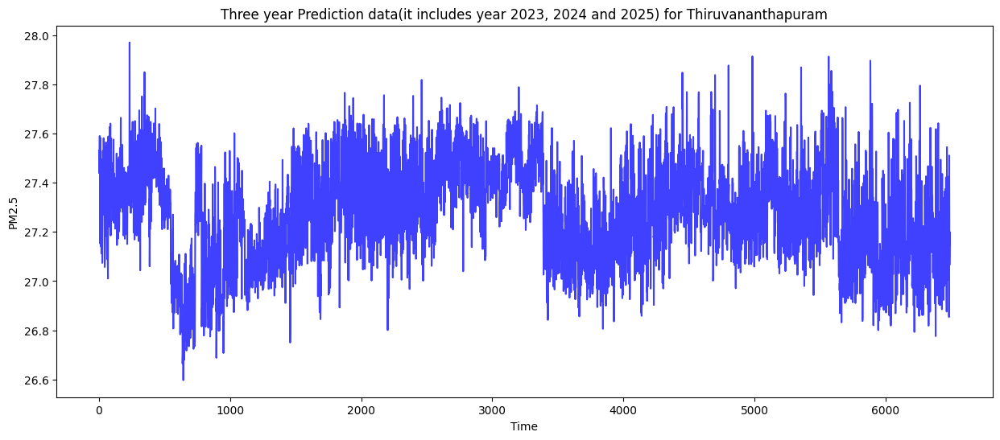

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_34"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_34 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_34 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_102 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_102 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_103 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_103 (Dropout)       (None, 5, 64)             0         
                                                     

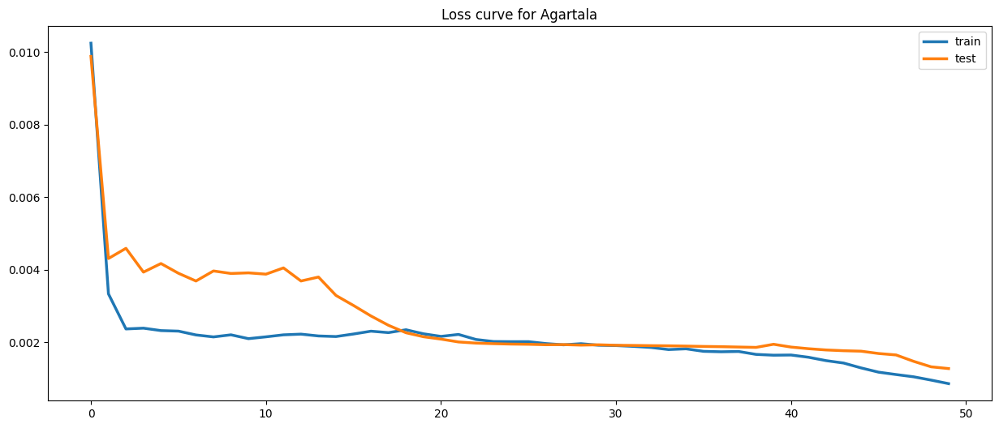

106/106 [==============================] - 3s 10ms/step
(3375, 1)
(3375,)


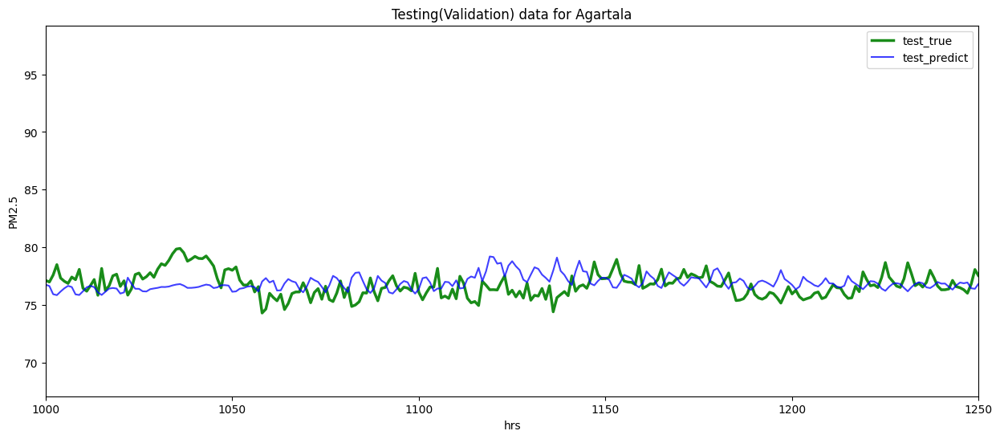

206/206 [==============================] - 2s 9ms/step


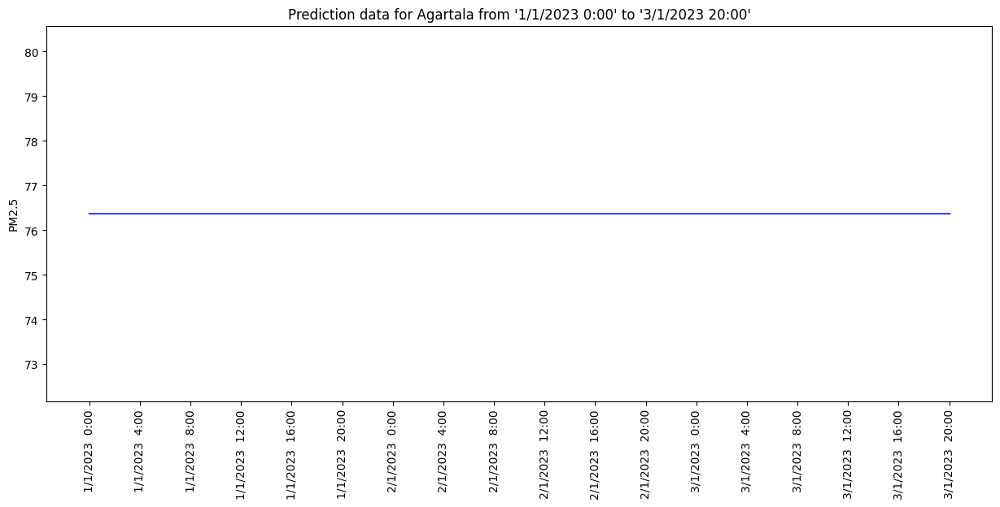

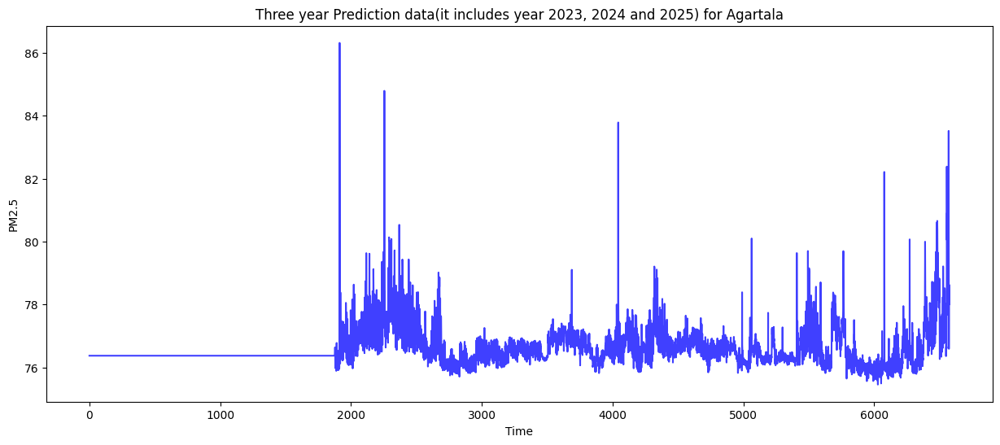

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_35"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_35 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_35 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_105 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_105 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_106 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_106 (Dropout)       (None, 5, 64)             0         
                                                     

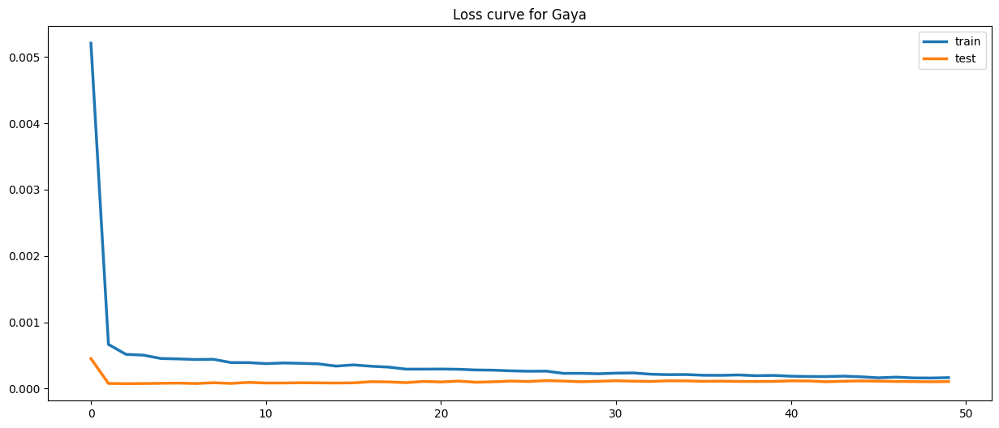

99/99 [==============================] - 3s 11ms/step
(3152, 1)
(3152,)


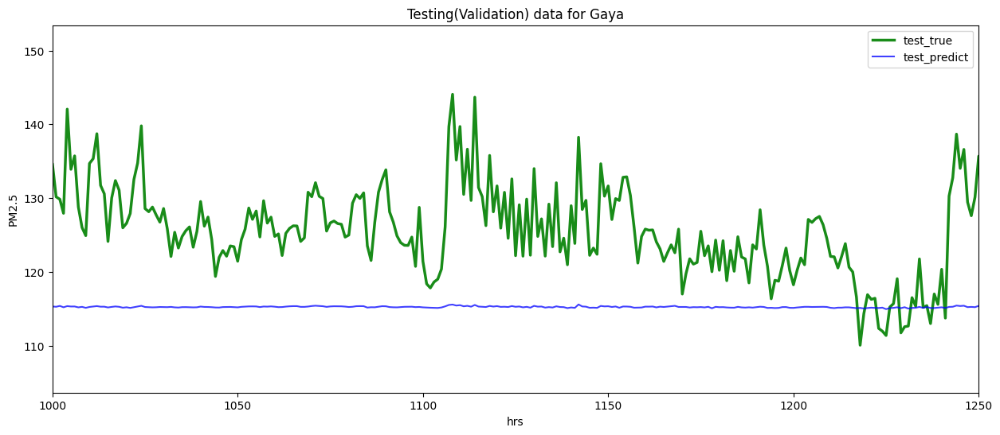

199/199 [==============================] - 2s 11ms/step


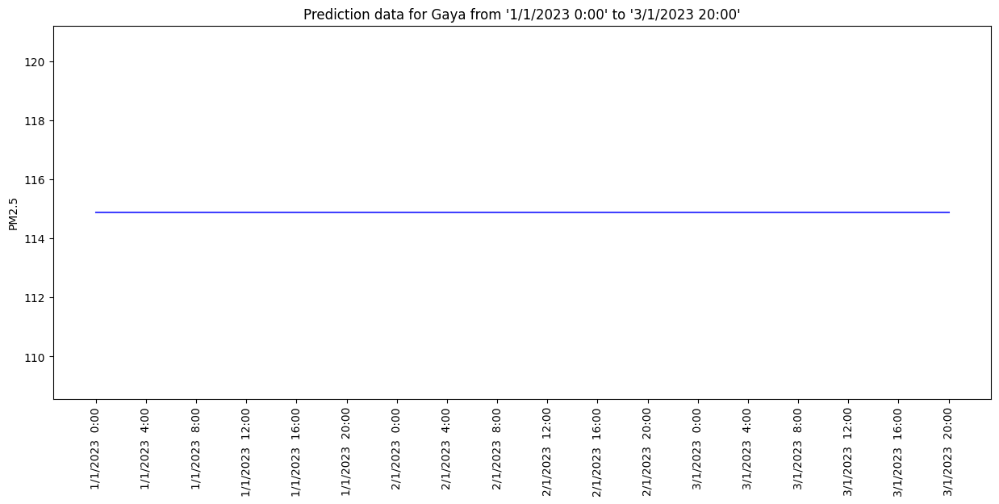

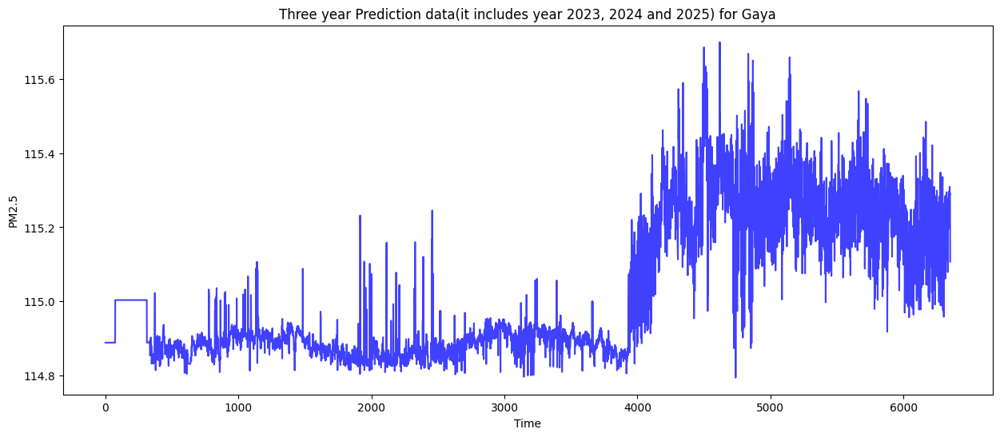

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_36"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_36 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_36 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_108 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_108 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_109 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_109 (Dropout)       (None, 5, 64)             0         
                                                     

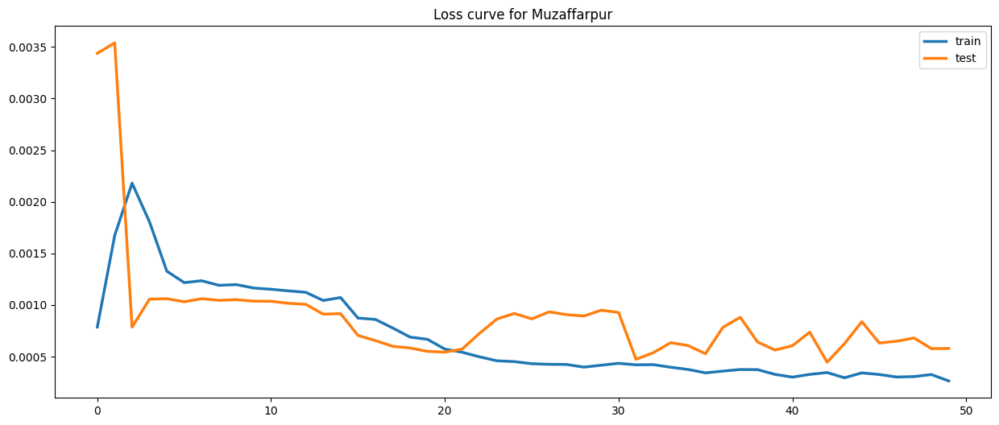

105/105 [==============================] - 3s 9ms/step
(3344, 1)
(3344,)


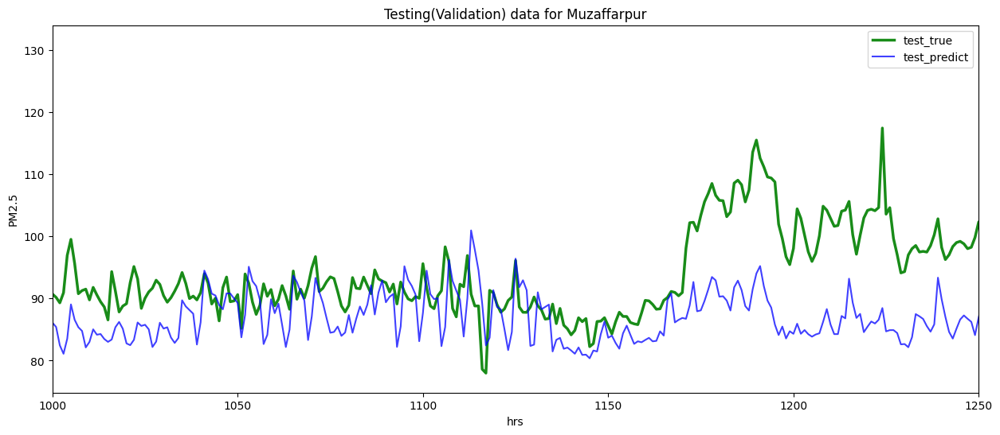

205/205 [==============================] - 2s 9ms/step


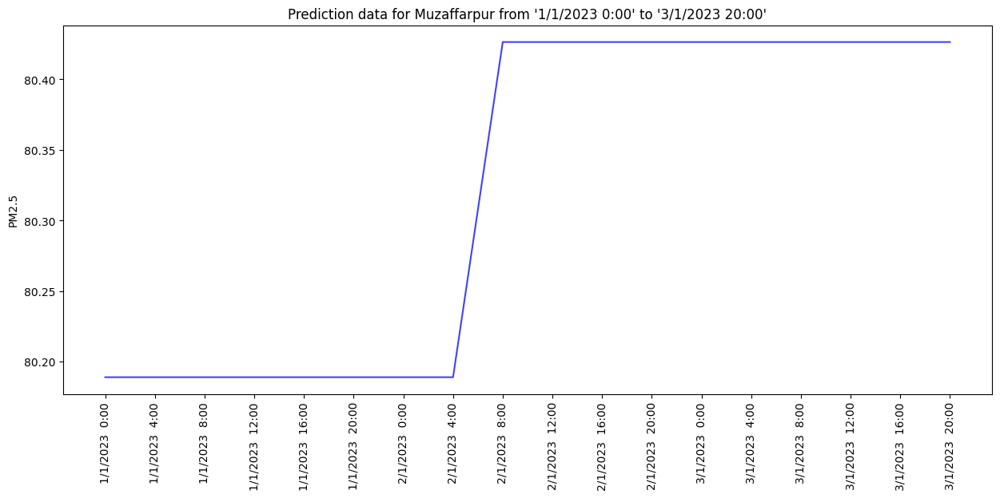

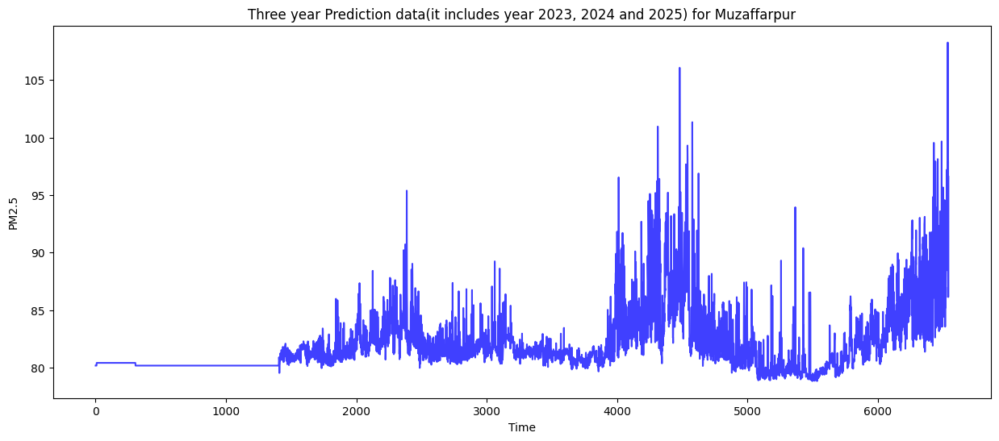

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_37"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_37 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_37 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_111 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_111 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_112 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_112 (Dropout)       (None, 5, 64)             0         
                                                     

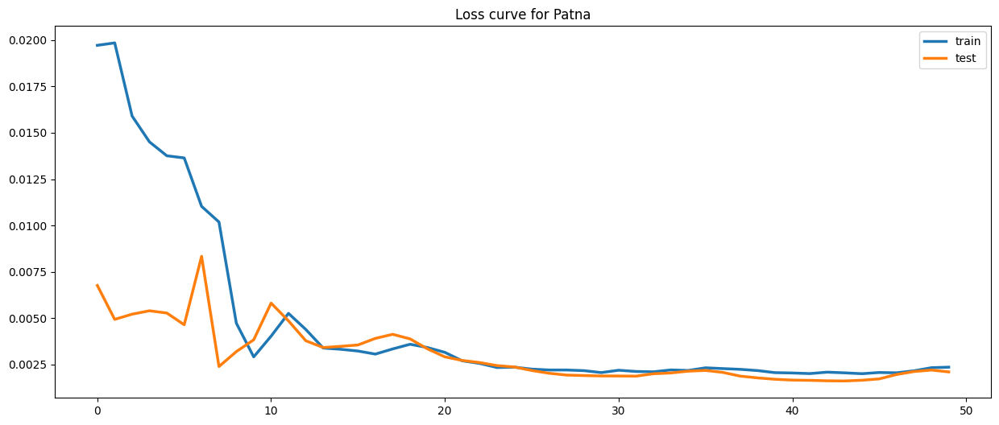

98/98 [==============================] - 2s 9ms/step
(3115, 1)
(3115,)


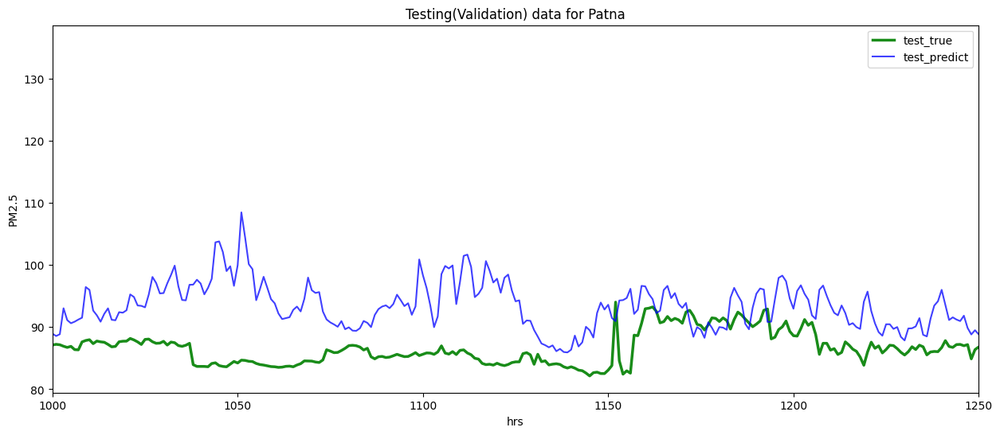

198/198 [==============================] - 2s 10ms/step


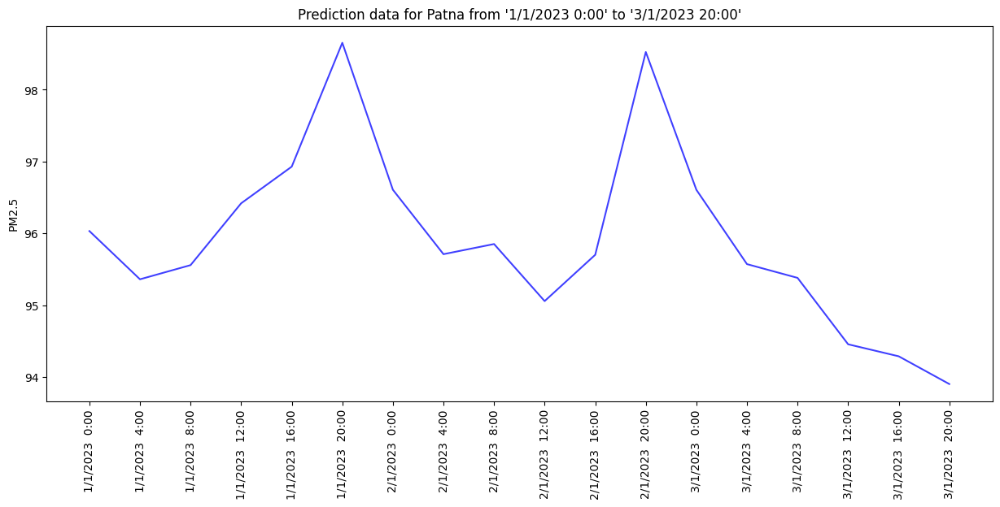

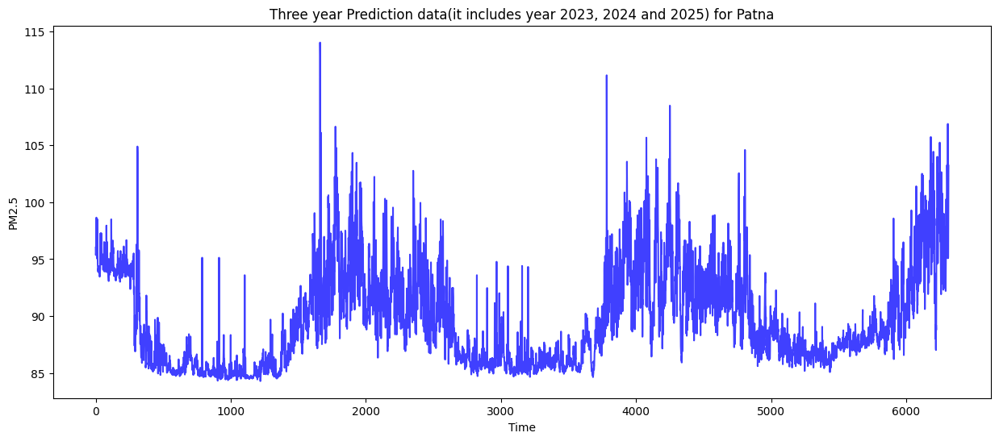

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_38"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_38 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_38 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_114 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_114 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_115 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_115 (Dropout)       (None, 5, 64)             0         
                                                     

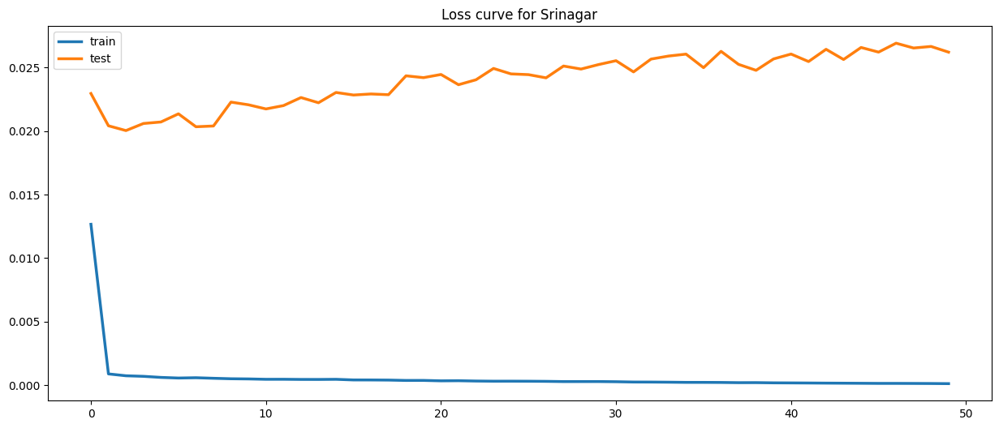

106/106 [==============================] - 2s 9ms/step
(3375, 1)
(3375,)


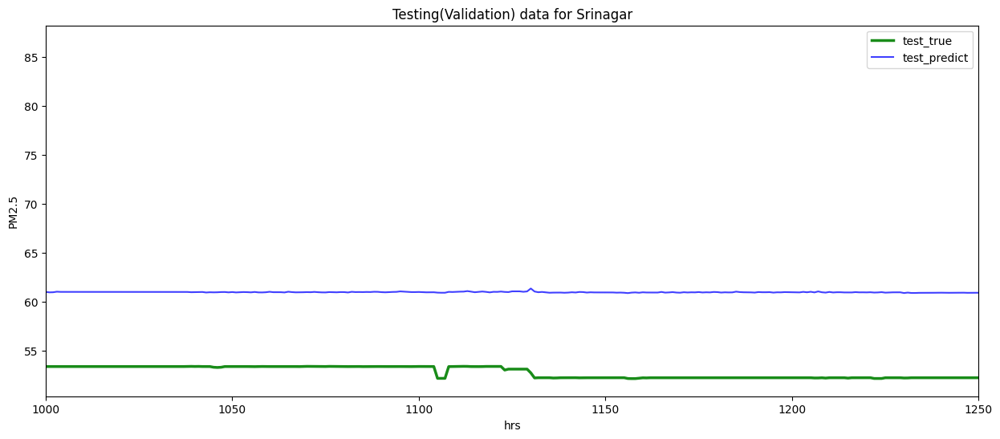

206/206 [==============================] - 2s 10ms/step


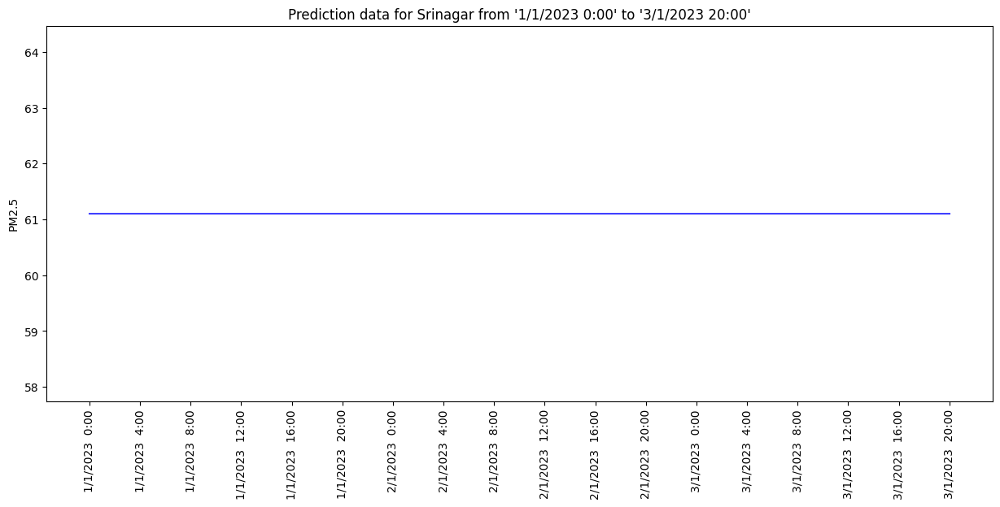

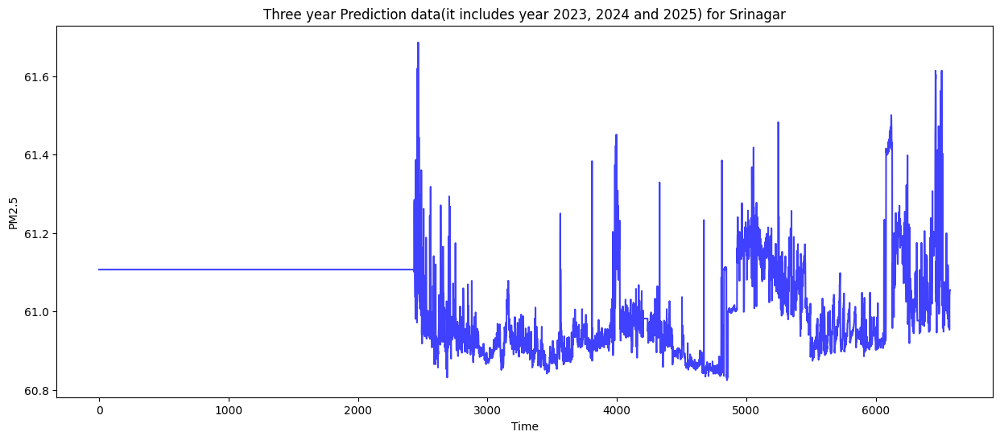

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_39 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_39 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_117 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_117 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_118 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_118 (Dropout)       (None, 5, 64)             0         
                                                     

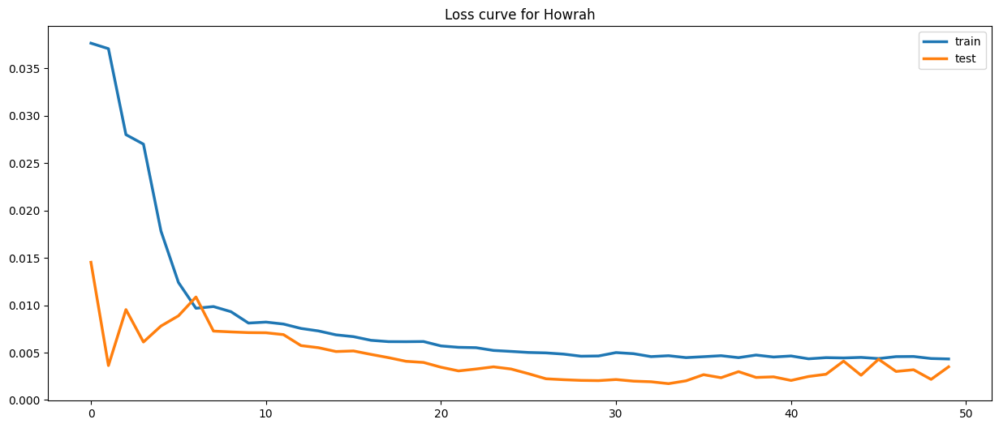

89/89 [==============================] - 3s 11ms/step
(2842, 1)
(2842,)


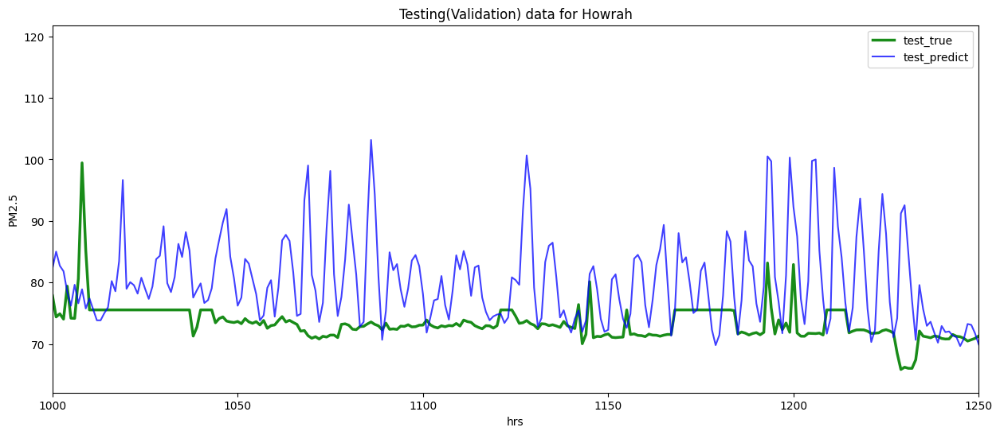

189/189 [==============================] - 2s 10ms/step


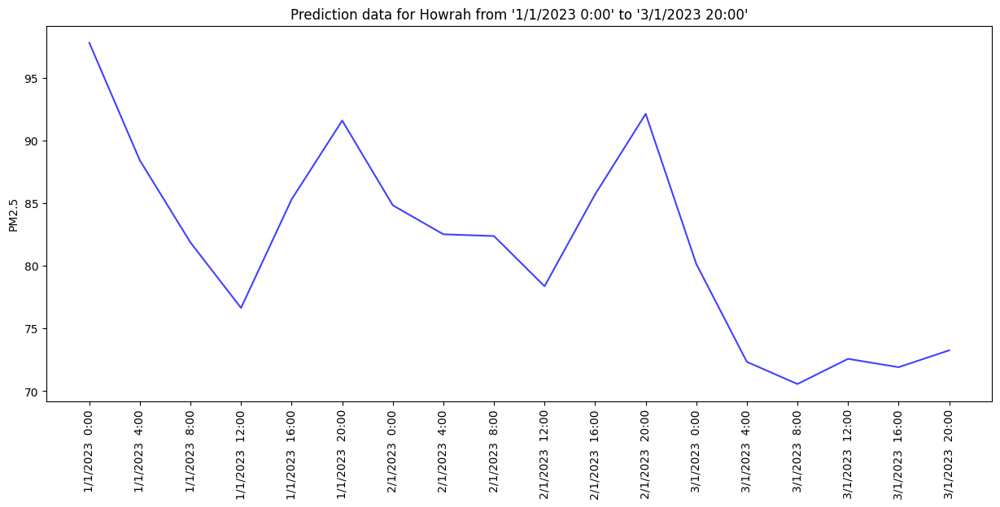

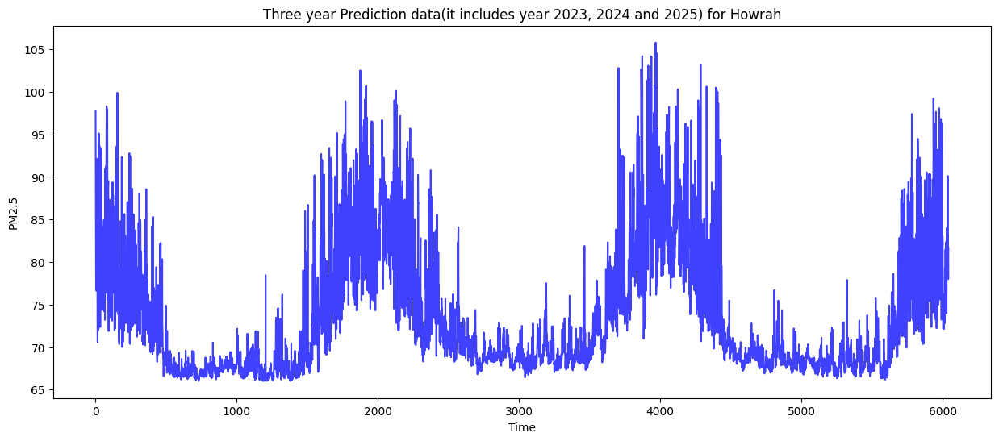

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_40 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_40 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_120 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_120 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_121 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_121 (Dropout)       (None, 5, 64)             0         
                                                     

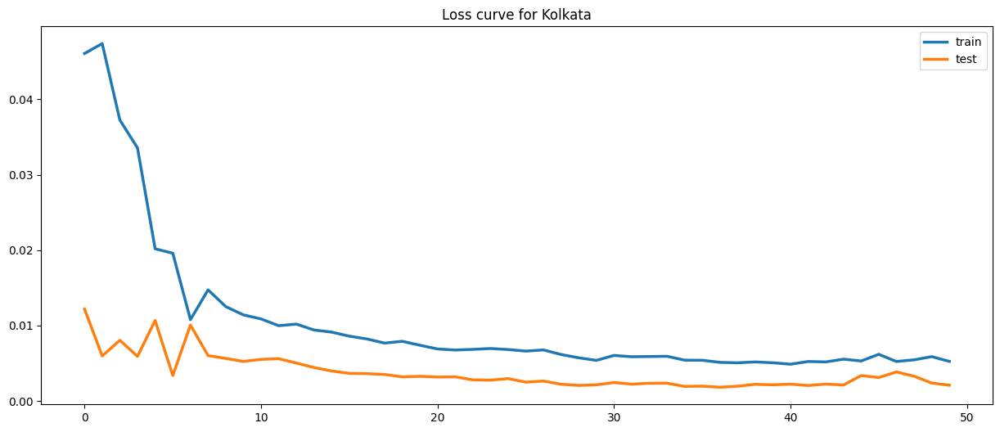

97/97 [==============================] - 2s 10ms/step
(3099, 1)
(3099,)


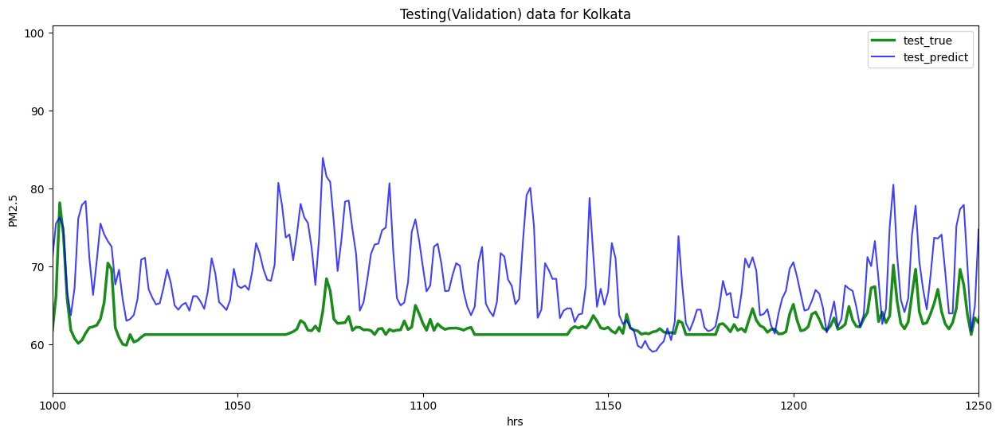

197/197 [==============================] - 2s 10ms/step


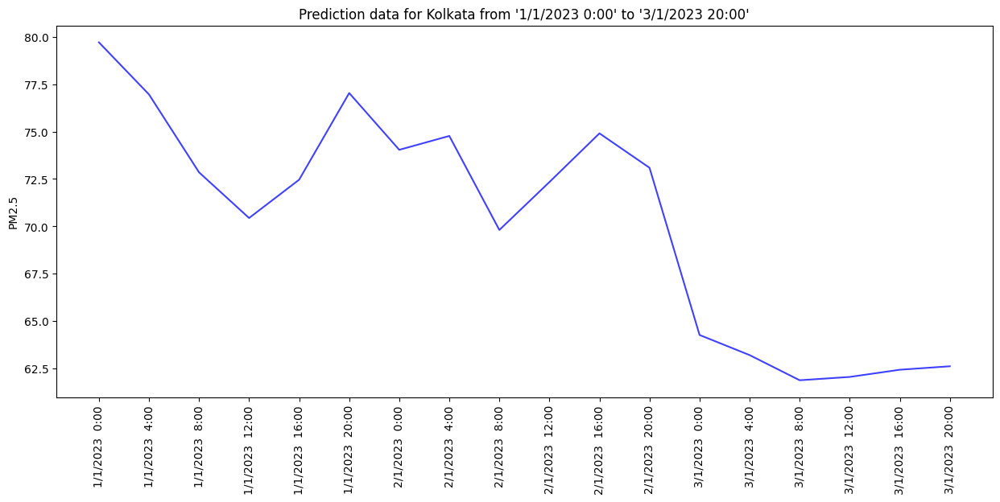

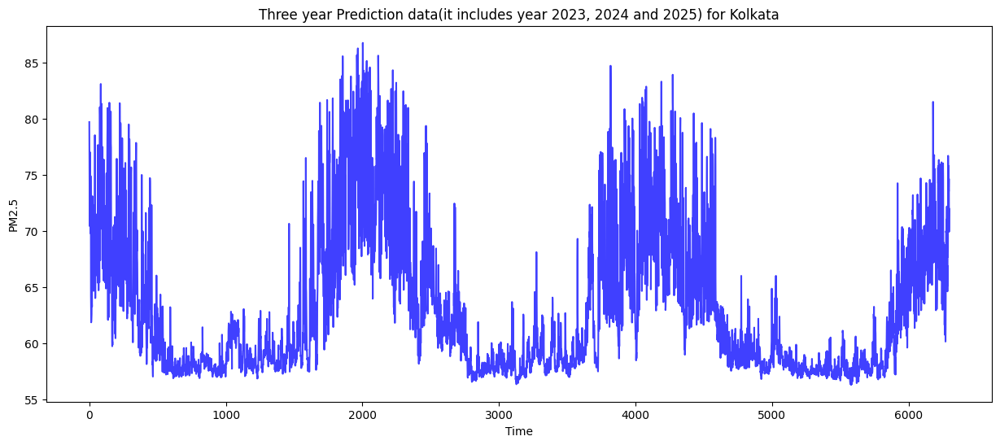

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_41"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_41 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_41 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_123 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_123 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_124 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_124 (Dropout)       (None, 5, 64)             0         
                                                     

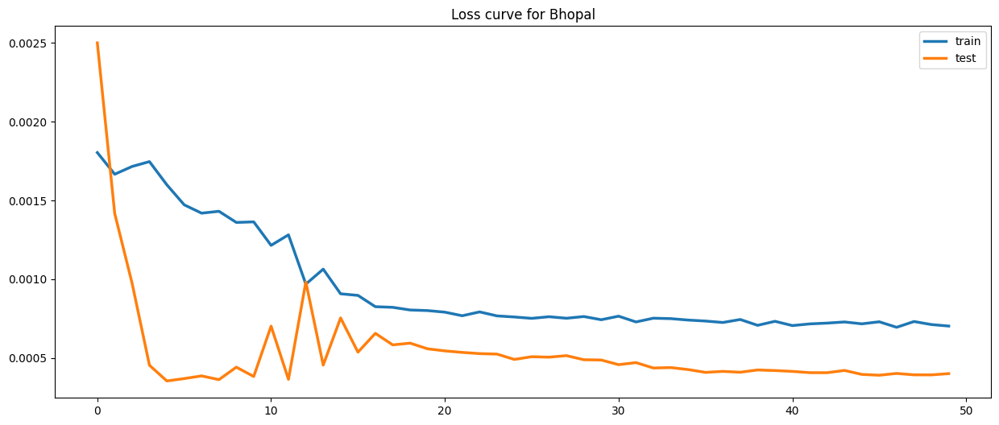

101/101 [==============================] - 2s 9ms/step
(3209, 1)
(3209,)


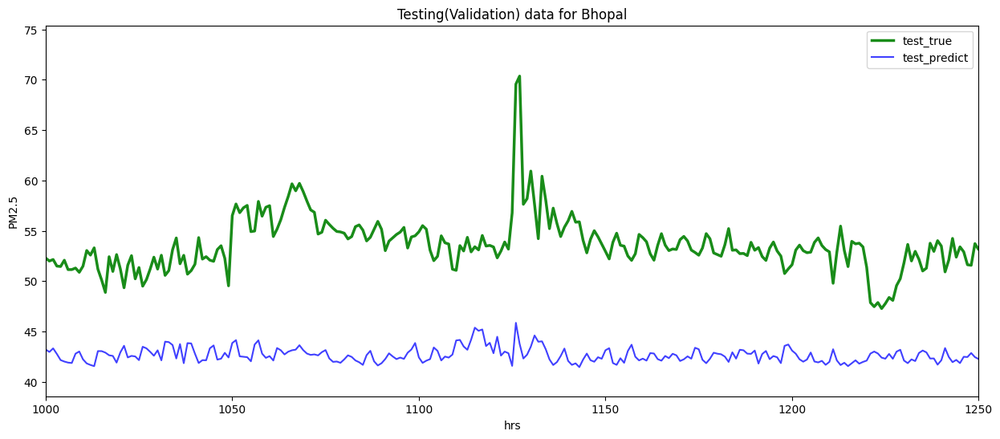

201/201 [==============================] - 2s 9ms/step


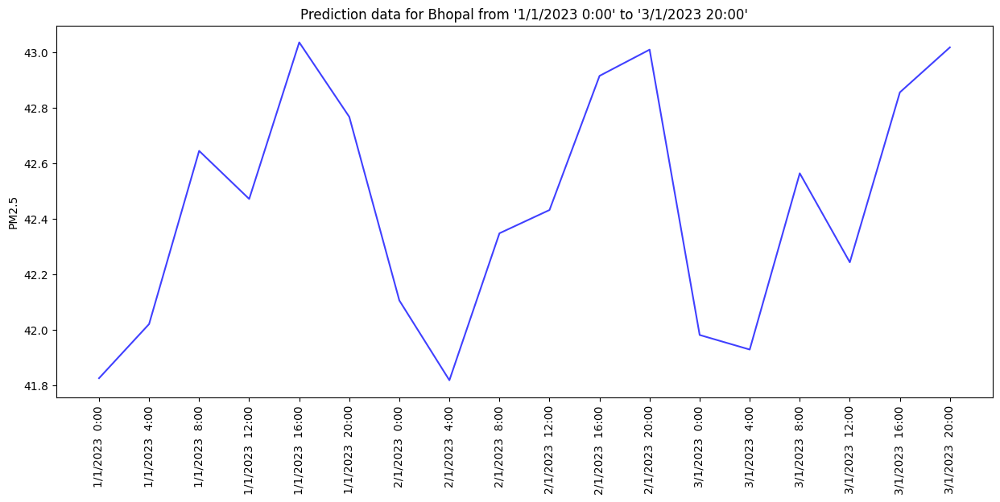

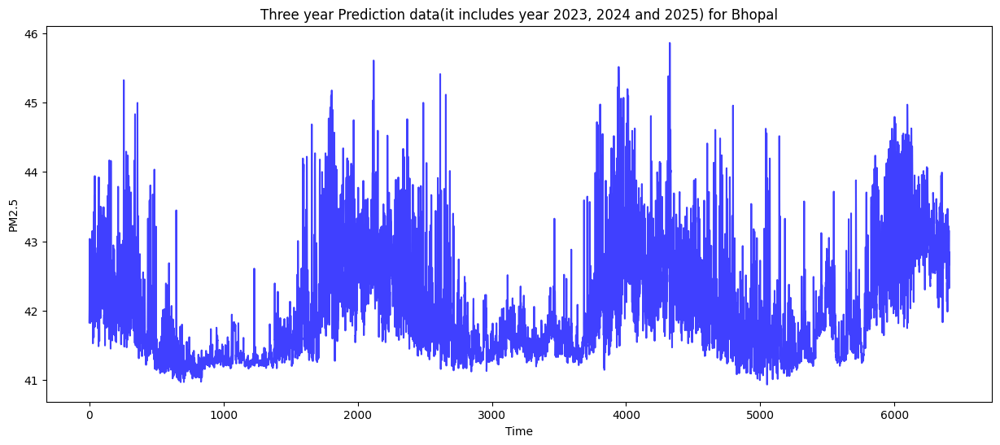

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_42"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_42 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_42 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_126 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_126 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_127 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_127 (Dropout)       (None, 5, 64)             0         
                                                     

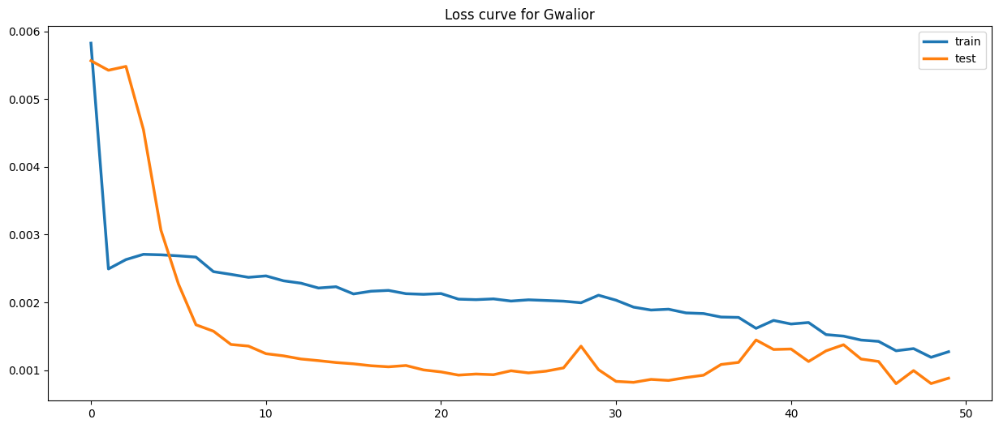

98/98 [==============================] - 3s 11ms/step
(3111, 1)
(3111,)


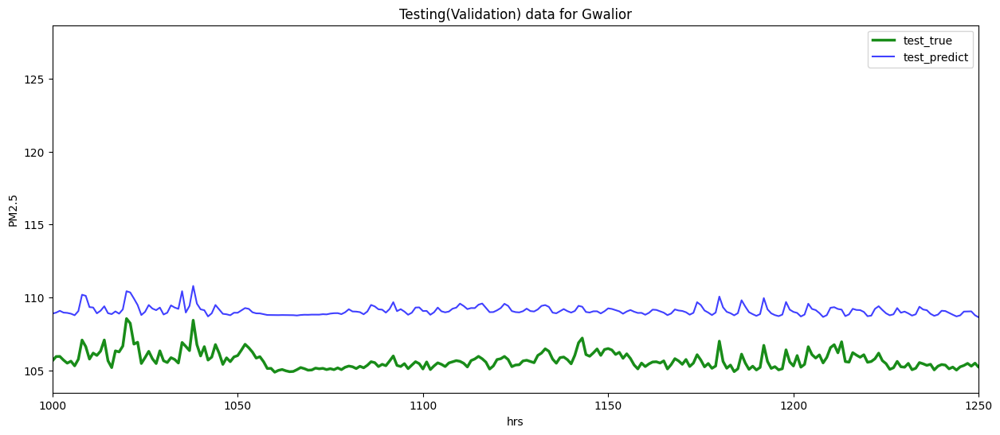

198/198 [==============================] - 2s 11ms/step


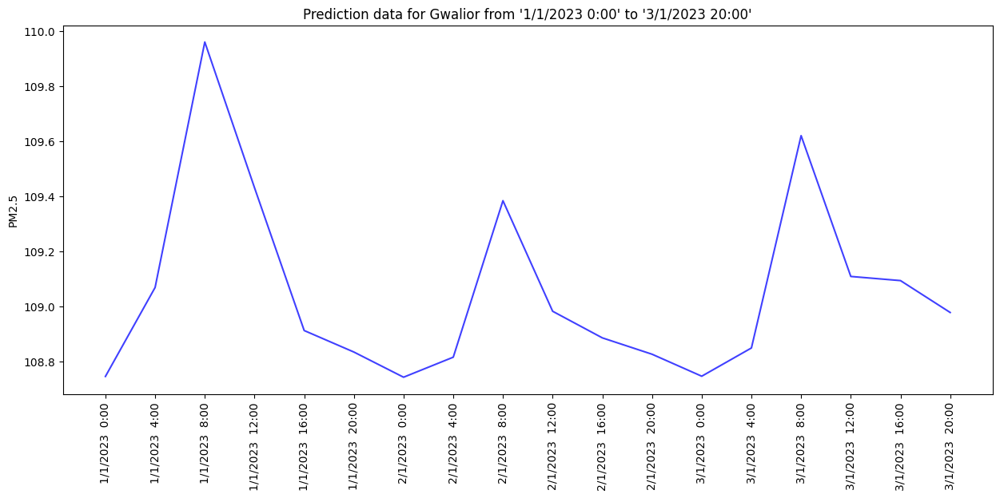

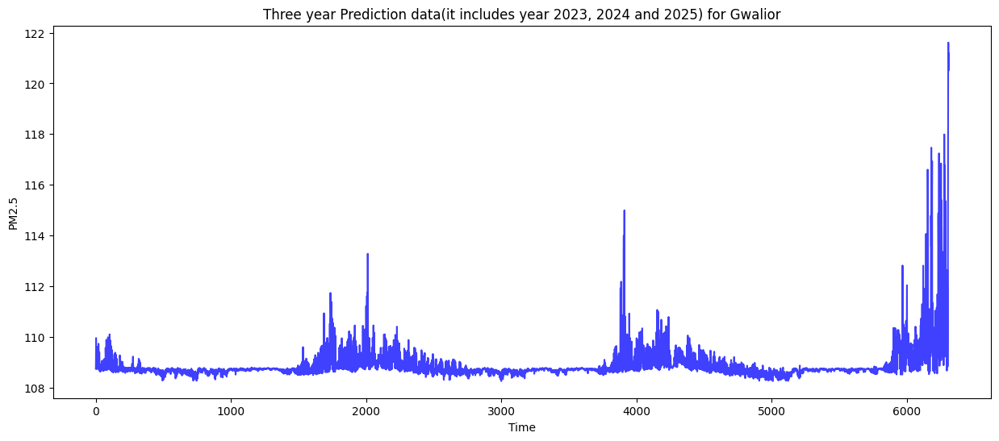

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_43"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_43 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_43 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_129 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_129 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_130 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_130 (Dropout)       (None, 5, 64)             0         
                                                     

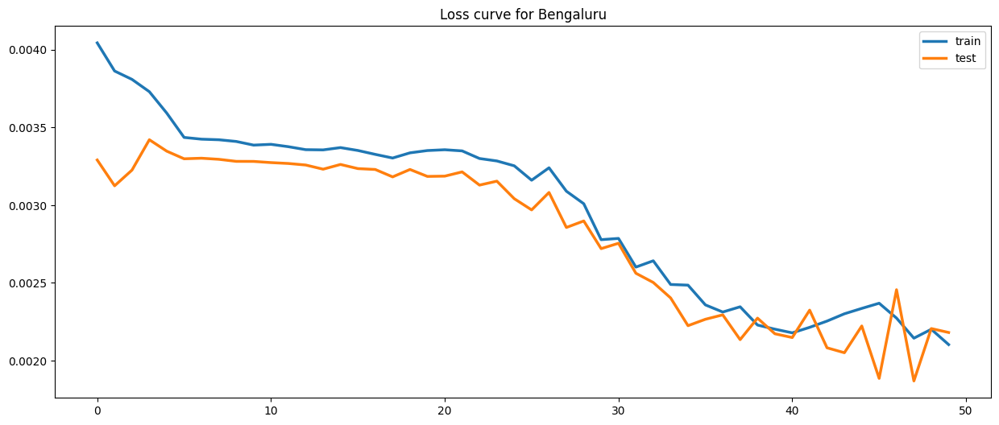

103/103 [==============================] - 2s 9ms/step
(3286, 1)
(3286,)


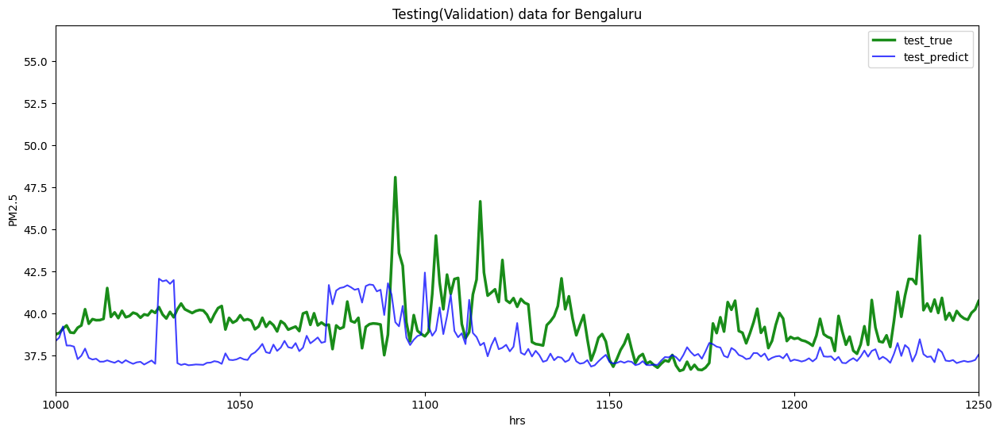

203/203 [==============================] - 2s 9ms/step


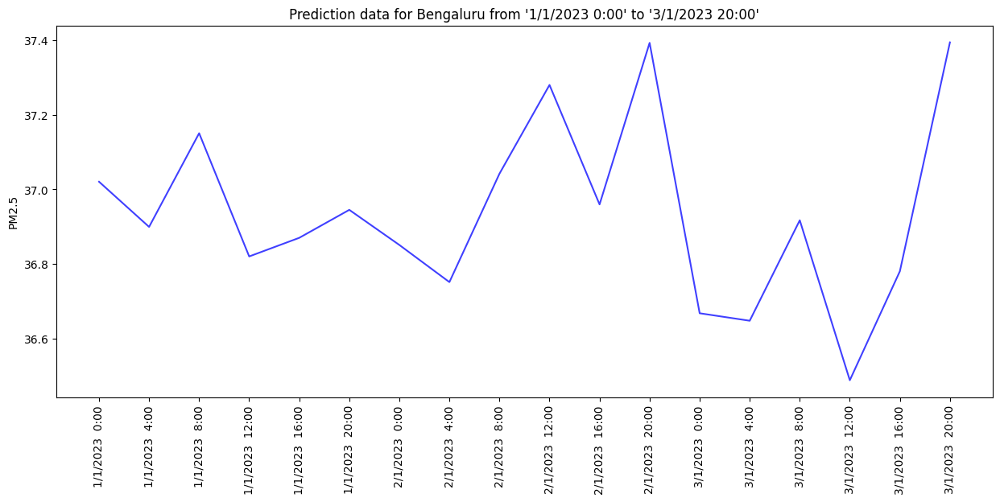

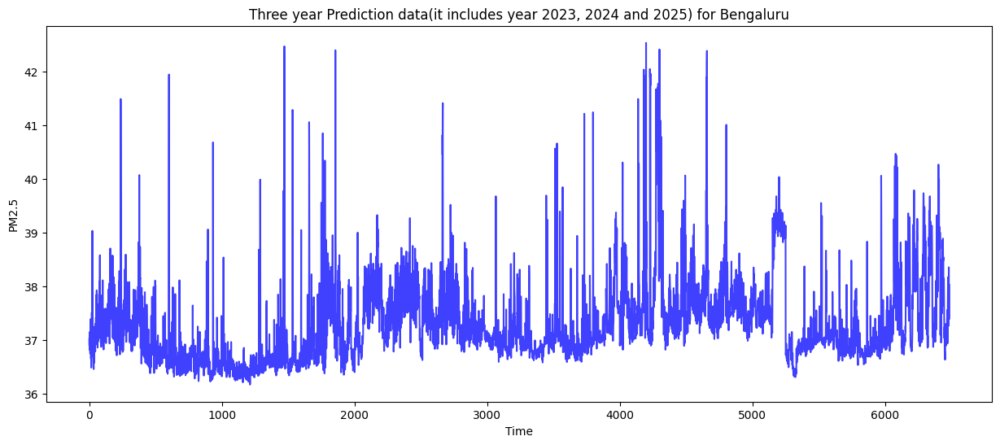

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_44"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_44 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_44 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_132 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_132 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_133 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_133 (Dropout)       (None, 5, 64)             0         
                                                     

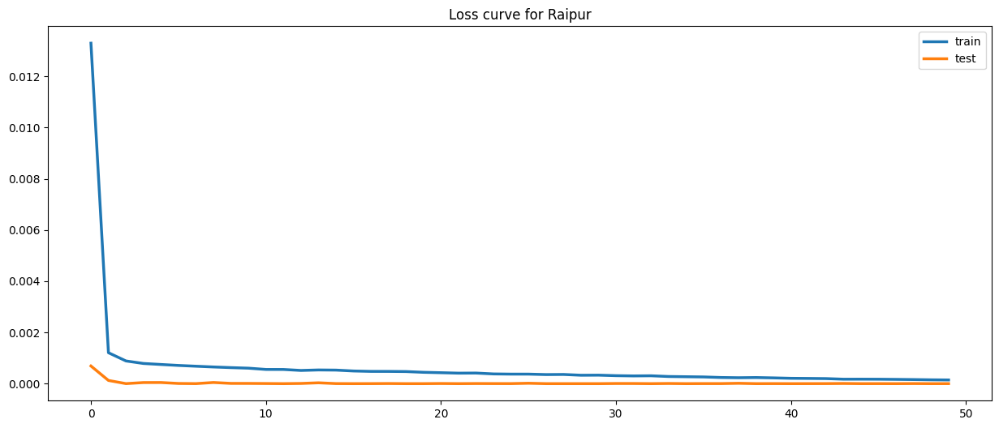

106/106 [==============================] - 3s 11ms/step
(3375, 1)
(3375,)


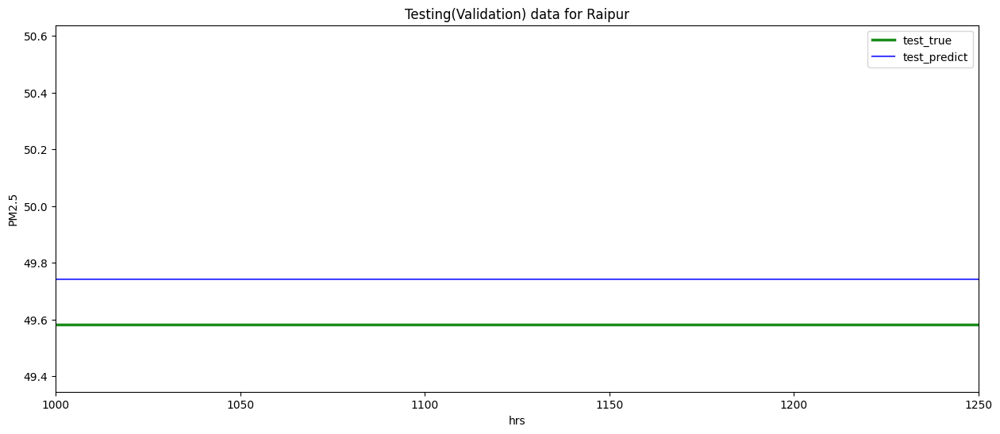

206/206 [==============================] - 2s 9ms/step


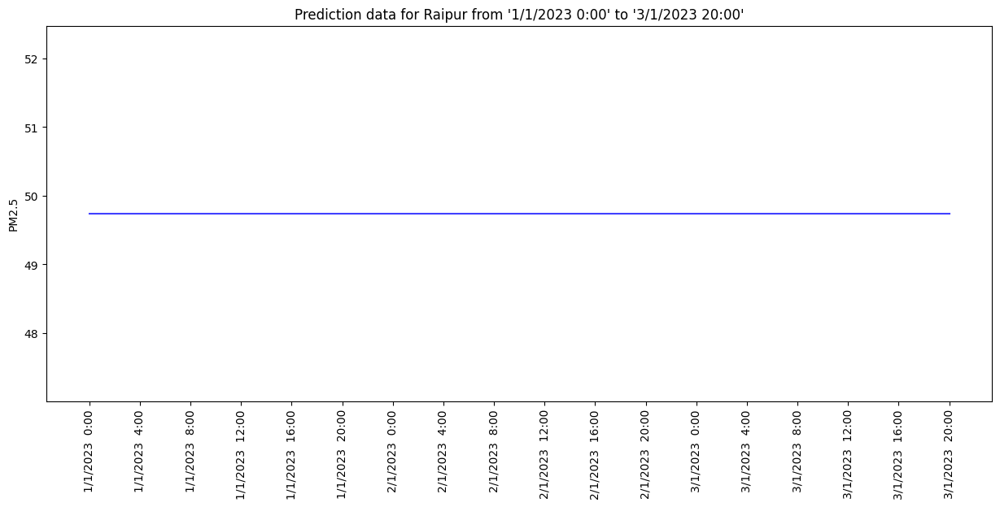

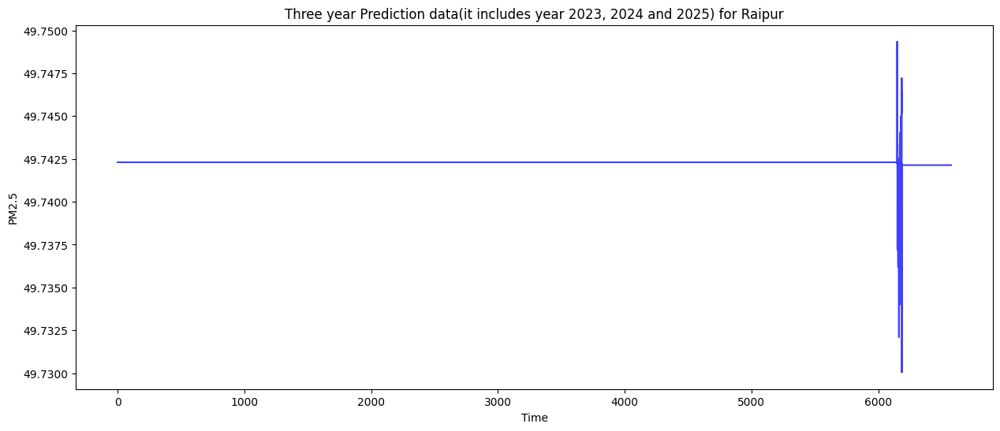

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_45"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_45 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_45 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_135 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_135 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_136 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_136 (Dropout)       (None, 5, 64)             0         
                                                     

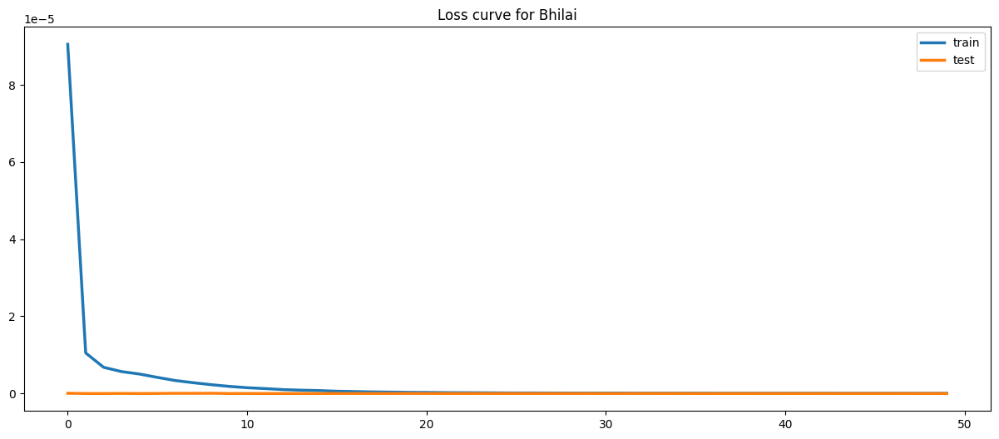

106/106 [==============================] - 2s 10ms/step
(3375, 1)
(3375,)


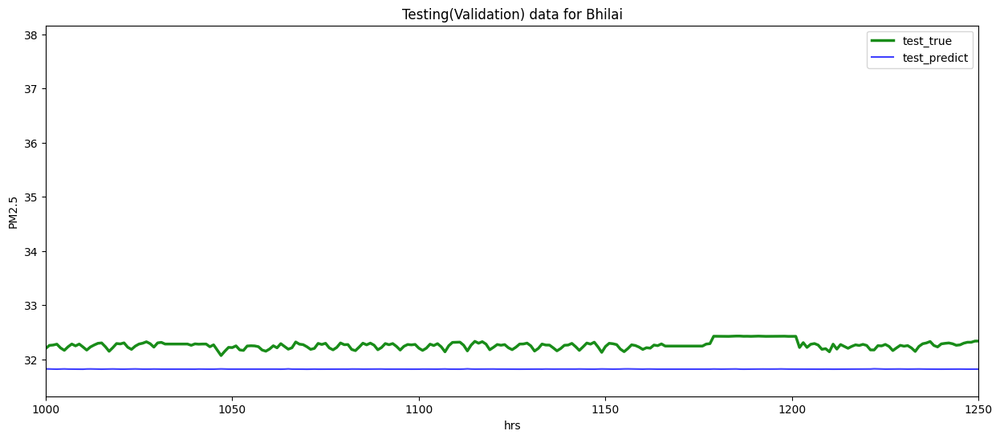

206/206 [==============================] - 2s 11ms/step


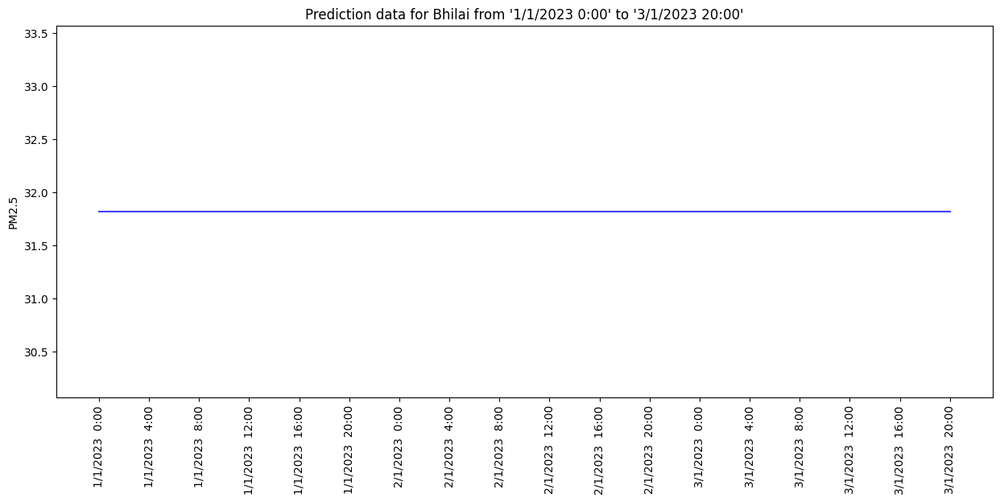

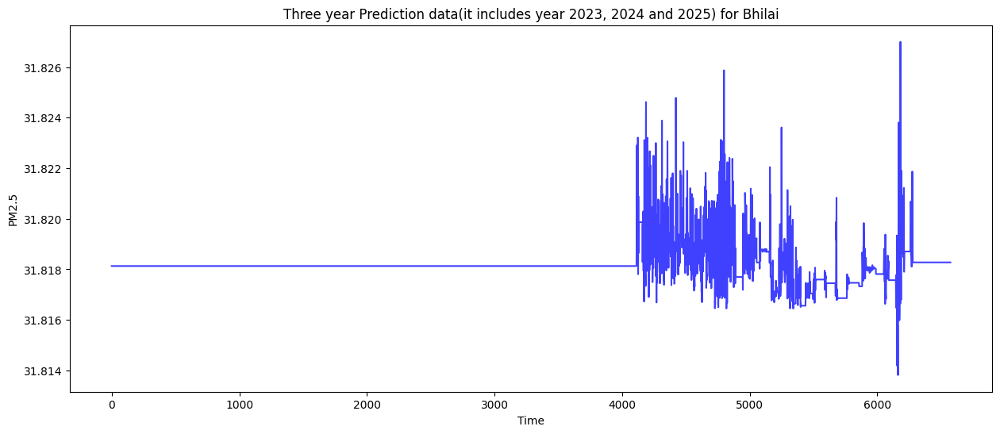

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_46"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_46 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_46 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_138 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_138 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_139 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_139 (Dropout)       (None, 5, 64)             0         
                                                     

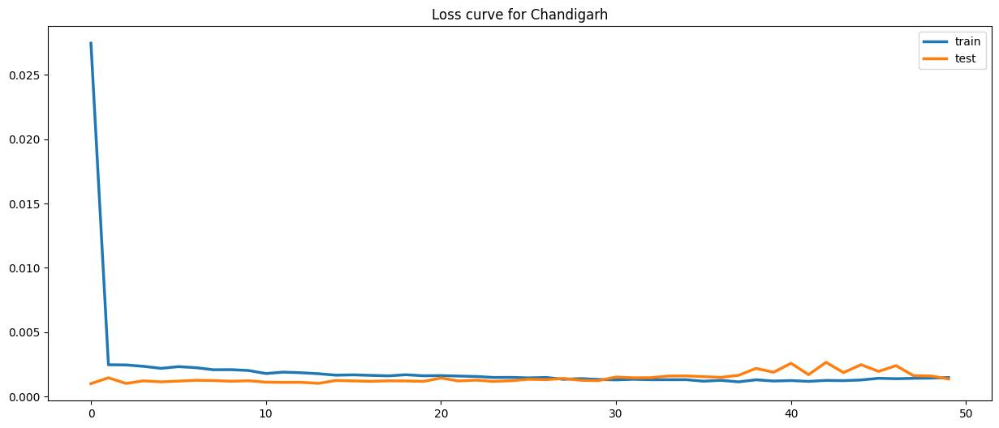

105/105 [==============================] - 2s 9ms/step
(3359, 1)
(3359,)


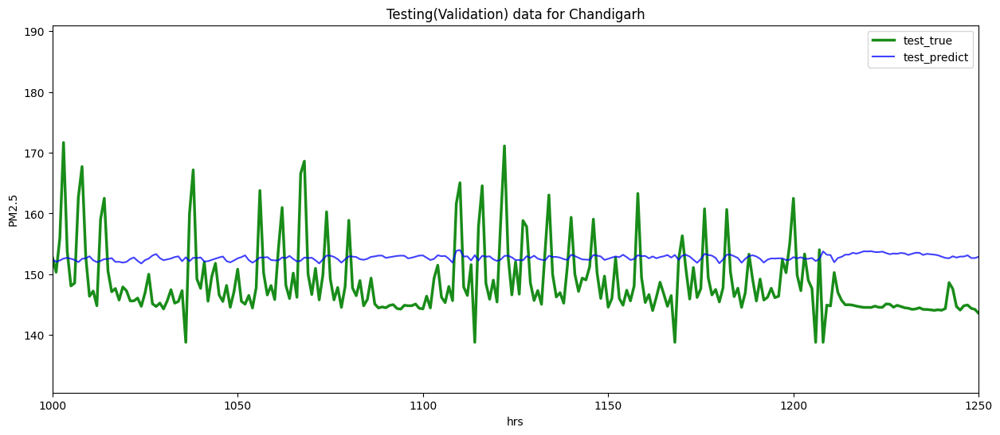

205/205 [==============================] - 2s 9ms/step


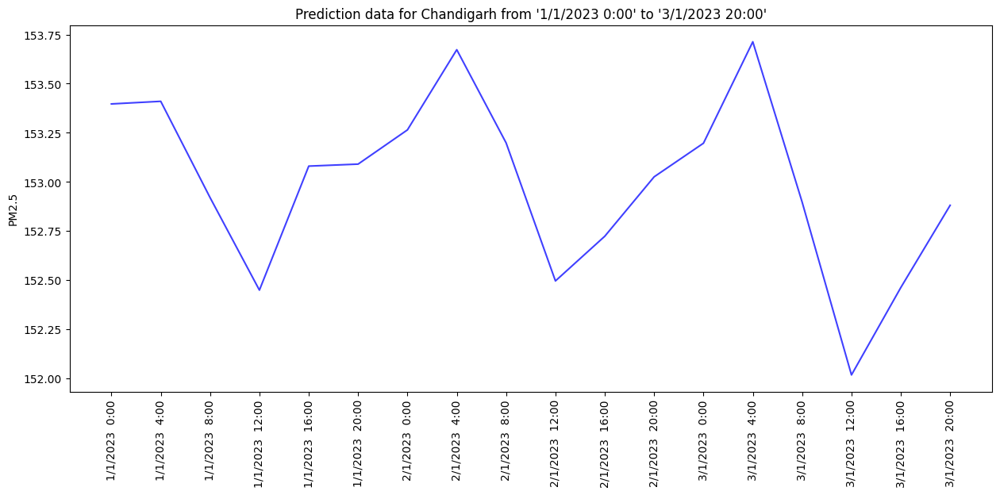

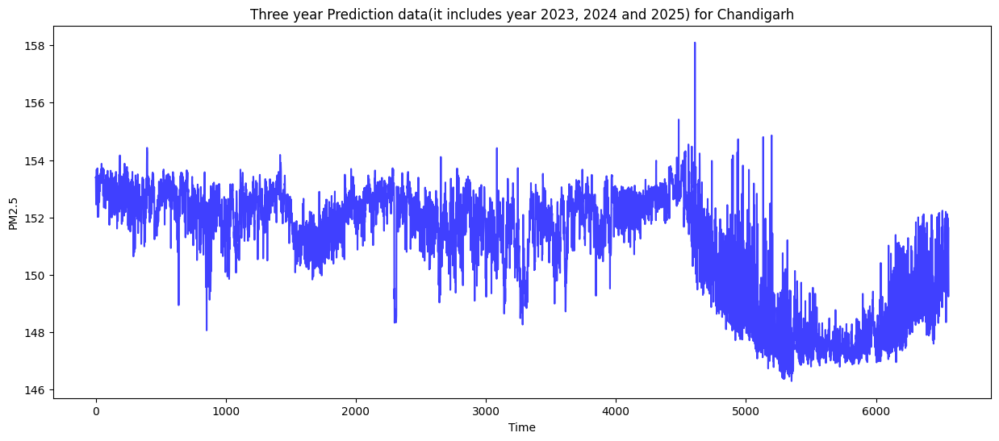

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_47"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_47 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_47 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_141 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_141 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_142 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_142 (Dropout)       (None, 5, 64)             0         
                                                     

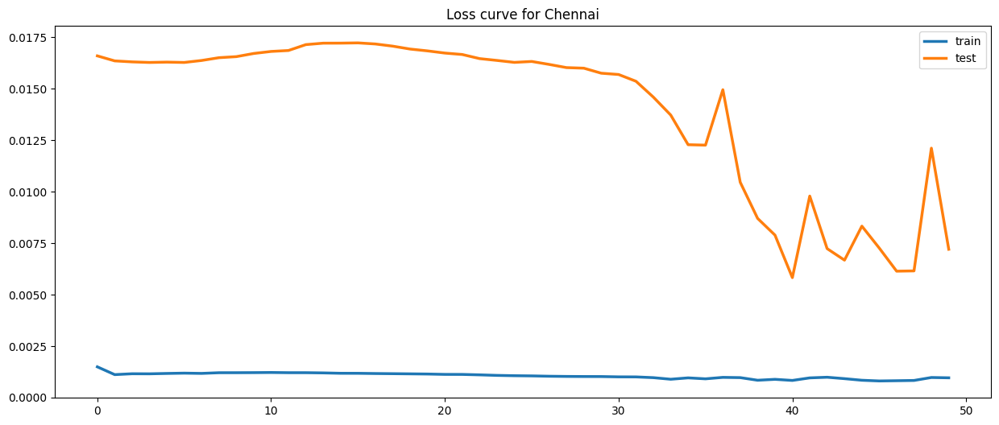

102/102 [==============================] - 3s 11ms/step
(3264, 1)
(3264,)


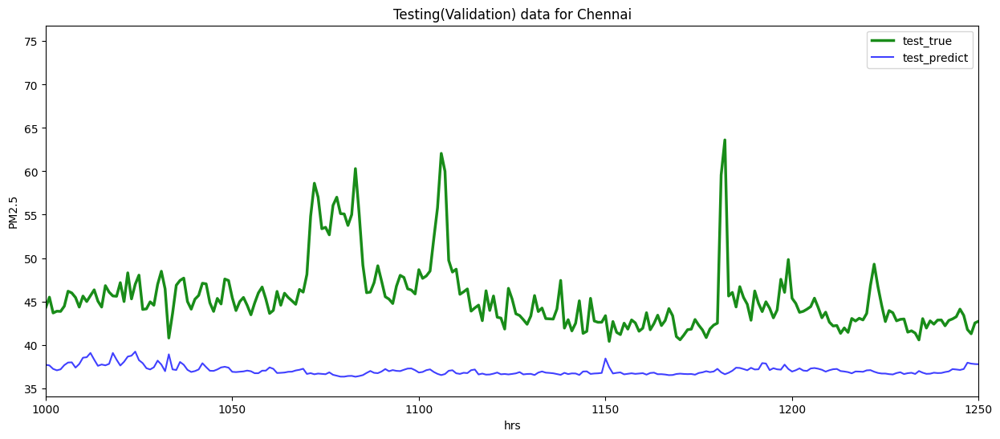

202/202 [==============================] - 2s 10ms/step


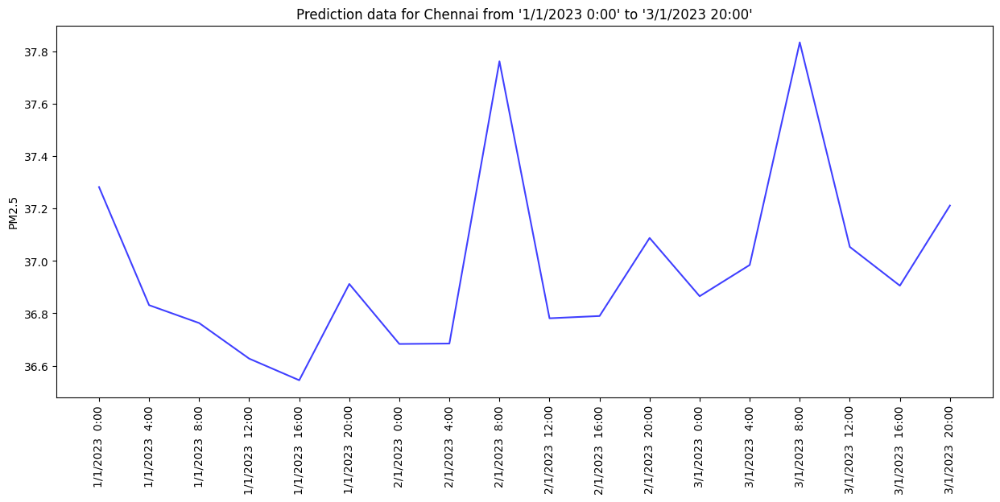

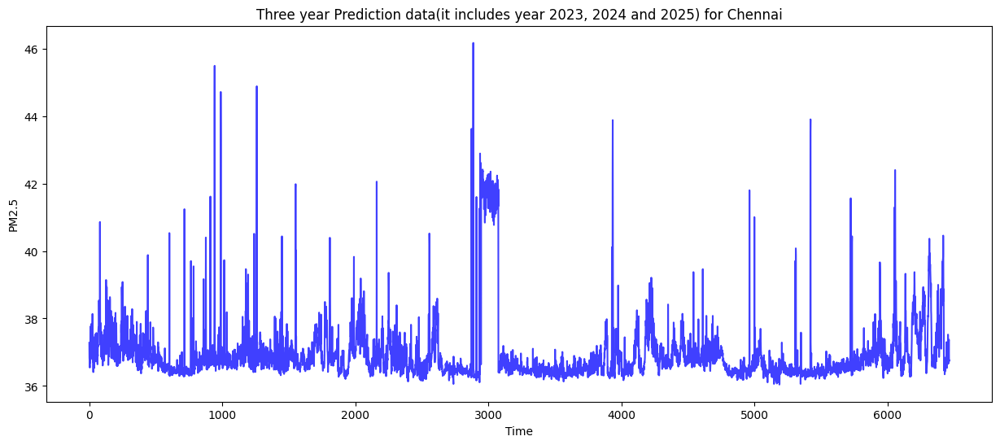

<ipython-input-70-0a2a93f5c6e7>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2.drop(columns ='City',inplace =True)


Model: "sequential_48"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_48 (Conv1D)          (None, 5, 32)             128       
                                                                 
 max_pooling1d_48 (MaxPoolin  (None, 5, 32)            0         
 g1D)                                                            
                                                                 
 lstm_144 (LSTM)             (None, 5, 128)            82432     
                                                                 
 dropout_144 (Dropout)       (None, 5, 128)            0         
                                                                 
 lstm_145 (LSTM)             (None, 5, 64)             49408     
                                                                 
 dropout_145 (Dropout)       (None, 5, 64)             0         
                                                     

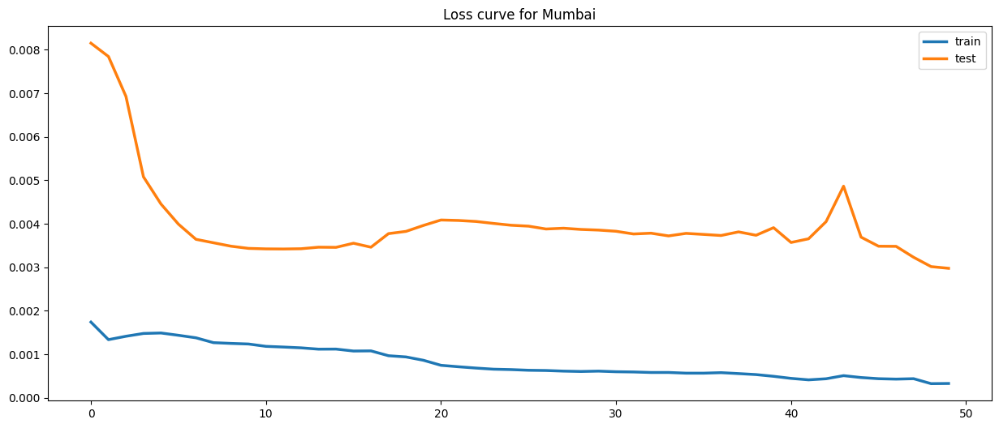

98/98 [==============================] - 2s 9ms/step
(3111, 1)
(3111,)


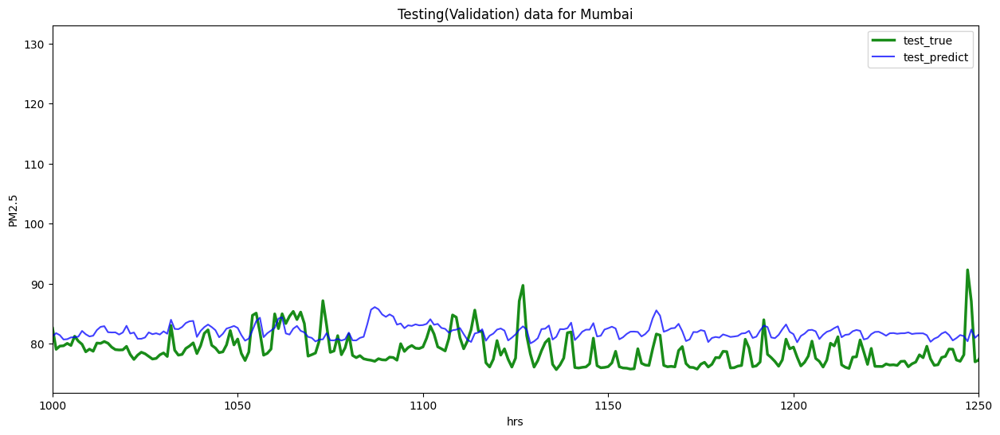

198/198 [==============================] - 2s 9ms/step


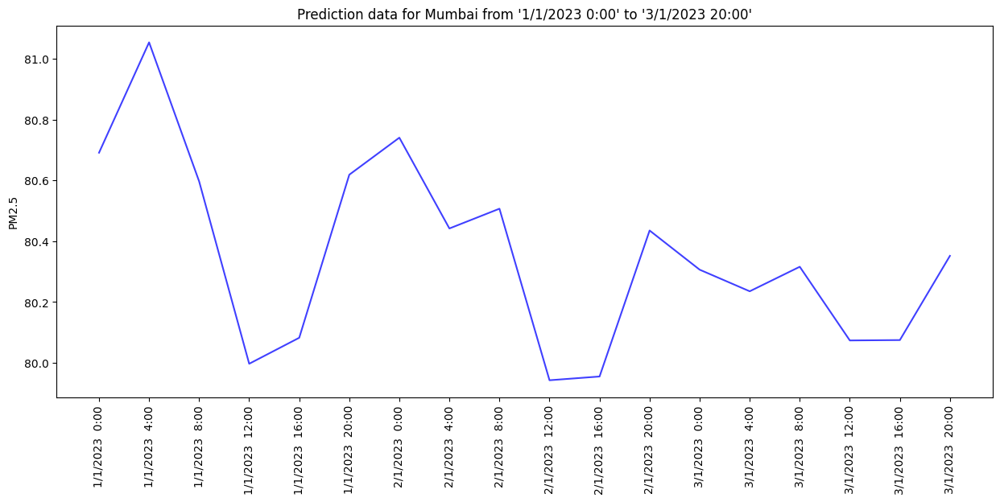

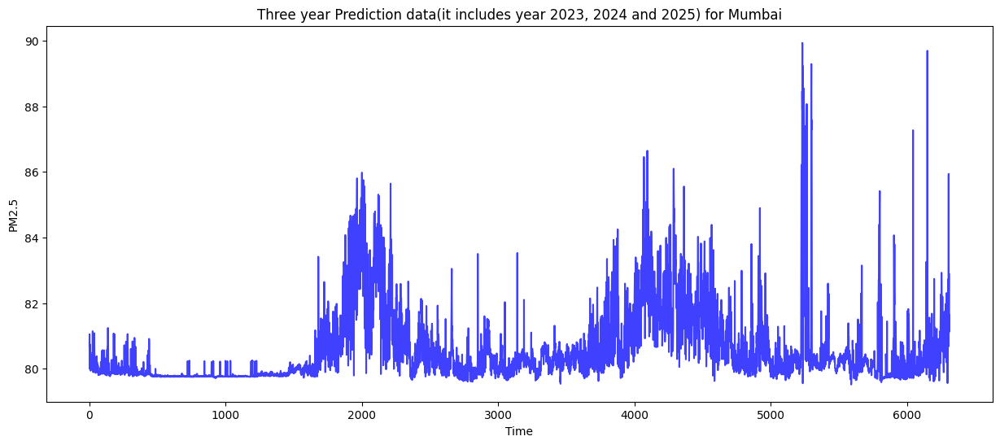

In [ ]:
# Creating dataframes and making predictions for all cities individually
for City in Cities:
  df2 = df[df['City']== City]
  df2.drop(columns ='City',inplace =True)
  dataset = df2
  values = dataset.values

  values = values.astype('float32')
 # scaling 
  scaler = MinMaxScaler(feature_range=(0, 1))
  scaled = scaler.fit_transform(values)
  reframed = series_to_supervised(scaled, 1, 1)
  reframed.drop(reframed.columns[[8,9,10,11,12,13,]], axis=1, inplace=True)
  values = reframed.values
 # splitting data into train and test set
  n_train_hours = 3200
  train = values[:n_train_hours, :]
  test = values[n_train_hours:, :]

  # split into input and outputs
  train_X, train_y = train[:, :-1], train[:, -1]
  test_X, test_y = test[:, :-1], test[:, -1]

  # reshape input to be 3D :- (no. of samples, no. of timesteps, no. of features)
  train_X = train_X.reshape((train_X.shape[0], train_X.shape[1], 1))
  test_X = test_X.reshape((test_X.shape[0], test_X.shape[1], 1))

#CNN -LSTM
  model = Sequential()
  model.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=(train_X.shape[1], train_X.shape[2])))
  model.add(MaxPooling1D(pool_size=1))
  model.add(LSTM(128, return_sequences=True))
  model.add(Dropout(0.2))
  model.add(LSTM(64, return_sequences=True))
  model.add(Dropout(0.2))
  model.add(LSTM(32))
  model.add(Dropout(0.2))
  model.add(Dense(1, activation='linear'))

  model.compile(loss='mse', optimizer='adam')
  print(model.summary())
  # fit network
  history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_split=0.25, verbose=2, shuffle=False)
  # plotting loss curves
  plt.figure(figsize=(15,6))
  plt.plot(history.history['loss'], label='train', linewidth = 2.5)
  plt.plot(history.history['val_loss'], label='test',  linewidth = 2.5)
  plt.title(f"Loss curve for {City}")
  plt.legend()
  plt.show()
  #Prediction
  testPredict = model.predict(test_X)
  print(testPredict.shape)
  testPredict = testPredict.ravel()

  print(testPredict.shape)
  y_test_true = test[:,1]
  poll = np.array(df2["PM2.5"])

 # Changing the scaled output to correct value range
  meanop = poll.mean()
  stdop = poll.std()

  y_test_true = y_test_true*stdop + meanop
  testPredict = testPredict*stdop + meanop

  #plotting test_true and test_prediction values
  from matplotlib import pyplot as plt

  plt.figure(figsize=(15,6))
  plt.xlim([1000,1250])
  plt.ylabel("PM2.5")
  plt.xlabel("hrs")
  plt.plot(y_test_true, c = "g", label="test_true",alpha = 0.90, linewidth = 2.5)
  plt.plot(testPredict, c = "b", label="test_predict", alpha = 0.75)
  plt.title(f"Testing(Validation) data for {City}")
  plt.legend()
  plt.show()

  #Prediction
  values = values[:, :-1]

  values = values.reshape((values.shape[0], values.shape[1], 1))
  testPredict = model.predict(values)
  testPredict = testPredict.ravel()
  testPredict = testPredict*stdop + meanop
  # plotting prediction values of PM2.5 from "1/1/2023 0:00" to "3/1/2023 20:00"
  x_ticks = ['1/1/2023  0:00', '1/1/2023  4:00', '1/1/2023  8:00', '1/1/2023  12:00', '1/1/2023  16:00',
    '1/1/2023  20:00', '2/1/2023  0:00', '2/1/2023  4:00', '2/1/2023  8:00', '2/1/2023  12:00',
    '2/1/2023  16:00', '2/1/2023  20:00', '3/1/2023  0:00', '3/1/2023  4:00', '3/1/2023  8:00',
    '3/1/2023  12:00', '3/1/2023  16:00', '3/1/2023  20:00']
  from matplotlib import pyplot as plt
  plt.figure(figsize=(15,6))
  plt.ylabel("PM2.5")
  plt.plot(testPredict[:18], c = "b", alpha = 0.75)
  plt.title(f"Prediction data for {City} from '1/1/2023 0:00' to '3/1/2023 20:00'")
  plt.xticks(range(len(x_ticks)), x_ticks, rotation=90)
  plt.show()
  df1[City] = testPredict[:18]

 # plotting prediction values of PM2.5 for 3 years i.e from 2023 to 2025.
  plt.figure(figsize=(15,6))
  plt.xlabel('Time')
  plt.ylabel('PM2.5')
  plt.plot(testPredict, c = "b", alpha = 0.75)
  plt.title(f"Three year Prediction data(it includes year 2023, 2024 and 2025) for {City}")
  plt.show()
  


###printing the stored predicted values

In [ ]:
df1

,Delhi,Ahmedabad,Gandhinagar,Lucknow,Varanasi,Meerut,Prayagraj,Ghaziabad,Agra,Noida,Kanpur,Moradabad,Guwahati,Faridabad,Gurugram,Jaipur,Kota,Imphal,Thiruvananthapuram,Agartala,Gaya,Muzaffarpur,Patna,Srinagar,Howrah,Kolkata,Bhopal,Gwalior,Bengaluru,Raipur,Bhilai,Chandigarh,Chennai,Mumbai
0,180.656036,52.672993,59.259090,100.182396,47.141224,116.447220,44.437519,110.016571,58.873329,139.514084,68.556351,119.112267,95.427956,103.316544,101.355293,59.241848,57.022392,26.803633,27.531092,76.376266,114.888672,80.189026,96.033264,61.10677,97.793053,79.704269,41.826279,108.745300,37.020519,49.742306,31.81813,153.396942,37.282387,80.691170
1,184.594406,52.672245,59.255165,103.731369,47.074150,111.034134,44.437519,119.513512,58.793262,135.542953,65.692429,119.112267,94.137260,103.316544,101.311699,59.338459,57.459507,26.803633,27.439705,76.376266,114.888672,80.189026,95.361786,61.10677,88.406158,76.957855,42.021030,109.068825,36.899242,49.742306,31.81813,153.410248,36.831268,81.054283
2,149.769592,52.674187,59.257587,96.476875,47.046940,111.281624,44.437519,141.766144,58.918190,131.640015,66.590767,119.112267,93.640686,103.316544,101.457779,59.482288,57.945229,26.803633,27.454281,76.376266,114.888672,80.189026,95.558899,61.10677,81.862221,72.847969,42.644058,109.961212,37.150665,49.742306,31.81813,152.920151,36.762932,80.596893
3,155.749390,52.673203,59.250740,92.147003,46.981846,98.475365,44.437519,140.395432,58.595734,107.774895,65.989136,119.112267,92.818794,103.316544,100.987923,59.438442,57.571030,26.803633,27.514864,76.376266,114.888672,80.189026,96.419540,61.10677,76.639282,70.438690,42.471062,109.431664,36.819950,49.742306,31.81813,152.449356,36.627014,79.996849
4,192.670654,52.676601,59.258862,95.765327,47.013645,105.722488,44.437519,138.781891,58.604942,108.588120,69.773285,119.112267,92.892014,103.316544,101.079842,59.992523,57.956837,26.803633,27.508949,76.376266,114.888672,80.189026,96.929832,61.10677,85.301788,72.459312,43.034336,108.912231,36.869877,49.742306,31.81813,153.080490,36.544430,80.082405
5,181.712952,52.676819,59.258308,100.478439,47.250961,113.009003,44.437519,142.013733,58.335320,141.208618,68.532608,119.112267,93.145737,103.316544,100.940788,59.500916,58.052124,26.803633,27.590660,76.376266,114.888672,80.189026,98.654007,61.10677,91.586685,77.031555,42.766296,108.834076,36.944984,49.742306,31.81813,153.090637,36.912125,80.618851
6,167.473877,52.672455,59.263046,97.641968,47.264553,108.360207,44.437519,125.282761,58.698994,142.146667,65.547874,119.112267,93.239761,103.316544,100.938461,59.001900,57.617611,26.803633,27.440058,76.376266,114.888672,80.189026,96.608009,61.10677,84.827881,74.035934,42.105965,108.742523,36.850769,49.742306,31.81813,153.264771,36.682972,80.740692
7,164.402008,52.672672,59.258068,92.231644,47.201286,106.990776,44.437519,121.803818,58.842934,133.355865,64.783356,119.112267,93.179291,103.316544,101.367569,58.654934,57.329594,26.803633,27.339148,76.376266,114.888672,80.189026,95.711311,61.10677,82.514458,74.767502,41.819012,108.815346,36.751068,49.742306,31.81813,153.672836,36.684620,80.441978
8,148.591965,52.673470,59.263344,92.587044,47.109081,108.828926,44.437519,131.617081,58.822891,134.557281,65.842690,119.112267,93.019600,103.316544,101.403816,59.183723,57.551640,26.803633,27.377735,76.376266,114.888672,80.426453,95.852516,61.10677,82.375626,69.807732,42.347614,109.384331,37.041973,49.742306,31.81813,153.198700,37.762516,80.506966
9,168.162231,52.670910,59.272026,91.083656,47.030998,98.796738,44.437519,125.904312,58.984188,106.109406,63.400146,119.112267,92.751411,103.316544,101.239891,57.526951,58.229568,26.803633,27.152033,76.376266,114.888672,80.426453,95.058083,61.10677,78.366859,72.335205,42.431347,108.982300,37.280239,49.742306,31.81813,152.496124,36.781078,79.942596


In [ ]:
df1.to_excel("cities@final.xlsx")